In [1]:
from multi_imbalance.datasets import load_datasets
import experiment_v4 as ex
from sklearn.model_selection import StratifiedKFold
from collections import Counter, defaultdict
from multi_imbalance.utils.metrics import gmean_score
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from utils import plot_embeddings
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.datasets.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.datasets. Anything that cannot be imported from sklearn.datasets is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
datasets = load_datasets()

In [3]:
ds_name = 'new_vehicle'
test_on_all_folds = True
test_all_ds = True

In [4]:
datasets = ex.one_hot_encode_all(datasets)

In [5]:
config = ex.config_calculation_strategy2(datasets)

In [6]:
config['cmc'] = {'nn_config': {'units_1st_layer': 17,
                               'units_2nd_layer': 256,
                               'units_3rd_layer': 128,
                               'units_latent_layer': 8},
                 'weighted_triplet_loss': True,
                 'lr': 0.0002,
                 'batch_size': 16,
                 'gamma': 0.99,
                 'epochs': 55}


config['dermatology'] = {'nn_config': {'units_1st_layer': 97,
                                       'units_2nd_layer': 512,
                                       'units_3rd_layer': 256,
                                       'units_latent_layer': 16},
                         'weighted_triplet_loss': True,
                         'lr': 0.0010,
                         'batch_size': 16,
                         'gamma': 0.99,
                         'epochs': 45}

config['hayes-roth'] = {'nn_config': {'units_1st_layer': 11,
                                      'units_2nd_layer': 128,
                                      'units_3rd_layer': 64,
                                      'units_latent_layer': 16},
                        'weighted_triplet_loss': True,
                        'lr': 0.0015,
                        'batch_size': 16,
                        'gamma': 0.99,
                        'epochs': 300}

config['new_vehicle'] = {'nn_config': {'units_1st_layer': 18,
                                       'units_2nd_layer': 256,
                                       'units_3rd_layer': 128,
                                       'units_latent_layer': 16},
                         'weighted_triplet_loss': True,
                         'lr': 0.001,
                         'batch_size': 16,
                         'gamma': 0.99,
                         'epochs': 150}

config['new_yeast'] = {'nn_config': {'units_1st_layer': 9,
                                     'units_2nd_layer': 300,
                                     'units_3rd_layer': 200,
                                     'units_latent_layer': 12},
                       'weighted_triplet_loss': True,
                       'lr': 0.0004,
                       'batch_size': 32,
                       'gamma': 0.99,
                       'epochs': 60}

config['balance-scale'] = {'nn_config': {'units_1st_layer': 16,
                                         'units_2nd_layer': 256,
                                         'units_3rd_layer': 128,
                                         'units_latent_layer': 10},
                           'weighted_triplet_loss': True,
                           'lr': 0.007,
                           'batch_size': 16,
                           'gamma': 0.99,
                           'epochs': 100}

config['cleveland'] = {'nn_config': {'units_1st_layer': 24,
                                     'units_2nd_layer': 72,
                                     'units_3rd_layer': 48,
                                     'units_latent_layer': 16},
                       'weighted_triplet_loss': True,
                       'lr': 0.00002,
                       'batch_size': 16,
                       'gamma': 0.99,
                       'epochs': 120}

config['cleveland_v2'] = {'nn_config': {'units_1st_layer': 23,
                                        'units_2nd_layer': 256,
                                        'units_3rd_layer': 128,
                                        'units_latent_layer': 16},
                          'weighted_triplet_loss': True,
                          'lr': 0.00002,
                          'batch_size': 16,
                          'gamma': 0.99,
                          'epochs': 100}

config['glass'] = {'nn_config': {'units_1st_layer': 9,
                                 'units_2nd_layer': 256,
                                 'units_3rd_layer': 128,
                                 'units_latent_layer': 12},
                   'weighted_triplet_loss': True,
                   'lr': 0.001,
                   'batch_size': 16,
                   'gamma': 0.99,
                   'epochs': 120}

config['thyroid-newthyroid'] = {'nn_config': {'units_1st_layer': 5,
                                              'units_2nd_layer': 64,
                                              'units_3rd_layer': 32,
                                              'units_latent_layer': 8},
                                'weighted_triplet_loss': True,
                                'lr': 0.001,
                                'batch_size': 16,
                                'gamma': 0.99,
                                'epochs': 120}

config['new_ecoli'] = {'nn_config': {'units_1st_layer': 7,
                                     'units_2nd_layer': 128,
                                     'units_3rd_layer': 64,
                                     'units_latent_layer': 12},
                       'weighted_triplet_loss': True,
                       'lr': 0.0001,
                       'batch_size': 16,
                       'gamma': 0.99,
                       'epochs': 100}

config['new_led7digit'] = {'nn_config': {'units_1st_layer': 7,
                                         'units_2nd_layer': 64,
                                         'units_3rd_layer': 32,
                                         'units_latent_layer': 8},
                           'weighted_triplet_loss': True,
                           'lr': 0.001,
                           'batch_size': 16,
                           'gamma': 0.99,
                           'epochs': 100}

config['new_winequality-red'] = {'nn_config': {'units_1st_layer': 11,
                                               'units_2nd_layer': 128,
                                               'units_3rd_layer': 64,
                                               'units_latent_layer': 12},
                                 'weighted_triplet_loss': True,
                                 'lr': 0.003,
                                 'batch_size': 16,
                                 'gamma': 0.99,
                                 'epochs': 100}

config['4delikatne-bezover-cut'] = {'nn_config': {'units_1st_layer': 2,
                                                  'units_2nd_layer': 128,
                                                  'units_3rd_layer': 64,
                                                  'units_latent_layer': 8},
                                    'weighted_triplet_loss': True,
                                    'lr': 0.004,
                                    'batch_size': 16,
                                    'gamma': 0.99,
                                    'epochs': 120}

config['3mocniej-cut'] = {'nn_config': {'units_1st_layer': 2,
                                        'units_2nd_layer': 128,
                                        'units_3rd_layer': 64,
                                        'units_latent_layer': 10},
                          'weighted_triplet_loss': True,
                          'lr': 0.04,
                          'batch_size': 16,
                          'gamma': 0.99,
                          'epochs': 90}


config['1czysty-cut'] = {'nn_config': {'units_1st_layer': 2,
                                       'units_2nd_layer': 64,
                                       'units_3rd_layer': 32,
                                       'units_latent_layer': 8},
                         'weighted_triplet_loss': True,
                         'lr': 0.004,
                         'batch_size': 16,
                         'gamma': 0.99,
                         'epochs': 130}

config['2delikatne-cut'] = {'nn_config': {'units_1st_layer': 2,
                                          'units_2nd_layer': 128,
                                          'units_3rd_layer': 64,
                                          'units_latent_layer': 12},
                            'weighted_triplet_loss': True,
                            'lr': 0.04,
                            'batch_size': 16,
                            'gamma': 0.99,
                            'epochs': 90}

In [7]:
config

{'1czysty-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 64,
   'units_3rd_layer': 32,
   'units_latent_layer': 8},
  'weighted_triplet_loss': True,
  'lr': 0.004,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 130},
 '2delikatne-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 12},
  'weighted_triplet_loss': True,
  'lr': 0.04,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 90},
 '3mocniej-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 10},
  'weighted_triplet_loss': True,
  'lr': 0.04,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 90},
 '4delikatne-bezover-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 8},
  'weighted_triplet_loss': True,
  'lr': 0.004,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 120},
 'balance-scale': {'nn_config': {'un

In [8]:
def instantiate_classifiers():
    classifiers = {
            "RF24": RandomForestClassifier(random_state=0, min_samples_leaf=2, min_samples_split=4, class_weight='balanced'),
            "DT": DecisionTreeClassifier(random_state=0, min_samples_split=4, min_samples_leaf=2, class_weight='balanced'),
            "KNN": KNeighborsClassifier(n_neighbors=1),
            "QDA": QuadraticDiscriminantAnalysis(),
            "LDA": LinearDiscriminantAnalysis()
        } 
    return classifiers

In [9]:
from experiment import dt_name_to_cols_to_encode


In [10]:
from sklearn.neighbors import KNeighborsClassifier

def calc_safety5(X,y):
    result = {
        "safe":0,
        "borderline":0,
        "rare":0,
        "outlier":0
    }
    neigh = KNeighborsClassifier(n_neighbors=5)
    neigh.fit(X, y)
    neighbors = neigh.kneighbors(X, 5+1, False)
    for i, (x, nbors) in enumerate(list(zip(X, neighbors))):
#         print(x)
#         print(y[i])
#         print(nbors[1:])
#         print(y[nbors[1:]])
        same_class_nbrs = (y[nbors[1:]] == y[i]).sum()
        if same_class_nbrs >= 4:
            result['safe'] += 1
        elif same_class_nbrs >= 2:
            result['borderline'] += 1
        elif same_class_nbrs == 1:
            result['rare'] += 1
        else:
            result['outlier'] += 1
    return result

In [11]:
def standardize(X_train, X_test):
    means = X_train.mean(axis=0)
    stds = X_train.std(axis=0)
    return (X_train - means) / (stds+1e-6), (X_test - means) / (stds + 1e-6)

cmc


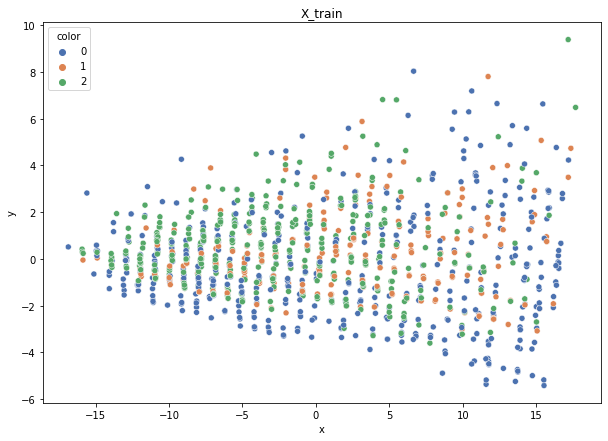

Class cardinalities: Counter({0: 503, 2: 409, 1: 266})
Weights: {0: 0.2426709552796112, 1: 0.45888530265279864, 2: 0.29844374206759033}


100%|██████████| 295/295 [00:00<00:00, 3396.24it/s]


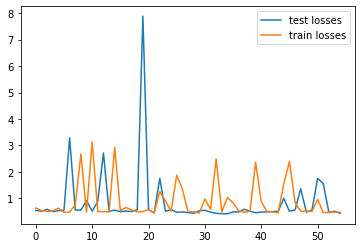

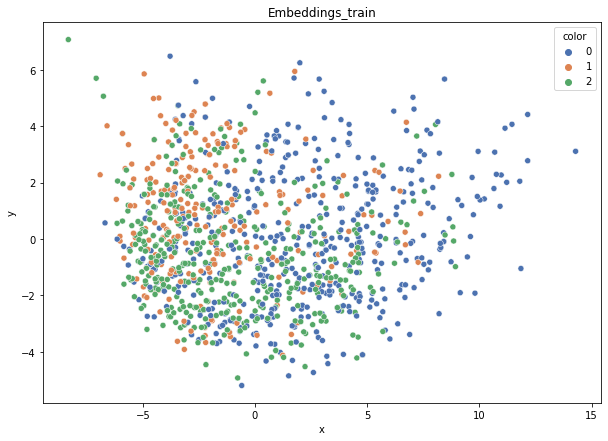

DT-f1-new-features: 0.407
DT-f1-old+new-features: 0.465
DT-f1-old-features: 0.469
DT-gmean-new-features: 0.409
DT-gmean-old+new-features: 0.465
DT-gmean-old-features: 0.467
KNN-f1-new-features: 0.41
KNN-f1-old+new-features: 0.447
KNN-f1-old-features: 0.431
KNN-gmean-new-features: 0.405
KNN-gmean-old+new-features: 0.445
KNN-gmean-old-features: 0.425
LDA-f1-new-features: 0.482
LDA-f1-old+new-features: 0.472
LDA-f1-old-features: 0.482
LDA-gmean-new-features: 0.474
LDA-gmean-old+new-features: 0.467
LDA-gmean-old-features: 0.47
QDA-f1-new-features: 0.477
QDA-f1-old+new-features: 0.474
QDA-f1-old-features: 0.483
QDA-gmean-new-features: 0.487
QDA-gmean-old+new-features: 0.486
QDA-gmean-old-features: 0.496
RF24-f1-new-features: 0.446
RF24-f1-old+new-features: 0.501
RF24-f1-old-features: 0.519
RF24-gmean-new-features: 0.438
RF24-gmean-old+new-features: 0.498
RF24-gmean-old-features: 0.523


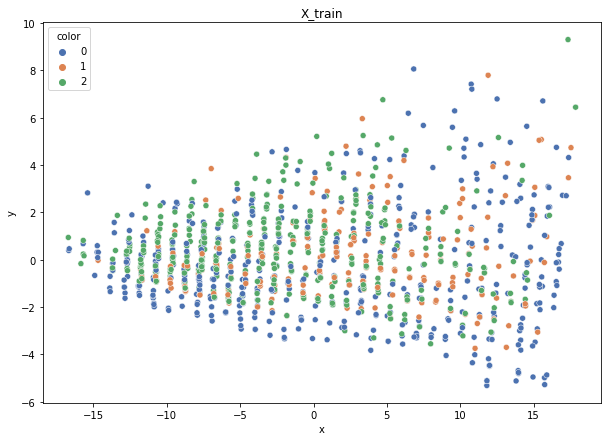

Class cardinalities: Counter({0: 503, 2: 409, 1: 266})
Weights: {0: 0.2426709552796112, 1: 0.45888530265279864, 2: 0.29844374206759033}


100%|██████████| 295/295 [00:00<00:00, 3452.03it/s]


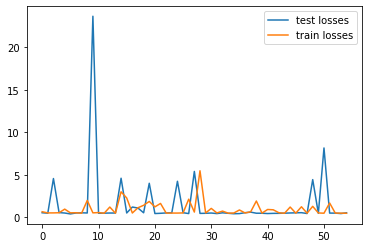

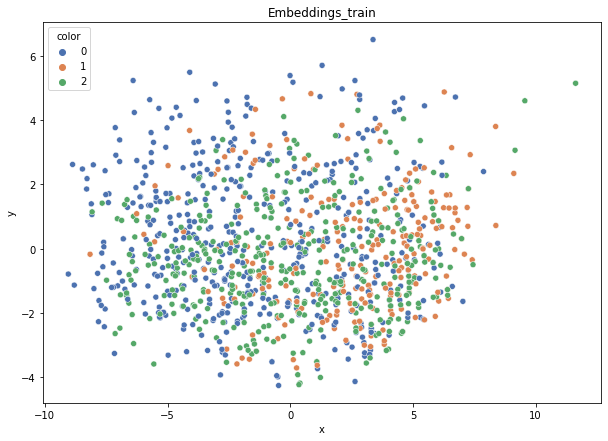

DT-f1-new-features: 0.455
DT-f1-old+new-features: 0.491
DT-f1-old-features: 0.491
DT-gmean-new-features: 0.45
DT-gmean-old+new-features: 0.49
DT-gmean-old-features: 0.503
KNN-f1-new-features: 0.429
KNN-f1-old+new-features: 0.412
KNN-f1-old-features: 0.443
KNN-gmean-new-features: 0.425
KNN-gmean-old+new-features: 0.401
KNN-gmean-old-features: 0.433
LDA-f1-new-features: 0.489
LDA-f1-old+new-features: 0.502
LDA-f1-old-features: 0.501
LDA-gmean-new-features: 0.483
LDA-gmean-old+new-features: 0.5
LDA-gmean-old-features: 0.49
QDA-f1-new-features: 0.478
QDA-f1-old+new-features: 0.475
QDA-f1-old-features: 0.513
QDA-gmean-new-features: 0.487
QDA-gmean-old+new-features: 0.485
QDA-gmean-old-features: 0.528
RF24-f1-new-features: 0.492
RF24-f1-old+new-features: 0.536
RF24-f1-old-features: 0.508
RF24-gmean-new-features: 0.491
RF24-gmean-old+new-features: 0.532
RF24-gmean-old-features: 0.512


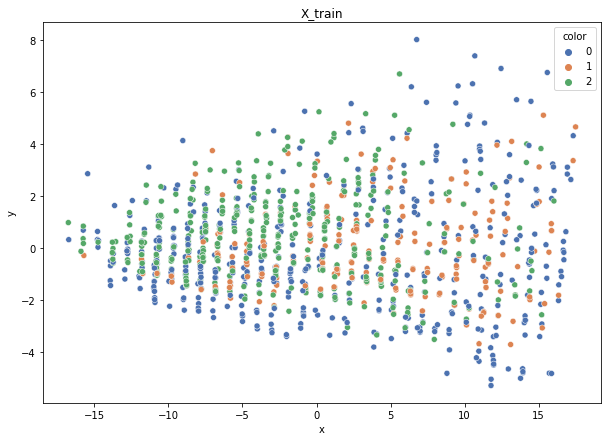

Class cardinalities: Counter({0: 503, 2: 408, 1: 267})
Weights: {0: 0.2429107547813522, 1: 0.45761838822104933, 2: 0.29947085699759846}


100%|██████████| 295/295 [00:00<00:00, 3443.55it/s]


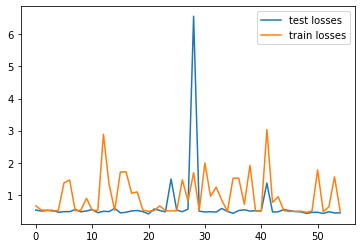

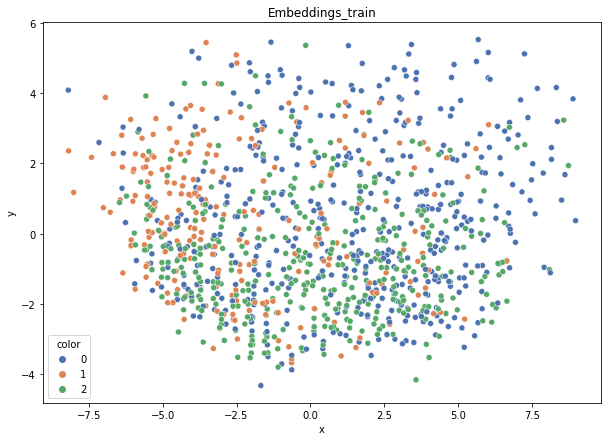

DT-f1-new-features: 0.368
DT-f1-old+new-features: 0.452
DT-f1-old-features: 0.462
DT-gmean-new-features: 0.373
DT-gmean-old+new-features: 0.454
DT-gmean-old-features: 0.46
KNN-f1-new-features: 0.393
KNN-f1-old+new-features: 0.453
KNN-f1-old-features: 0.413
KNN-gmean-new-features: 0.384
KNN-gmean-old+new-features: 0.447
KNN-gmean-old-features: 0.399
LDA-f1-new-features: 0.495
LDA-f1-old+new-features: 0.479
LDA-f1-old-features: 0.447
LDA-gmean-new-features: 0.482
LDA-gmean-old+new-features: 0.466
LDA-gmean-old-features: 0.425
QDA-f1-new-features: 0.476
QDA-f1-old+new-features: 0.479
QDA-f1-old-features: 0.486
QDA-gmean-new-features: 0.472
QDA-gmean-old+new-features: 0.493
QDA-gmean-old-features: 0.493
RF24-f1-new-features: 0.446
RF24-f1-old+new-features: 0.513
RF24-f1-old-features: 0.519
RF24-gmean-new-features: 0.432
RF24-gmean-old+new-features: 0.501
RF24-gmean-old-features: 0.513


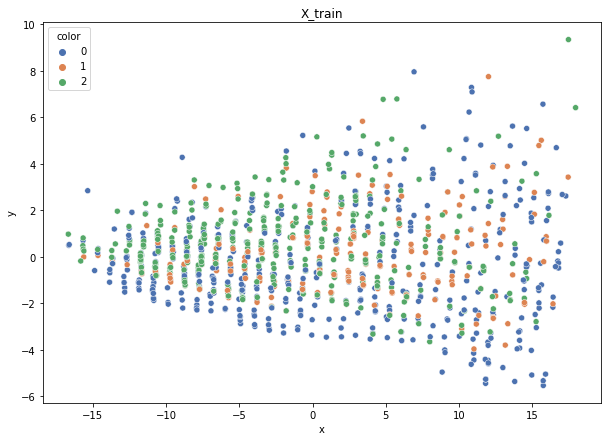

Class cardinalities: Counter({0: 503, 2: 409, 1: 267})
Weights: {0: 0.24308874498865835, 1: 0.4579537031059744, 2: 0.29895755190536716}


100%|██████████| 294/294 [00:00<00:00, 3446.36it/s]


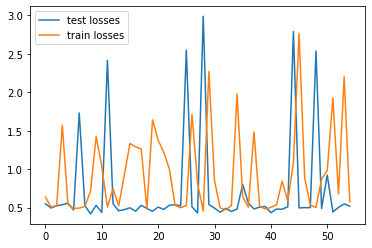

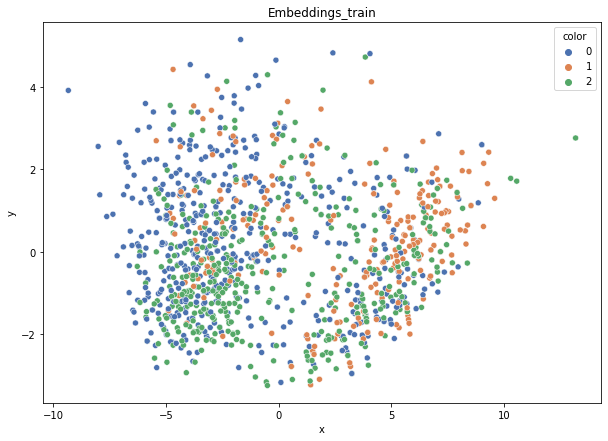

DT-f1-new-features: 0.39
DT-f1-old+new-features: 0.395
DT-f1-old-features: 0.44
DT-gmean-new-features: 0.374
DT-gmean-old+new-features: 0.382
DT-gmean-old-features: 0.438
KNN-f1-new-features: 0.426
KNN-f1-old+new-features: 0.465
KNN-f1-old-features: 0.418
KNN-gmean-new-features: 0.402
KNN-gmean-old+new-features: 0.453
KNN-gmean-old-features: 0.413
LDA-f1-new-features: 0.462
LDA-f1-old+new-features: 0.485
LDA-f1-old-features: 0.485
LDA-gmean-new-features: 0.443
LDA-gmean-old+new-features: 0.469
LDA-gmean-old-features: 0.451
QDA-f1-new-features: 0.463
QDA-f1-old+new-features: 0.492
QDA-f1-old-features: 0.516
QDA-gmean-new-features: 0.463
QDA-gmean-old+new-features: 0.505
QDA-gmean-old-features: 0.524
RF24-f1-new-features: 0.422
RF24-f1-old+new-features: 0.483
RF24-f1-old-features: 0.509
RF24-gmean-new-features: 0.397
RF24-gmean-old+new-features: 0.463
RF24-gmean-old-features: 0.497


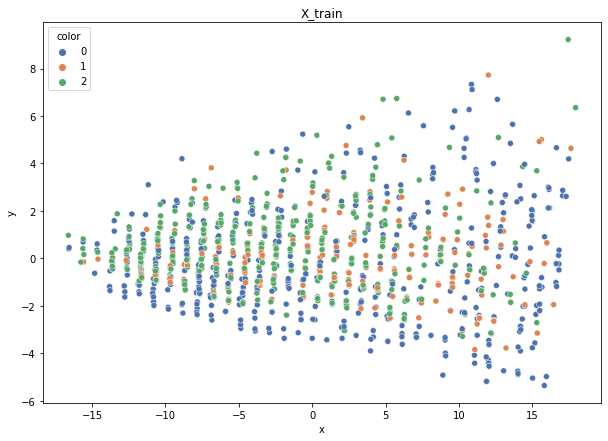

Class cardinalities: Counter({0: 504, 2: 409, 1: 266})
Weights: {0: 0.24230613326681422, 1: 0.4591063577687006, 2: 0.29858750896448505}


100%|██████████| 294/294 [00:00<00:00, 3434.81it/s]


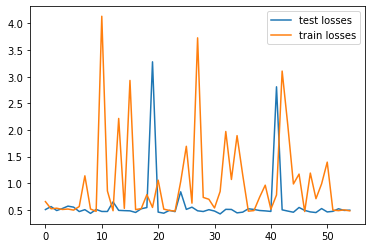

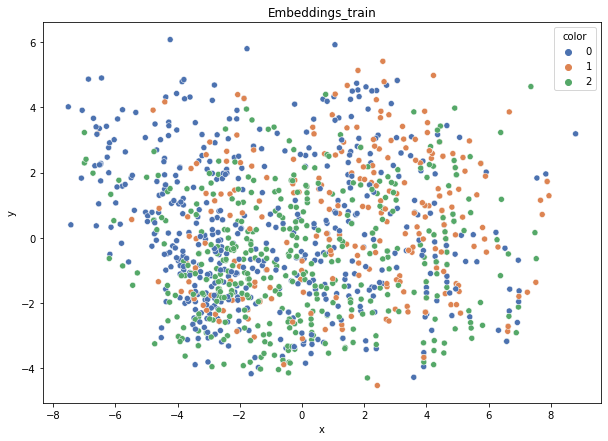

DT-f1-new-features: 0.407
DT-f1-old+new-features: 0.46
DT-f1-old-features: 0.473
DT-gmean-new-features: 0.401
DT-gmean-old+new-features: 0.455
DT-gmean-old-features: 0.483
KNN-f1-new-features: 0.409
KNN-f1-old+new-features: 0.401
KNN-f1-old-features: 0.408
KNN-gmean-new-features: 0.397
KNN-gmean-old+new-features: 0.39
KNN-gmean-old-features: 0.394
LDA-f1-new-features: 0.494
LDA-f1-old+new-features: 0.548
LDA-f1-old-features: 0.527
LDA-gmean-new-features: 0.48
LDA-gmean-old+new-features: 0.54
LDA-gmean-old-features: 0.509
QDA-f1-new-features: 0.499
QDA-f1-old+new-features: 0.538
QDA-f1-old-features: 0.542
QDA-gmean-new-features: 0.505
QDA-gmean-old+new-features: 0.552
QDA-gmean-old-features: 0.557
RF24-f1-new-features: 0.445
RF24-f1-old+new-features: 0.47
RF24-f1-old-features: 0.515
RF24-gmean-new-features: 0.425
RF24-gmean-old+new-features: 0.449
RF24-gmean-old-features: 0.518
dermatology


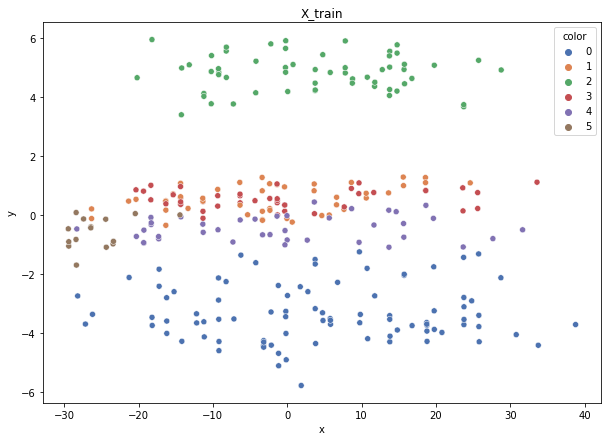

Class cardinalities: Counter({0: 90, 2: 58, 1: 48, 4: 41, 3: 39, 5: 16})
Weights: {1: 0.1288257963857323, 0: 0.0687070914057239, 2: 0.10661445218129569, 4: 0.15082044454915, 3: 0.1585548263209013, 5: 0.38647738915719687}


100%|██████████| 74/74 [00:00<00:00, 3292.62it/s]


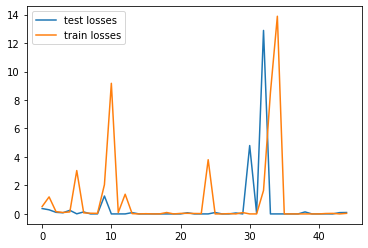

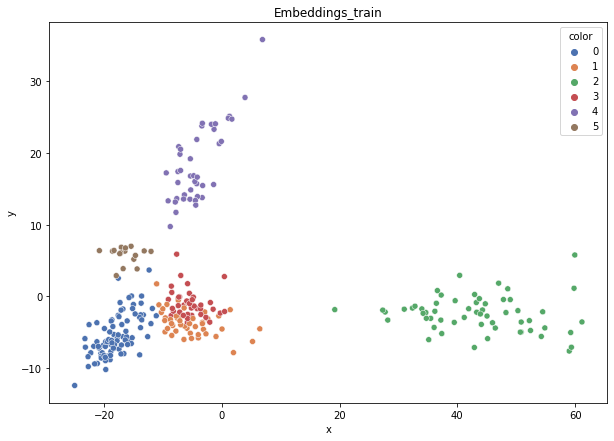

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.959
DT-f1-old+new-features: 0.959
DT-f1-old-features: 0.914
DT-gmean-new-features: 0.951
DT-gmean-old+new-features: 0.951
DT-gmean-old-features: 0.911
KNN-f1-new-features: 0.944
KNN-f1-old+new-features: 0.915
KNN-f1-old-features: 0.944
KNN-gmean-new-features: 0.937
KNN-gmean-old+new-features: 0.906
KNN-gmean-old-features: 0.941
LDA-f1-new-features: 0.945
LDA-f1-old+new-features: 0.959
LDA-f1-old-features: 0.943
LDA-gmean-new-features: 0.941
LDA-gmean-old+new-features: 0.957
LDA-gmean-old-features: 0.942
QDA-f1-new-features: 0.748
QDA-f1-old+new-features: 0.829
QDA-f1-old-features: 0.749
QDA-gmean-new-features: 0.292
QDA-gmean-old+new-features: 0.797
QDA-gmean-old-features: 0.74
RF24-f1-new-features: 0.944
RF24-f1-old+new-features: 0.959
RF24-f1-old-features: 0.959
RF24-gmean-new-features: 0.937
RF24-gmean-old+new-features: 0.951
RF24-gmean-old-features: 0.957


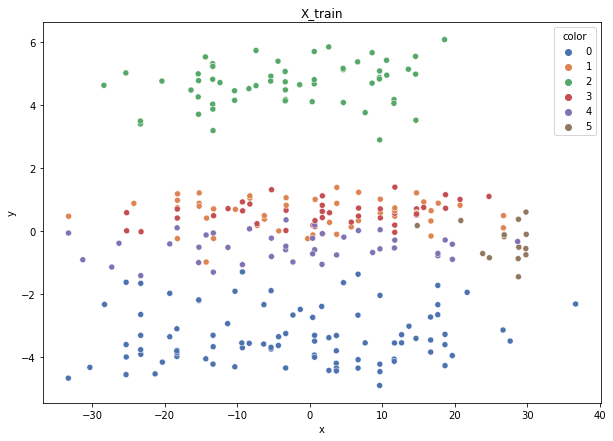

Class cardinalities: Counter({0: 89, 2: 58, 1: 49, 4: 41, 3: 40, 5: 16})
Weights: {1: 0.1269355878601628, 2: 0.10723868629565478, 0: 0.06988588545110087, 4: 0.1517035074426336, 3: 0.15549609512869944, 5: 0.3887402378217486}


100%|██████████| 73/73 [00:00<00:00, 3149.85it/s]


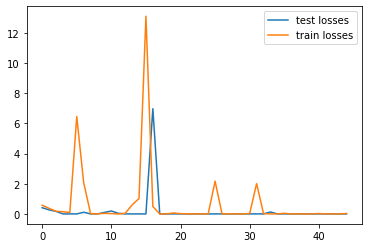

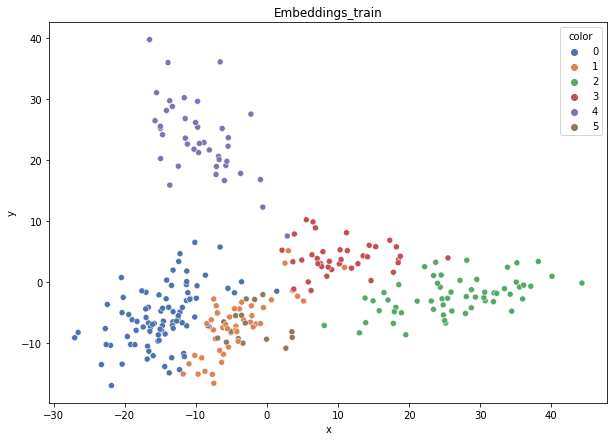

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.943
DT-f1-old+new-features: 0.908
DT-f1-old-features: 0.955
DT-gmean-new-features: 0.941
DT-gmean-old+new-features: 0.903
DT-gmean-old-features: 0.955
KNN-f1-new-features: 0.943
KNN-f1-old+new-features: 0.928
KNN-f1-old-features: 0.952
KNN-gmean-new-features: 0.958
KNN-gmean-old+new-features: 0.941
KNN-gmean-old-features: 0.951
LDA-f1-new-features: 0.93
LDA-f1-old+new-features: 0.959
LDA-f1-old-features: 0.968
LDA-gmean-new-features: 0.94
LDA-gmean-old+new-features: 0.974
LDA-gmean-old-features: 0.97
QDA-f1-new-features: 0.761
QDA-f1-old+new-features: 0.909
QDA-f1-old-features: 0.786
QDA-gmean-new-features: 0.295
QDA-gmean-old+new-features: 0.901
QDA-gmean-old-features: 0.766
RF24-f1-new-features: 0.929
RF24-f1-old+new-features: 0.959
RF24-f1-old-features: 0.984
RF24-gmean-new-features: 0.934
RF24-gmean-old+new-features: 0.974
RF24-gmean-old-features: 0.986


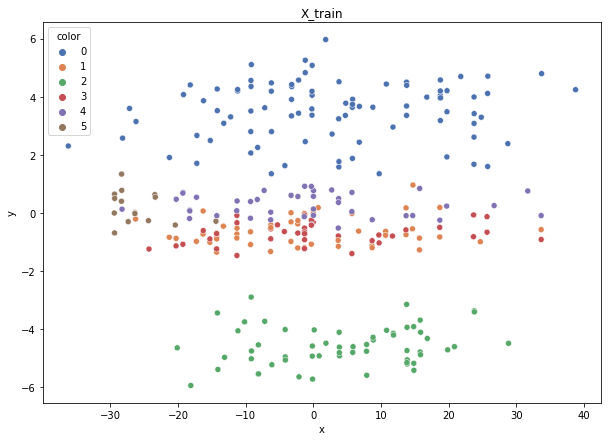

Class cardinalities: Counter({0: 89, 2: 58, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {0: 0.06985968170695418, 2: 0.10719847710205038, 4: 0.14803599218854577, 3: 0.15942337620304928, 1: 0.1268879933044678, 5: 0.38859447949493264}


100%|██████████| 73/73 [00:00<00:00, 3105.69it/s]


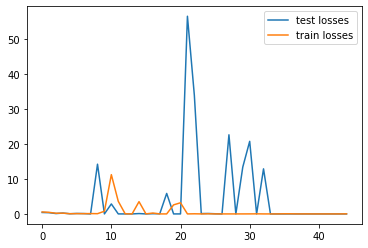

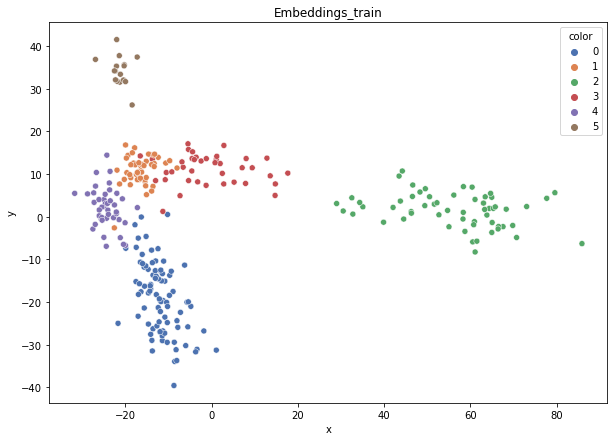

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.918
DT-f1-old+new-features: 0.901
DT-f1-old-features: 0.945
DT-gmean-new-features: 0.915
DT-gmean-old+new-features: 0.907
DT-gmean-old-features: 0.953
KNN-f1-new-features: 0.935
KNN-f1-old+new-features: 0.935
KNN-f1-old-features: 0.906
KNN-gmean-new-features: 0.935
KNN-gmean-old+new-features: 0.935
KNN-gmean-old-features: 0.891
LDA-f1-new-features: 0.943
LDA-f1-old+new-features: 0.952
LDA-f1-old-features: 0.922
LDA-gmean-new-features: 0.935
LDA-gmean-old+new-features: 0.942
LDA-gmean-old-features: 0.913
QDA-f1-new-features: 0.744
QDA-f1-old+new-features: 0.889
QDA-f1-old-features: 0.865
QDA-gmean-new-features: 0.289
QDA-gmean-old+new-features: 0.864
QDA-gmean-old-features: 0.861
RF24-f1-new-features: 0.891
RF24-f1-old+new-features: 0.891
RF24-f1-old-features: 0.909
RF24-gmean-new-features: 0.872
RF24-gmean-old+new-features: 0.872
RF24-gmean-old-features: 0.905


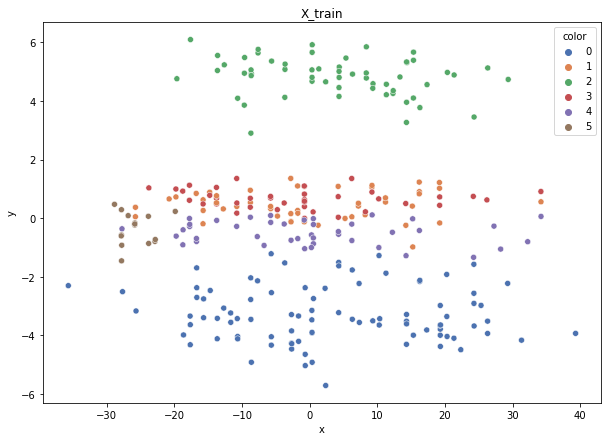

Class cardinalities: Counter({0: 90, 2: 57, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {1: 0.12674800566460384, 0: 0.06900724752850654, 2: 0.10895881188711559, 4: 0.14787267327537115, 3: 0.15924749429655355, 5: 0.3881657673478493}


100%|██████████| 73/73 [00:00<00:00, 3118.25it/s]


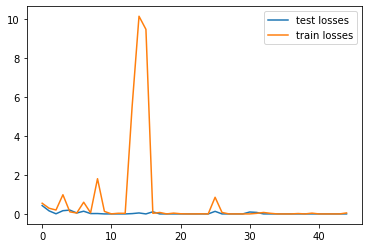

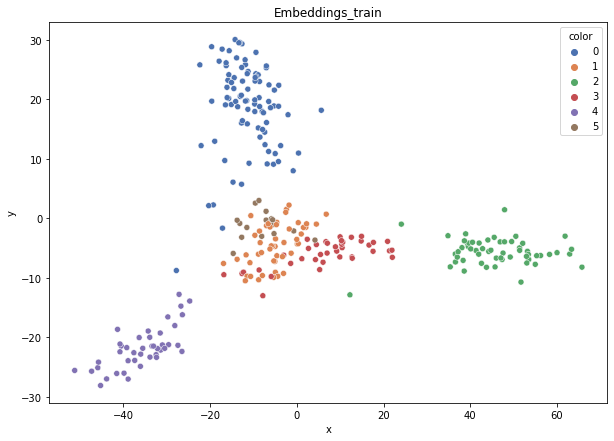

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.931
DT-f1-old+new-features: 0.952
DT-f1-old-features: 0.946
DT-gmean-new-features: 0.946
DT-gmean-old+new-features: 0.942
DT-gmean-old-features: 0.945
KNN-f1-new-features: 0.954
KNN-f1-old+new-features: 0.985
KNN-f1-old-features: 0.939
KNN-gmean-new-features: 0.95
KNN-gmean-old+new-features: 0.983
KNN-gmean-old-features: 0.937
LDA-f1-new-features: 0.985
LDA-f1-old+new-features: 0.969
LDA-f1-old-features: 0.969
LDA-gmean-new-features: 0.983
LDA-gmean-old+new-features: 0.963
LDA-gmean-old-features: 0.968
QDA-f1-new-features: 0.742
QDA-f1-old+new-features: 0.81
QDA-f1-old-features: 0.652
QDA-gmean-new-features: 0.285
QDA-gmean-old+new-features: 0.718
QDA-gmean-old-features: 0.553
RF24-f1-new-features: 0.937
RF24-f1-old+new-features: 0.952
RF24-f1-old-features: 0.969
RF24-gmean-new-features: 0.929
RF24-gmean-old+new-features: 0.942
RF24-gmean-old-features: 0.963


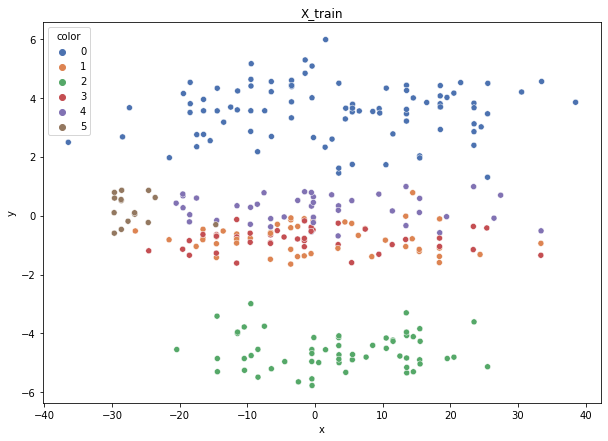

Class cardinalities: Counter({0: 90, 2: 57, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {1: 0.12674800566460384, 0: 0.06900724752850654, 2: 0.10895881188711559, 3: 0.15924749429655355, 4: 0.14787267327537115, 5: 0.3881657673478493}


100%|██████████| 73/73 [00:00<00:00, 3177.77it/s]


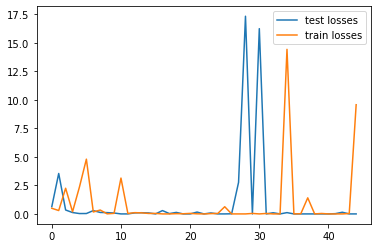

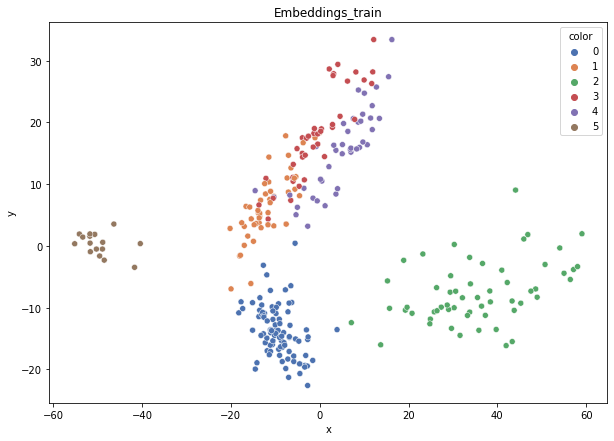

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.88
DT-f1-old+new-features: 0.974
DT-f1-old-features: 0.989
DT-gmean-new-features: 0.876
DT-gmean-old+new-features: 0.978
DT-gmean-old-features: 0.992
KNN-f1-new-features: 0.874
KNN-f1-old+new-features: 0.959
KNN-f1-old-features: 0.944
KNN-gmean-new-features: 0.839
KNN-gmean-old+new-features: 0.961
KNN-gmean-old-features: 0.942
LDA-f1-new-features: 0.97
LDA-f1-old+new-features: 1.0
LDA-f1-old-features: 0.989
LDA-gmean-new-features: 0.965
LDA-gmean-old+new-features: 1.0
LDA-gmean-old-features: 0.992
QDA-f1-new-features: 0.771
QDA-f1-old+new-features: 0.915
QDA-f1-old-features: 0.835
QDA-gmean-new-features: 0.302
QDA-gmean-old+new-features: 0.875
QDA-gmean-old-features: 0.814
RF24-f1-new-features: 0.937
RF24-f1-old+new-features: 0.969
RF24-f1-old-features: 1.0
RF24-gmean-new-features: 0.929
RF24-gmean-old+new-features: 0.963
RF24-gmean-old-features: 1.0
hayes-roth


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


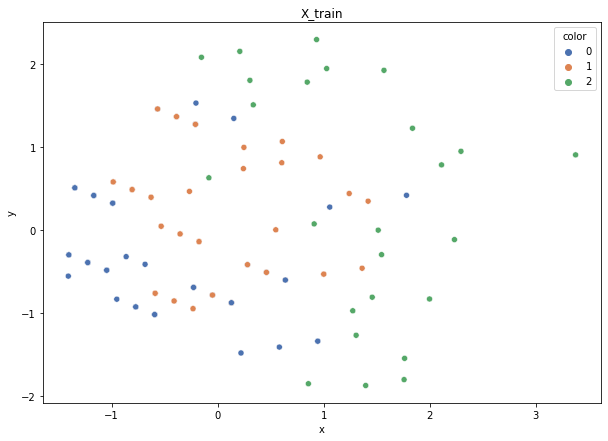

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


100%|██████████| 32/32 [00:00<00:00, 3251.63it/s]


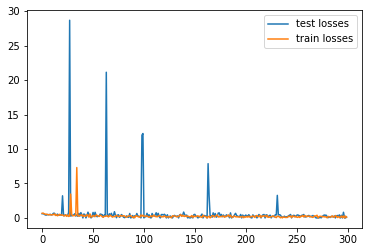

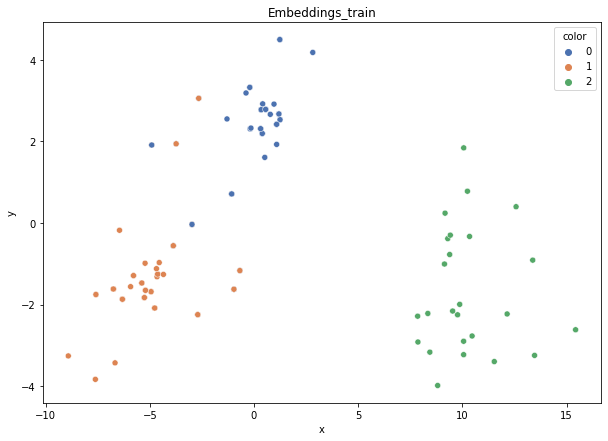

DT-f1-new-features: 0.867
DT-f1-old+new-features: 0.867
DT-f1-old-features: 0.842
DT-gmean-new-features: 0.851
DT-gmean-old+new-features: 0.851
DT-gmean-old-features: 0.828
KNN-f1-new-features: 0.897
KNN-f1-old+new-features: 0.897
KNN-f1-old-features: 0.733
KNN-gmean-new-features: 0.895
KNN-gmean-old+new-features: 0.895
KNN-gmean-old-features: 0.688
LDA-f1-new-features: 0.845
LDA-f1-old+new-features: 0.897
LDA-f1-old-features: 0.57
LDA-gmean-new-features: 0.837
LDA-gmean-old+new-features: 0.892
LDA-gmean-old-features: 0.549
QDA-f1-new-features: 0.845
QDA-f1-old+new-features: 0.845
QDA-f1-old-features: 0.58
QDA-gmean-new-features: 0.837
QDA-gmean-old+new-features: 0.837
QDA-gmean-old-features: 0.574
RF24-f1-new-features: 0.872
RF24-f1-old+new-features: 0.872
RF24-f1-old-features: 0.838
RF24-gmean-new-features: 0.867
RF24-gmean-old+new-features: 0.867
RF24-gmean-old-features: 0.814


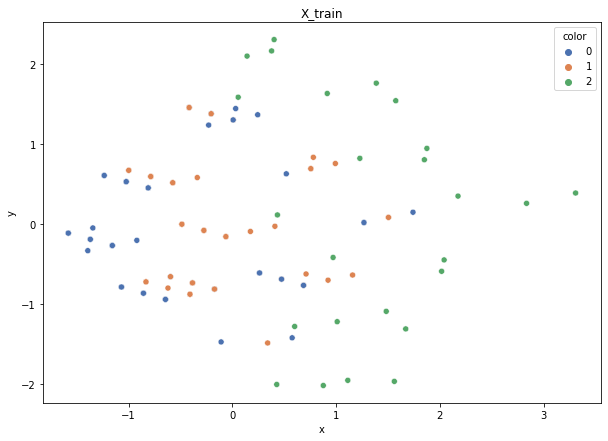

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


100%|██████████| 32/32 [00:00<00:00, 3220.50it/s]


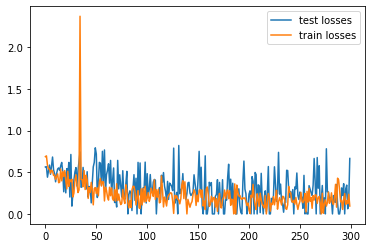

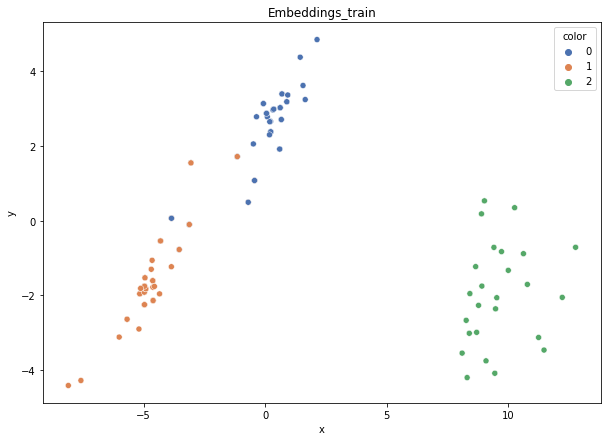

DT-f1-new-features: 0.897
DT-f1-old+new-features: 0.897
DT-f1-old-features: 0.872
DT-gmean-new-features: 0.895
DT-gmean-old+new-features: 0.895
DT-gmean-old-features: 0.867
KNN-f1-new-features: 0.872
KNN-f1-old+new-features: 0.872
KNN-f1-old-features: 0.643
KNN-gmean-new-features: 0.867
KNN-gmean-old+new-features: 0.867
KNN-gmean-old-features: 0.619
LDA-f1-new-features: 0.872
LDA-f1-old+new-features: 0.872
LDA-f1-old-features: 0.439
LDA-gmean-new-features: 0.867
LDA-gmean-old+new-features: 0.867
LDA-gmean-old-features: 0.414
QDA-f1-new-features: 0.818
QDA-f1-old+new-features: 0.818
QDA-f1-old-features: 0.54
QDA-gmean-new-features: 0.805
QDA-gmean-old+new-features: 0.805
QDA-gmean-old-features: 0.529
RF24-f1-new-features: 0.897
RF24-f1-old+new-features: 0.897
RF24-f1-old-features: 0.846
RF24-gmean-new-features: 0.895
RF24-gmean-old+new-features: 0.895
RF24-gmean-old-features: 0.84


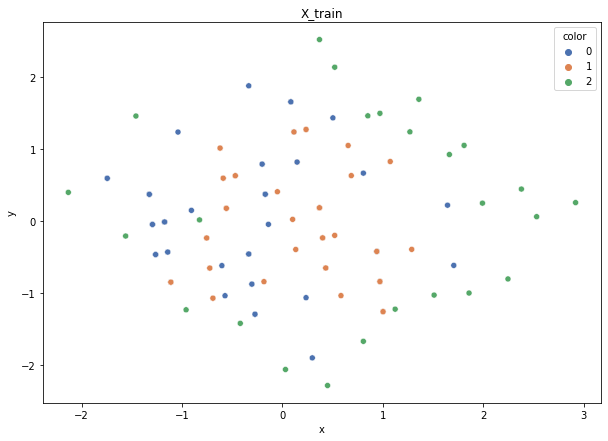

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


100%|██████████| 32/32 [00:00<00:00, 3396.28it/s]


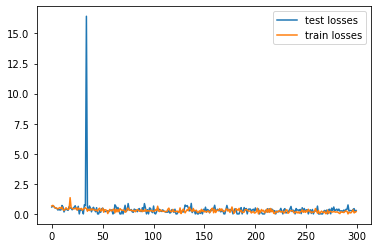

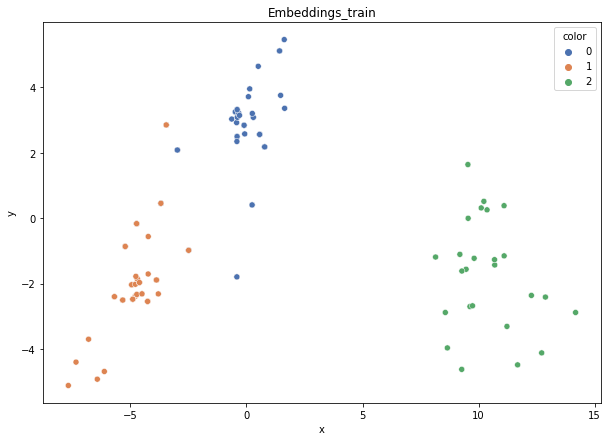

DT-f1-new-features: 0.923
DT-f1-old+new-features: 0.923
DT-f1-old-features: 0.923
DT-gmean-new-features: 0.921
DT-gmean-old+new-features: 0.921
DT-gmean-old-features: 0.921
KNN-f1-new-features: 0.923
KNN-f1-old+new-features: 0.897
KNN-f1-old-features: 0.836
KNN-gmean-new-features: 0.921
KNN-gmean-old+new-features: 0.895
KNN-gmean-old-features: 0.805
LDA-f1-new-features: 0.923
LDA-f1-old+new-features: 0.948
LDA-f1-old-features: 0.565
LDA-gmean-new-features: 0.921
LDA-gmean-old+new-features: 0.946
LDA-gmean-old-features: 0.474
QDA-f1-new-features: 0.923
QDA-f1-old+new-features: 0.923
QDA-f1-old-features: 0.666
QDA-gmean-new-features: 0.921
QDA-gmean-old+new-features: 0.921
QDA-gmean-old-features: 0.643
RF24-f1-new-features: 0.923
RF24-f1-old+new-features: 0.923
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.921
RF24-gmean-old+new-features: 0.921
RF24-gmean-old-features: 0.921


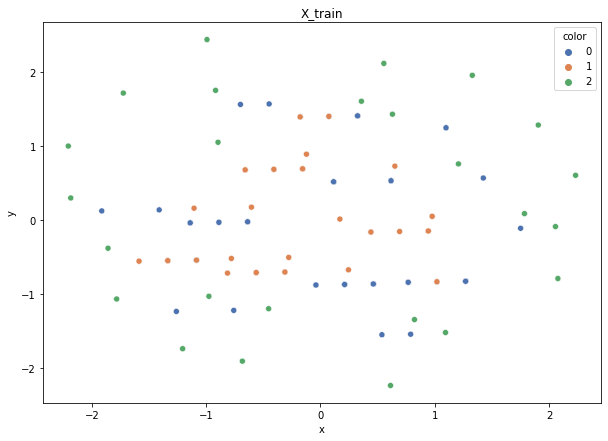

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {1: 0.24870862827625786, 2: 0.507365601683566, 0: 0.243925770040176}


100%|██████████| 32/32 [00:00<00:00, 3255.58it/s]


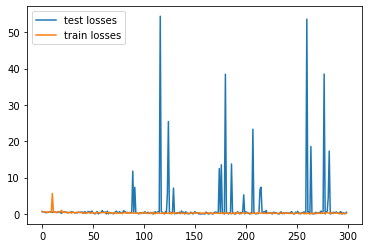

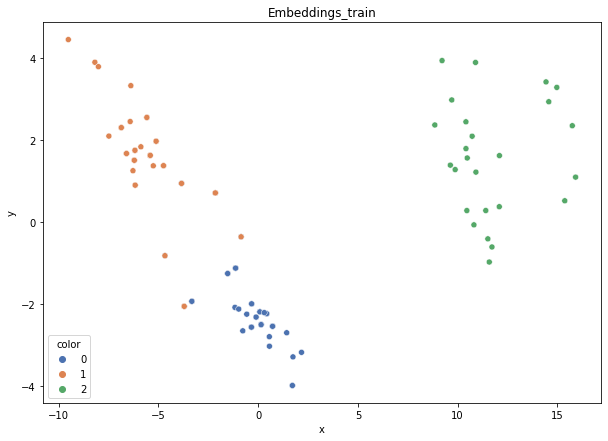

DT-f1-new-features: 0.872
DT-f1-old+new-features: 0.831
DT-f1-old-features: 0.897
DT-gmean-new-features: 0.867
DT-gmean-old+new-features: 0.816
DT-gmean-old-features: 0.892
KNN-f1-new-features: 0.949
KNN-f1-old+new-features: 0.923
KNN-f1-old-features: 0.594
KNN-gmean-new-features: 0.948
KNN-gmean-old+new-features: 0.921
KNN-gmean-old-features: 0.54
LDA-f1-new-features: 0.846
LDA-f1-old+new-features: 0.846
LDA-f1-old-features: 0.615
LDA-gmean-new-features: 0.84
LDA-gmean-old+new-features: 0.84
LDA-gmean-old-features: 0.605
QDA-f1-new-features: 0.897
QDA-f1-old+new-features: 0.814
QDA-f1-old-features: 0.739
QDA-gmean-new-features: 0.895
QDA-gmean-old+new-features: 0.792
QDA-gmean-old-features: 0.752
RF24-f1-new-features: 0.846
RF24-f1-old+new-features: 0.846
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.84
RF24-gmean-old+new-features: 0.84
RF24-gmean-old-features: 0.921


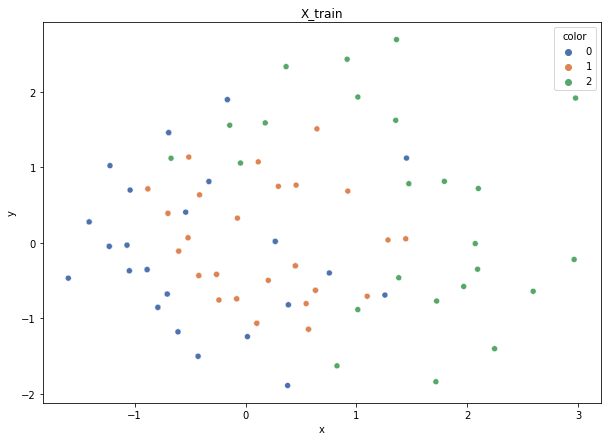

Class cardinalities: Counter({0: 52, 1: 52, 2: 24})
Weights: {0: 0.24000000000000005, 2: 0.52, 1: 0.24000000000000005}


100%|██████████| 32/32 [00:00<00:00, 3124.83it/s]


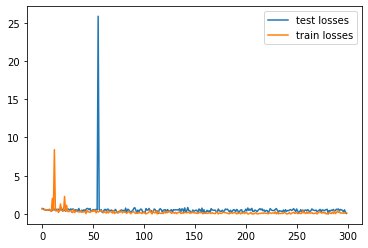

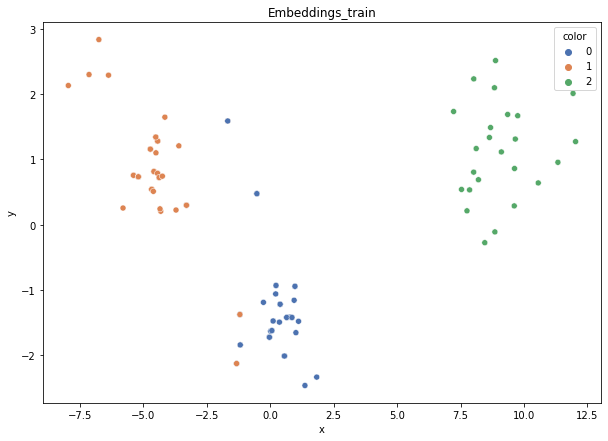

DT-f1-new-features: 0.812
DT-f1-old+new-features: 0.812
DT-f1-old-features: 0.722
DT-gmean-new-features: 0.8
DT-gmean-old+new-features: 0.8
DT-gmean-old-features: 0.684
KNN-f1-new-features: 0.786
KNN-f1-old+new-features: 0.786
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.773
KNN-gmean-old+new-features: 0.773
KNN-gmean-old-features: 0.529
LDA-f1-new-features: 0.786
LDA-f1-old+new-features: 0.786
LDA-f1-old-features: 0.607
LDA-gmean-new-features: 0.773
LDA-gmean-old+new-features: 0.773
LDA-gmean-old-features: 0.591
QDA-f1-new-features: 0.76
QDA-f1-old+new-features: 0.786
QDA-f1-old-features: 0.663
QDA-gmean-new-features: 0.743
QDA-gmean-old+new-features: 0.773
QDA-gmean-old-features: 0.667
RF24-f1-new-features: 0.786
RF24-f1-old+new-features: 0.786
RF24-f1-old-features: 0.733
RF24-gmean-new-features: 0.773
RF24-gmean-old+new-features: 0.773
RF24-gmean-old-features: 0.711
new_vehicle


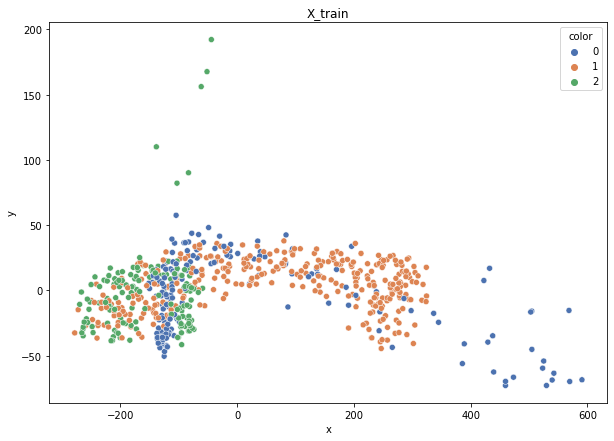

Class cardinalities: Counter({1: 343, 0: 174, 2: 159})
Weights: {2: 0.42063643091235864, 1: 0.19498889946083095, 0: 0.38437466962681044}


100%|██████████| 170/170 [00:00<00:00, 3440.89it/s]


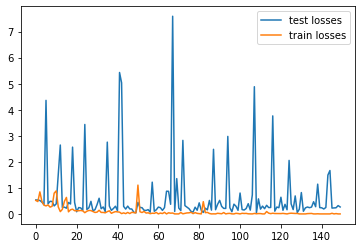

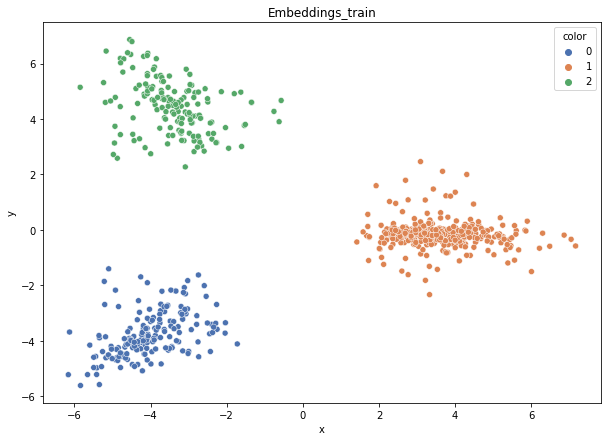

DT-f1-new-features: 0.938
DT-f1-old+new-features: 0.938
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.925
DT-gmean-old+new-features: 0.925
DT-gmean-old-features: 0.908
KNN-f1-new-features: 0.952
KNN-f1-old+new-features: 0.952
KNN-f1-old-features: 0.889
KNN-gmean-new-features: 0.953
KNN-gmean-old+new-features: 0.953
KNN-gmean-old-features: 0.895
LDA-f1-new-features: 0.946
LDA-f1-old+new-features: 0.952
LDA-f1-old-features: 0.907
LDA-gmean-new-features: 0.944
LDA-gmean-old+new-features: 0.953
LDA-gmean-old-features: 0.921
QDA-f1-new-features: 0.952
QDA-f1-old+new-features: 0.966
QDA-f1-old-features: 0.932
QDA-gmean-new-features: 0.953
QDA-gmean-old+new-features: 0.964
QDA-gmean-old-features: 0.944
RF24-f1-new-features: 0.943
RF24-f1-old+new-features: 0.943
RF24-f1-old-features: 0.922
RF24-gmean-new-features: 0.939
RF24-gmean-old+new-features: 0.939
RF24-gmean-old-features: 0.932


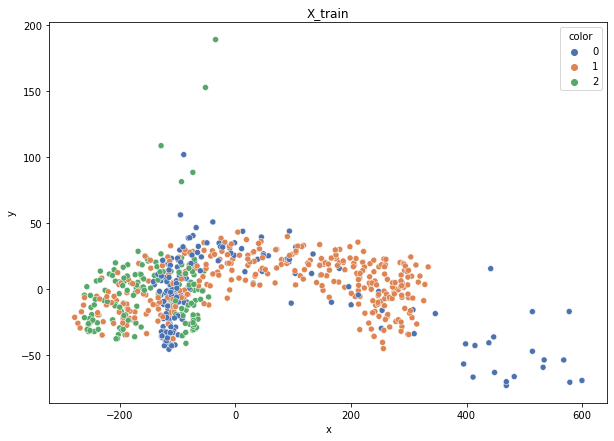

Class cardinalities: Counter({1: 343, 0: 175, 2: 159})
Weights: {2: 0.4215623617324616, 1: 0.19541812103633058, 0: 0.3830195172312079}


100%|██████████| 169/169 [00:00<00:00, 3433.96it/s]


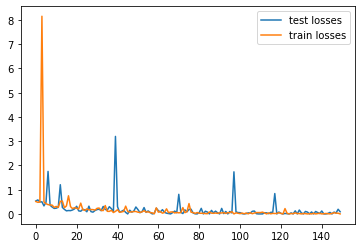

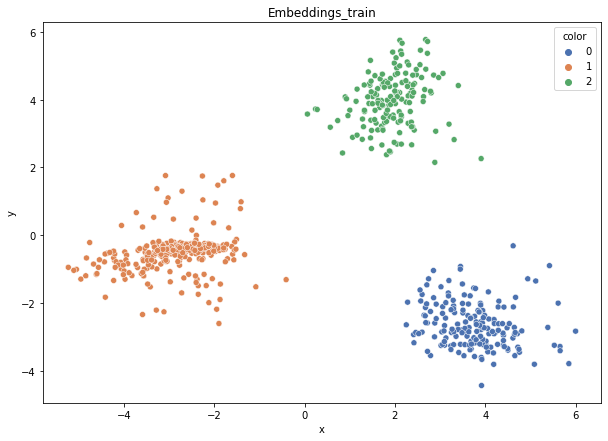

DT-f1-new-features: 0.986
DT-f1-old+new-features: 0.988
DT-f1-old-features: 0.906
DT-gmean-new-features: 0.984
DT-gmean-old+new-features: 0.988
DT-gmean-old-features: 0.904
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 1.0
KNN-f1-old-features: 0.9
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 1.0
KNN-gmean-old-features: 0.908
LDA-f1-new-features: 1.0
LDA-f1-old+new-features: 0.994
LDA-f1-old-features: 0.933
LDA-gmean-new-features: 1.0
LDA-gmean-old+new-features: 0.996
LDA-gmean-old-features: 0.94
QDA-f1-new-features: 0.994
QDA-f1-old+new-features: 0.994
QDA-f1-old-features: 0.988
QDA-gmean-new-features: 0.996
QDA-gmean-old+new-features: 0.996
QDA-gmean-old-features: 0.992
RF24-f1-new-features: 1.0
RF24-f1-old+new-features: 1.0
RF24-f1-old-features: 0.958
RF24-gmean-new-features: 1.0
RF24-gmean-old+new-features: 1.0
RF24-gmean-old-features: 0.968


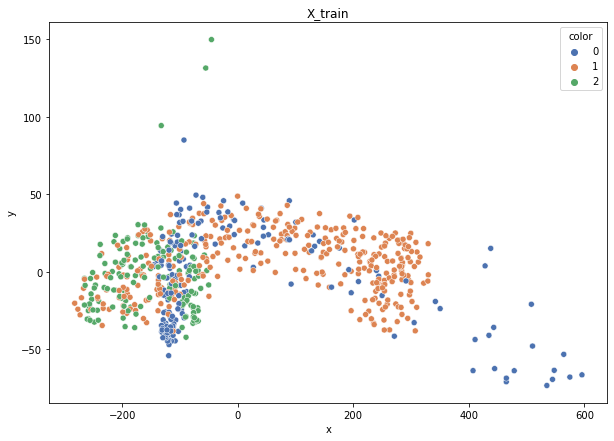

Class cardinalities: Counter({1: 343, 0: 175, 2: 159})
Weights: {2: 0.4215623617324616, 1: 0.19541812103633058, 0: 0.3830195172312079}


100%|██████████| 169/169 [00:00<00:00, 3313.41it/s]


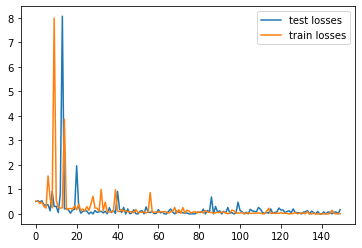

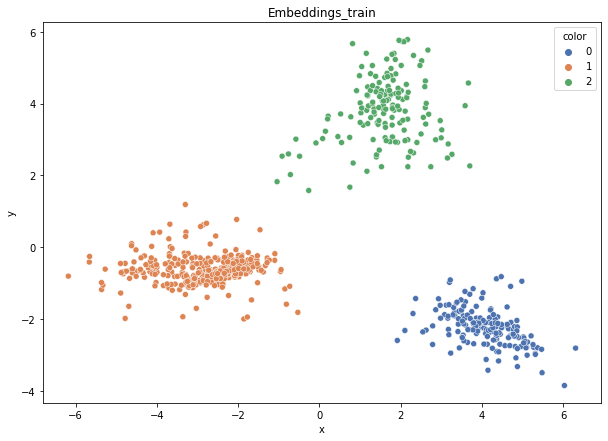

DT-f1-new-features: 0.986
DT-f1-old+new-features: 0.986
DT-f1-old-features: 0.89
DT-gmean-new-features: 0.988
DT-gmean-old+new-features: 0.988
DT-gmean-old-features: 0.895
KNN-f1-new-features: 0.986
KNN-f1-old+new-features: 0.992
KNN-f1-old-features: 0.899
KNN-gmean-new-features: 0.988
KNN-gmean-old+new-features: 0.992
KNN-gmean-old-features: 0.897
LDA-f1-new-features: 0.992
LDA-f1-old+new-features: 0.994
LDA-f1-old-features: 0.965
LDA-gmean-new-features: 0.992
LDA-gmean-old+new-features: 0.996
LDA-gmean-old-features: 0.964
QDA-f1-new-features: 0.994
QDA-f1-old+new-features: 0.994
QDA-f1-old-features: 0.976
QDA-gmean-new-features: 0.996
QDA-gmean-old+new-features: 0.996
QDA-gmean-old-features: 0.975
RF24-f1-new-features: 0.992
RF24-f1-old+new-features: 0.992
RF24-f1-old-features: 0.952
RF24-gmean-new-features: 0.992
RF24-gmean-old+new-features: 0.992
RF24-gmean-old-features: 0.955


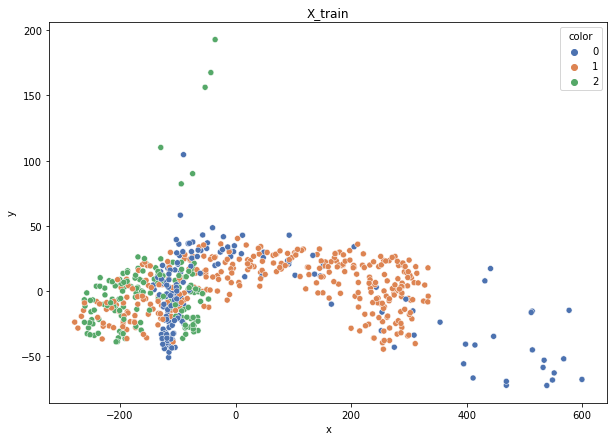

Class cardinalities: Counter({1: 344, 0: 174, 2: 159})
Weights: {2: 0.42087499472640594, 0: 0.3845926675948192, 1: 0.19453233767877484}


100%|██████████| 169/169 [00:00<00:00, 3432.49it/s]


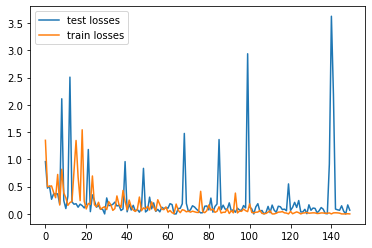

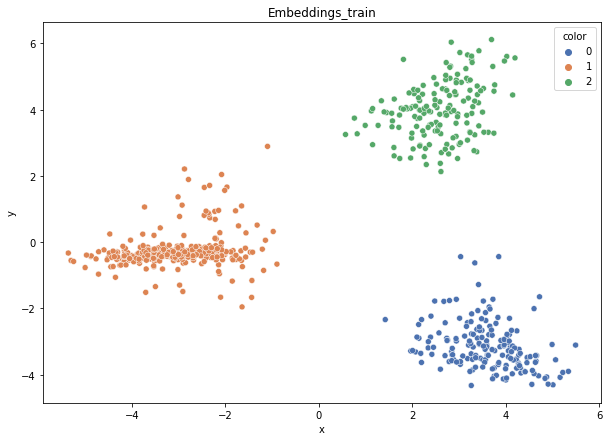

DT-f1-new-features: 0.988
DT-f1-old+new-features: 0.976
DT-f1-old-features: 0.909
DT-gmean-new-features: 0.988
DT-gmean-old+new-features: 0.972
DT-gmean-old-features: 0.916
KNN-f1-new-features: 0.988
KNN-f1-old+new-features: 0.994
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.988
KNN-gmean-old+new-features: 0.992
KNN-gmean-old-features: 0.927
LDA-f1-new-features: 0.988
LDA-f1-old+new-features: 0.988
LDA-f1-old-features: 0.953
LDA-gmean-new-features: 0.988
LDA-gmean-old+new-features: 0.988
LDA-gmean-old-features: 0.957
QDA-f1-new-features: 0.994
QDA-f1-old+new-features: 1.0
QDA-f1-old-features: 0.988
QDA-gmean-new-features: 0.996
QDA-gmean-old+new-features: 1.0
QDA-gmean-old-features: 0.988
RF24-f1-new-features: 0.988
RF24-f1-old+new-features: 0.988
RF24-f1-old-features: 0.976
RF24-gmean-new-features: 0.988
RF24-gmean-old+new-features: 0.988
RF24-gmean-old-features: 0.977


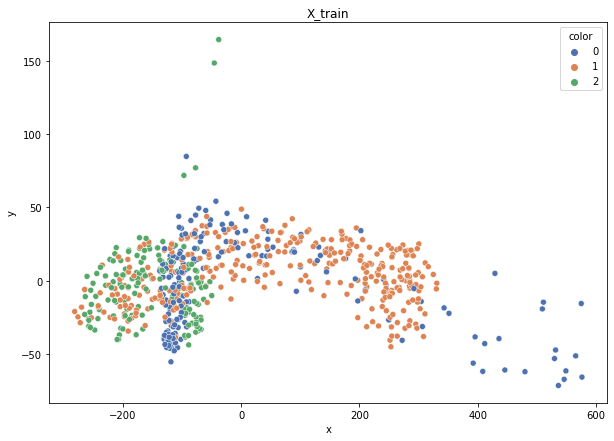

Class cardinalities: Counter({1: 343, 0: 174, 2: 160})
Weights: {2: 0.4191092821730032, 1: 0.19550287215067205, 0: 0.3853878456763248}


100%|██████████| 169/169 [00:00<00:00, 3361.97it/s]


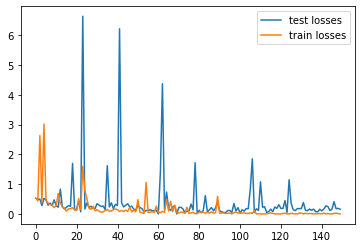

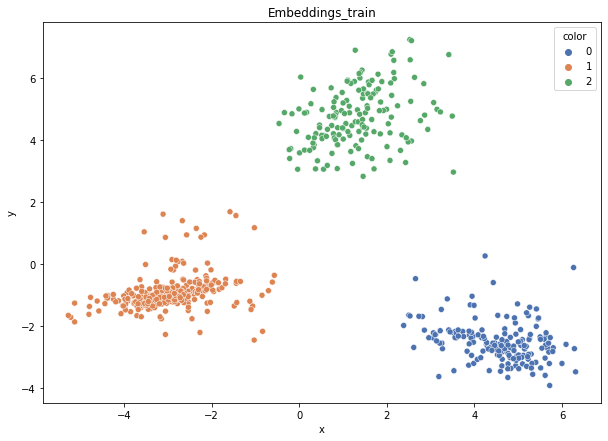

DT-f1-new-features: 0.962
DT-f1-old+new-features: 0.968
DT-f1-old-features: 0.877
DT-gmean-new-features: 0.96
DT-gmean-old+new-features: 0.968
DT-gmean-old-features: 0.87
KNN-f1-new-features: 0.973
KNN-f1-old+new-features: 0.973
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.971
KNN-gmean-old+new-features: 0.966
KNN-gmean-old-features: 0.935
LDA-f1-new-features: 0.98
LDA-f1-old+new-features: 0.98
LDA-f1-old-features: 0.939
LDA-gmean-new-features: 0.98
LDA-gmean-old+new-features: 0.976
LDA-gmean-old-features: 0.941
QDA-f1-new-features: 0.978
QDA-f1-old+new-features: 0.986
QDA-f1-old-features: 0.964
QDA-gmean-new-features: 0.981
QDA-gmean-old+new-features: 0.989
QDA-gmean-old-features: 0.969
RF24-f1-new-features: 0.967
RF24-f1-old+new-features: 0.967
RF24-f1-old-features: 0.978
RF24-gmean-new-features: 0.962
RF24-gmean-old+new-features: 0.962
RF24-gmean-old-features: 0.981
new_yeast


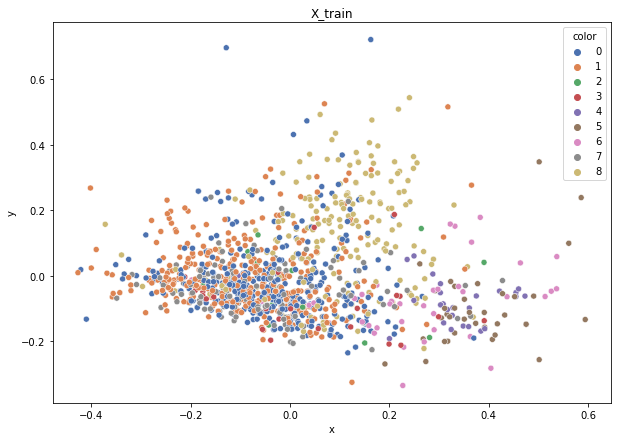

Class cardinalities: Counter({0: 370, 1: 343, 8: 195, 7: 135, 6: 40, 5: 36, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024325906642526016, 0: 0.012820410257547495, 1: 0.013829597070823827, 5: 0.1317653276470159, 4: 0.16941256411759187, 6: 0.11858879488231433, 3: 0.19764799147052386, 7: 0.03513742070587091, 2: 0.2964719872057858}


100%|██████████| 297/297 [00:00<00:00, 3363.97it/s]


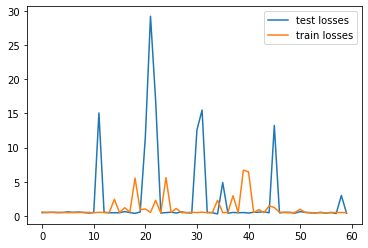

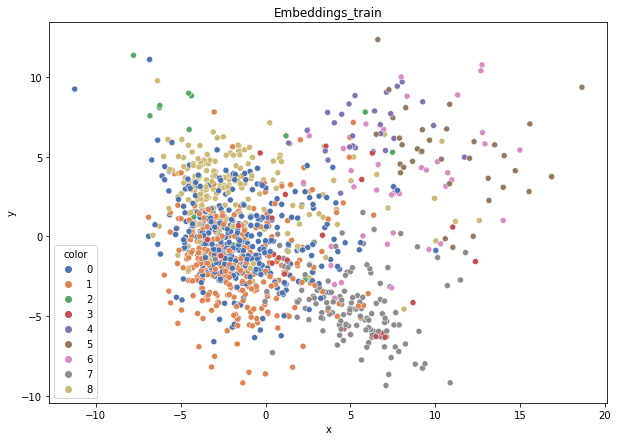

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.502
DT-f1-old+new-features: 0.429
DT-f1-old-features: 0.494
DT-gmean-new-features: 0.488
DT-gmean-old+new-features: 0.25
DT-gmean-old-features: 0.271
KNN-f1-new-features: 0.501
KNN-f1-old+new-features: 0.538
KNN-f1-old-features: 0.545
KNN-gmean-new-features: 0.472
KNN-gmean-old+new-features: 0.508
KNN-gmean-old-features: 0.51
LDA-f1-new-features: 0.527
LDA-f1-old+new-features: 0.534
LDA-f1-old-features: 0.564
LDA-gmean-new-features: 0.283
LDA-gmean-old+new-features: 0.294
LDA-gmean-old-features: 0.308
QDA-f1-new-features: 0.548
QDA-f1-old+new-features: 0.375
QDA-f1-old-features: 0.171
QDA-gmean-new-features: 0.527
QDA-gmean-old+new-features: 0.183
QDA-gmean-old-features: 0.047
RF24-f1-new-features: 0.533
RF24-f1-old+new-features: 0.581
RF24-f1-old-features: 0.565
RF24-gmean-new-features: 0.294
RF24-gmean-old+new-features: 0.319
RF24-gmean-old-features: 0.313


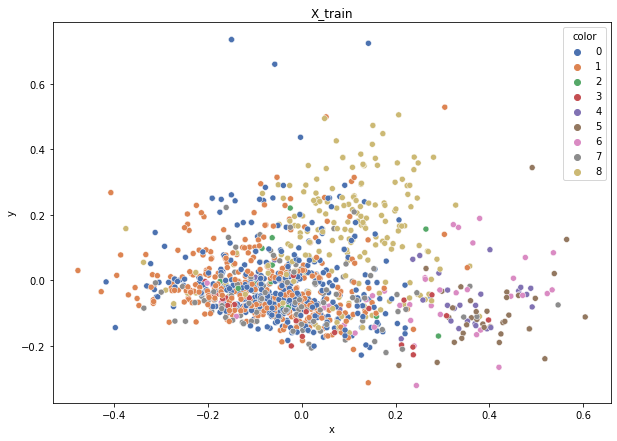

Class cardinalities: Counter({0: 371, 1: 343, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {1: 0.013814401543936261, 8: 0.02429917810035968, 0: 0.012771805200997676, 5: 0.13538113513057534, 6: 0.11556926169683263, 7: 0.035360744250523414, 3: 0.1974308220654224, 4: 0.16922641891321918, 2: 0.2961462330981336}


100%|██████████| 297/297 [00:00<00:00, 3383.97it/s]


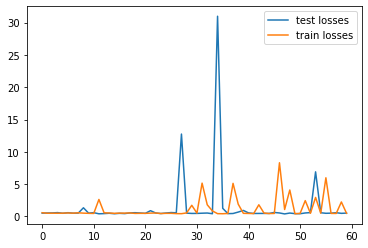

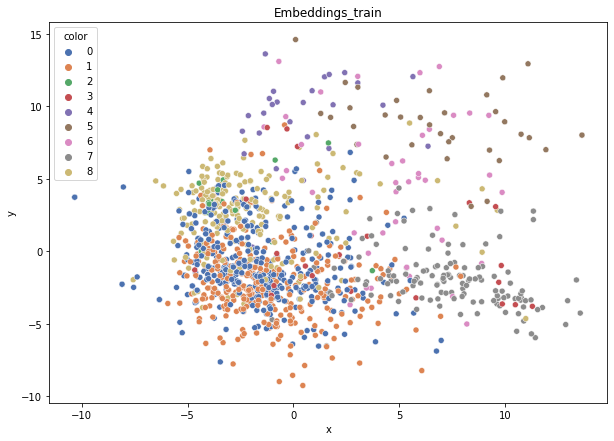

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.469
DT-f1-old+new-features: 0.492
DT-f1-old-features: 0.451
DT-gmean-new-features: 0.26
DT-gmean-old+new-features: 0.48
DT-gmean-old-features: 0.26
KNN-f1-new-features: 0.446
KNN-f1-old+new-features: 0.527
KNN-f1-old-features: 0.494
KNN-gmean-new-features: 0.253
KNN-gmean-old+new-features: 0.289
KNN-gmean-old-features: 0.268
LDA-f1-new-features: 0.558
LDA-f1-old+new-features: 0.576
LDA-f1-old-features: 0.57
LDA-gmean-new-features: 0.306
LDA-gmean-old+new-features: 0.316
LDA-gmean-old-features: 0.307
QDA-f1-new-features: 0.522
QDA-f1-old+new-features: 0.248
QDA-f1-old-features: 0.1
QDA-gmean-new-features: 0.504
QDA-gmean-old+new-features: 0.056
QDA-gmean-old-features: 0.033
RF24-f1-new-features: 0.546
RF24-f1-old+new-features: 0.609
RF24-f1-old-features: 0.612
RF24-gmean-new-features: 0.289
RF24-gmean-old+new-features: 0.324
RF24-gmean-old-features: 0.332


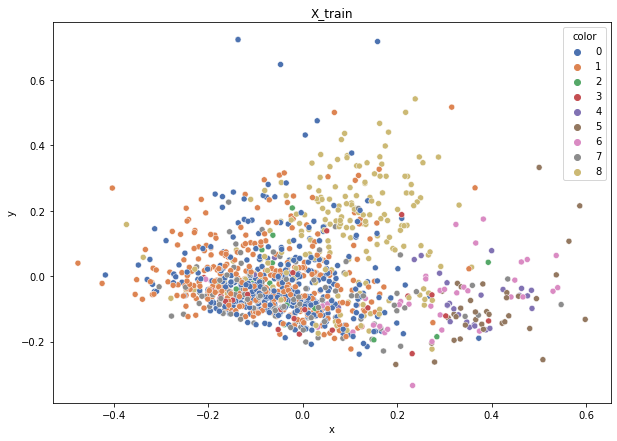

Class cardinalities: Counter({0: 371, 1: 343, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024299178100359677, 1: 0.01381440154393626, 0: 0.012771805200997674, 5: 0.13538113513057534, 4: 0.16922641891321916, 6: 0.11556926169683261, 7: 0.03536074425052341, 3: 0.19743082206542237, 2: 0.29614623309813354}


100%|██████████| 297/297 [00:00<00:00, 3464.35it/s]


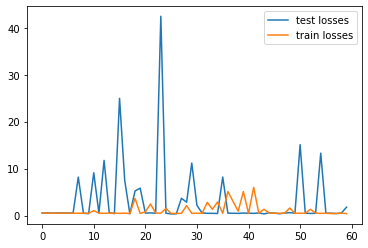

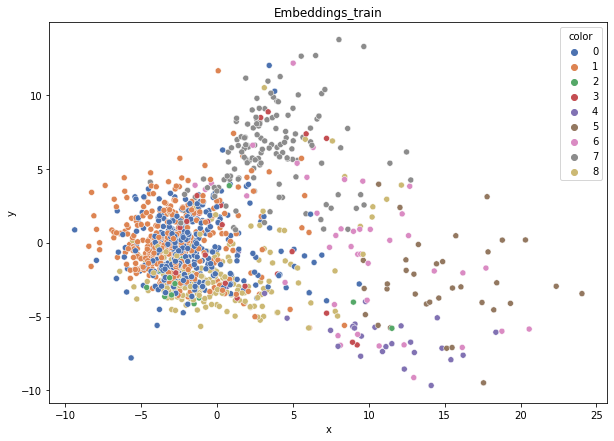

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.352
DT-f1-old+new-features: 0.384
DT-f1-old-features: 0.407
DT-gmean-new-features: 0.221
DT-gmean-old+new-features: 0.234
DT-gmean-old-features: 0.401
KNN-f1-new-features: 0.418
KNN-f1-old+new-features: 0.39
KNN-f1-old-features: 0.451
KNN-gmean-new-features: 0.239
KNN-gmean-old+new-features: 0.223
KNN-gmean-old-features: 0.422
LDA-f1-new-features: 0.462
LDA-f1-old+new-features: 0.475
LDA-f1-old-features: 0.492
LDA-gmean-new-features: 0.25
LDA-gmean-old+new-features: 0.255
LDA-gmean-old-features: 0.267
QDA-f1-new-features: 0.472
QDA-f1-old+new-features: 0.329
QDA-f1-old-features: 0.262
QDA-gmean-new-features: 0.274
QDA-gmean-old+new-features: 0.111
QDA-gmean-old-features: 0.079
RF24-f1-new-features: 0.442
RF24-f1-old+new-features: 0.481
RF24-f1-old-features: 0.538
RF24-gmean-new-features: 0.248
RF24-gmean-old+new-features: 0.246
RF24-gmean-old-features: 0.474


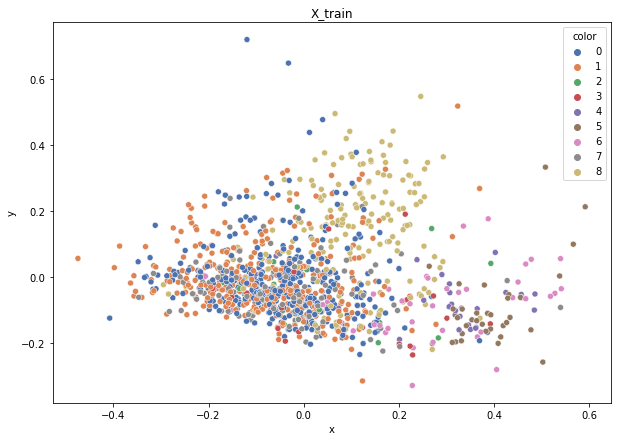

Class cardinalities: Counter({0: 370, 1: 344, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024299315142460837, 1: 0.013774321083662392, 0: 0.012806395818323955, 5: 0.13538189865085323, 4: 0.16922737331356652, 6: 0.11556991348243568, 7: 0.03536094367746166, 3: 0.1974319355324943, 2: 0.29614790329874147}


100%|██████████| 297/297 [00:00<00:00, 3333.85it/s]


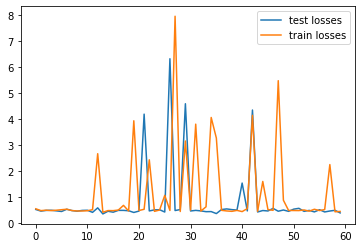

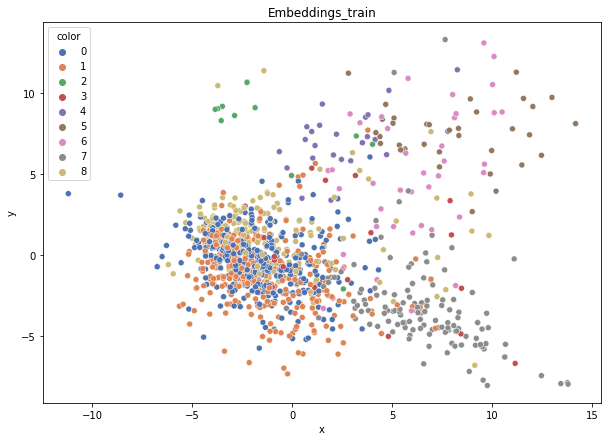

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.406
DT-f1-old+new-features: 0.423
DT-f1-old-features: 0.437
DT-gmean-new-features: 0.237
DT-gmean-old+new-features: 0.426
DT-gmean-old-features: 0.247
KNN-f1-new-features: 0.468
KNN-f1-old+new-features: 0.451
KNN-f1-old-features: 0.492
KNN-gmean-new-features: 0.438
KNN-gmean-old+new-features: 0.419
KNN-gmean-old-features: 0.439
LDA-f1-new-features: 0.485
LDA-f1-old+new-features: 0.506
LDA-f1-old-features: 0.5
LDA-gmean-new-features: 0.259
LDA-gmean-old+new-features: 0.263
LDA-gmean-old-features: 0.26
QDA-f1-new-features: 0.401
QDA-f1-old+new-features: 0.329
QDA-f1-old-features: 0.106
QDA-gmean-new-features: 0.13
QDA-gmean-old+new-features: 0.191
QDA-gmean-old-features: 0.026
RF24-f1-new-features: 0.49
RF24-f1-old+new-features: 0.511
RF24-f1-old-features: 0.531
RF24-gmean-new-features: 0.262
RF24-gmean-old+new-features: 0.271
RF24-gmean-old-features: 0.277


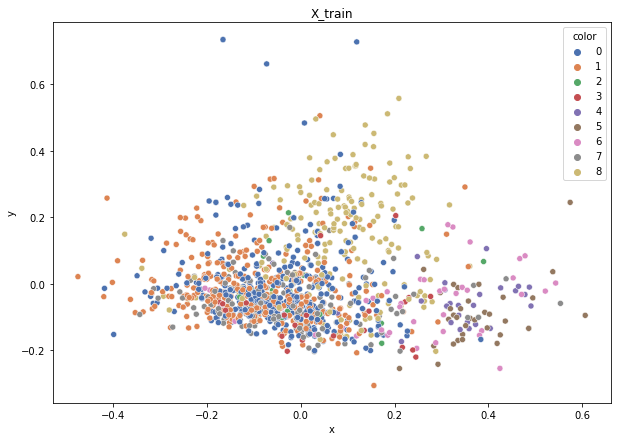

Class cardinalities: Counter({0: 370, 1: 343, 8: 196, 7: 135, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.02418370057482606, 1: 0.013819257471329179, 0: 0.012810825169367322, 5: 0.13542872321902596, 4: 0.16928590402378244, 6: 0.11560988567477826, 7: 0.035111150464191915, 3: 0.1975002213610795, 2: 0.29625033204161927}


100%|██████████| 296/296 [00:00<00:00, 3442.07it/s]


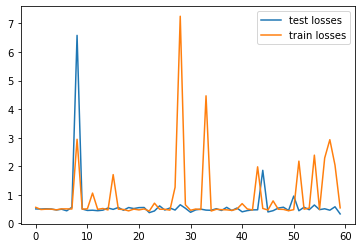

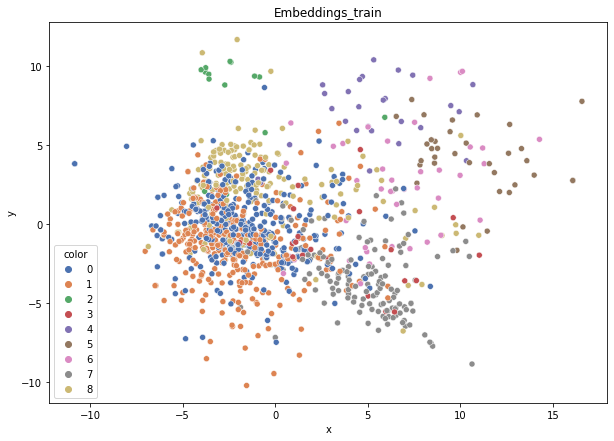

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.411
DT-f1-old+new-features: 0.426
DT-f1-old-features: 0.423
DT-gmean-new-features: 0.386
DT-gmean-old+new-features: 0.403
DT-gmean-old-features: 0.236
KNN-f1-new-features: 0.375
KNN-f1-old+new-features: 0.388
KNN-f1-old-features: 0.452
KNN-gmean-new-features: 0.349
KNN-gmean-old+new-features: 0.357
KNN-gmean-old-features: 0.403
LDA-f1-new-features: 0.501
LDA-f1-old+new-features: 0.529
LDA-f1-old-features: 0.532
LDA-gmean-new-features: 0.268
LDA-gmean-old+new-features: 0.279
LDA-gmean-old-features: 0.274
QDA-f1-new-features: 0.417
QDA-f1-old+new-features: 0.349
QDA-f1-old-features: 0.118
QDA-gmean-new-features: 0.135
QDA-gmean-old+new-features: 0.16
QDA-gmean-old-features: 0.043
RF24-f1-new-features: 0.455
RF24-f1-old+new-features: 0.495
RF24-f1-old-features: 0.569
RF24-gmean-new-features: 0.242
RF24-gmean-old+new-features: 0.264
RF24-gmean-old-features: 0.295
1czysty-cut


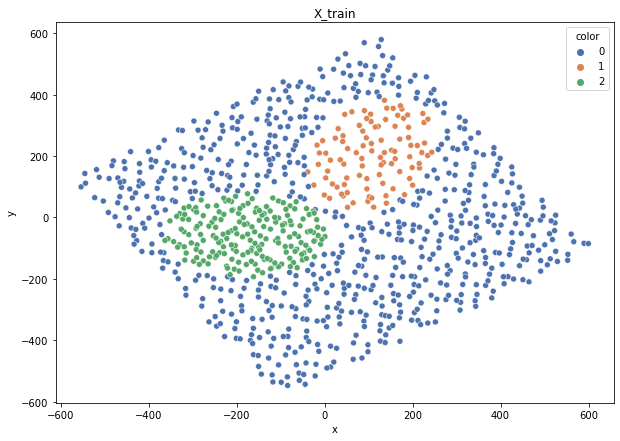

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3322.24it/s]


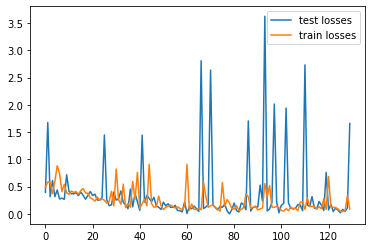

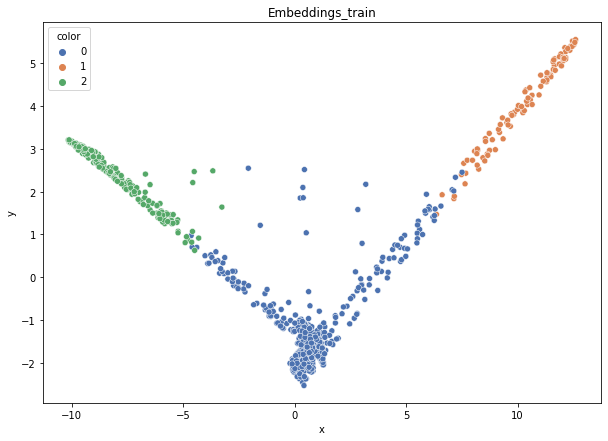

DT-f1-new-features: 0.967
DT-f1-old+new-features: 0.967
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.973
DT-gmean-old+new-features: 0.973
DT-gmean-old-features: 0.889
KNN-f1-new-features: 0.961
KNN-f1-old+new-features: 0.957
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.954
KNN-gmean-old+new-features: 0.947
KNN-gmean-old-features: 0.941
LDA-f1-new-features: 0.943
LDA-f1-old+new-features: 0.937
LDA-f1-old-features: 0.262
LDA-gmean-new-features: 0.972
LDA-gmean-old+new-features: 0.97
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.944
QDA-f1-old+new-features: 0.939
QDA-f1-old-features: 0.805
QDA-gmean-new-features: 0.982
QDA-gmean-old+new-features: 0.975
QDA-gmean-old-features: 0.701
RF24-f1-new-features: 0.957
RF24-f1-old+new-features: 0.957
RF24-f1-old-features: 0.934
RF24-gmean-new-features: 0.976
RF24-gmean-old+new-features: 0.976
RF24-gmean-old-features: 0.939


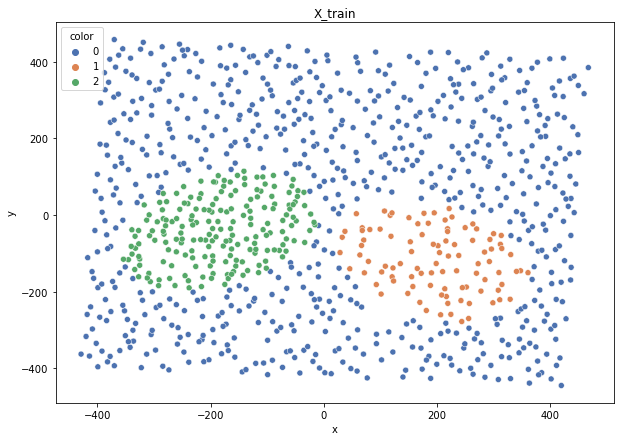

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3325.35it/s]


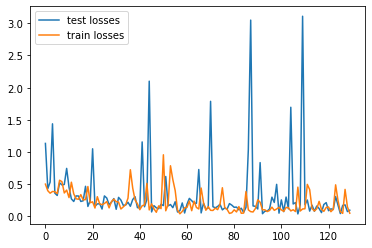

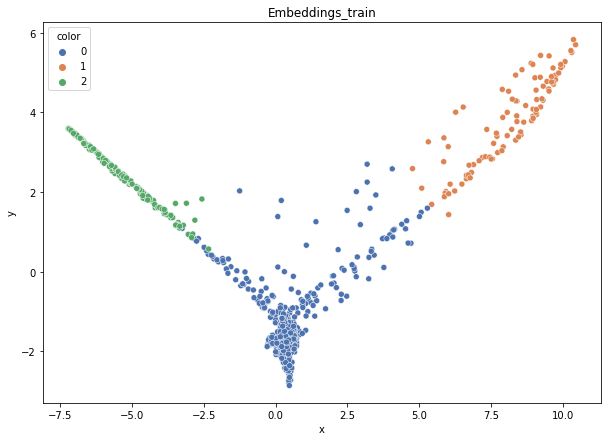

DT-f1-new-features: 0.957
DT-f1-old+new-features: 0.966
DT-f1-old-features: 0.929
DT-gmean-new-features: 0.937
DT-gmean-old+new-features: 0.953
DT-gmean-old-features: 0.928
KNN-f1-new-features: 0.966
KNN-f1-old+new-features: 0.953
KNN-f1-old-features: 0.945
KNN-gmean-new-features: 0.953
KNN-gmean-old+new-features: 0.931
KNN-gmean-old-features: 0.934
LDA-f1-new-features: 0.962
LDA-f1-old+new-features: 0.97
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.951
LDA-gmean-old+new-features: 0.966
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.954
QDA-f1-old+new-features: 0.958
QDA-f1-old-features: 0.817
QDA-gmean-new-features: 0.96
QDA-gmean-old+new-features: 0.965
QDA-gmean-old-features: 0.709
RF24-f1-new-features: 0.966
RF24-f1-old+new-features: 0.966
RF24-f1-old-features: 0.901
RF24-gmean-new-features: 0.953
RF24-gmean-old+new-features: 0.953
RF24-gmean-old-features: 0.906


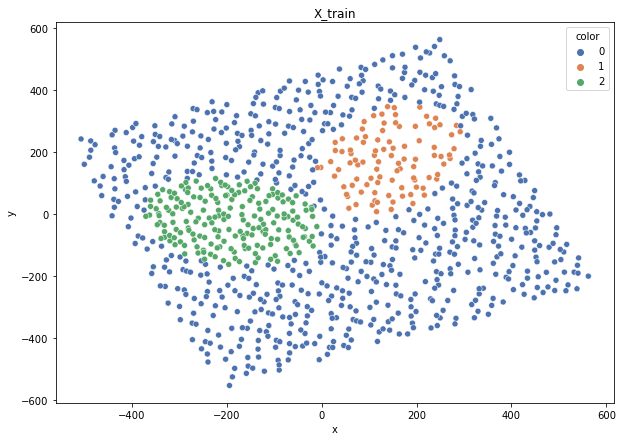

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3440.81it/s]


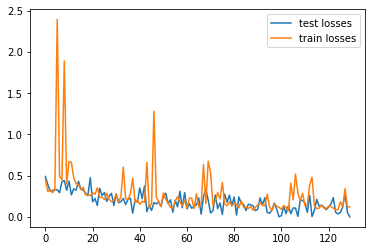

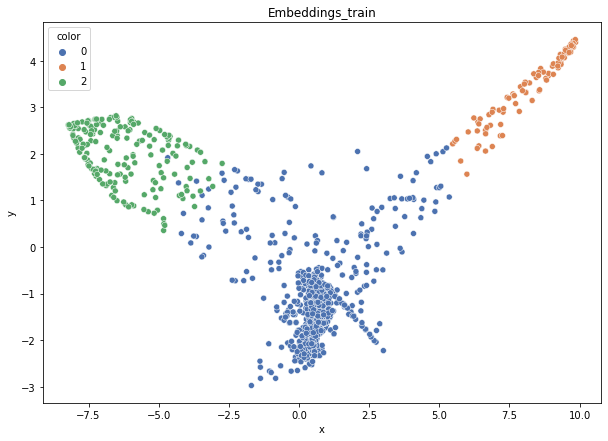

DT-f1-new-features: 0.984
DT-f1-old+new-features: 0.984
DT-f1-old-features: 0.942
DT-gmean-new-features: 0.984
DT-gmean-old+new-features: 0.984
DT-gmean-old-features: 0.934
KNN-f1-new-features: 0.984
KNN-f1-old+new-features: 0.984
KNN-f1-old-features: 0.957
KNN-gmean-new-features: 0.984
KNN-gmean-old+new-features: 0.984
KNN-gmean-old-features: 0.933
LDA-f1-new-features: 0.977
LDA-f1-old+new-features: 0.977
LDA-f1-old-features: 0.256
LDA-gmean-new-features: 0.994
LDA-gmean-old+new-features: 0.994
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.961
QDA-f1-old+new-features: 0.966
QDA-f1-old-features: 0.856
QDA-gmean-new-features: 0.988
QDA-gmean-old+new-features: 0.99
QDA-gmean-old-features: 0.783
RF24-f1-new-features: 0.984
RF24-f1-old+new-features: 0.984
RF24-f1-old-features: 0.951
RF24-gmean-new-features: 0.984
RF24-gmean-old+new-features: 0.984
RF24-gmean-old-features: 0.949


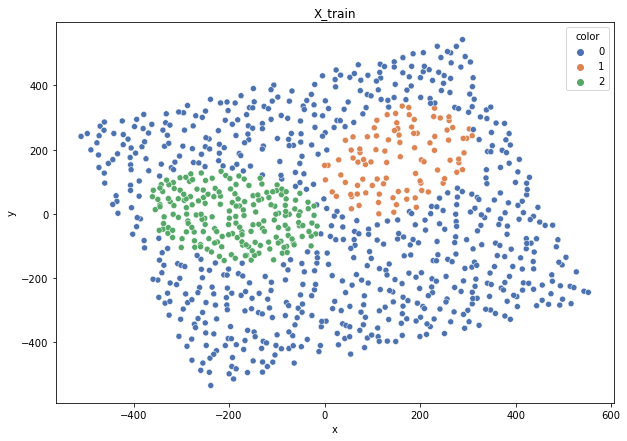

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3502.67it/s]


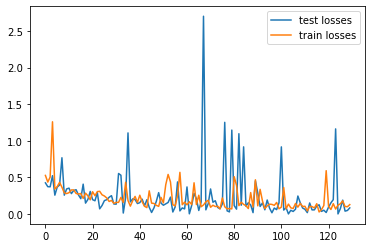

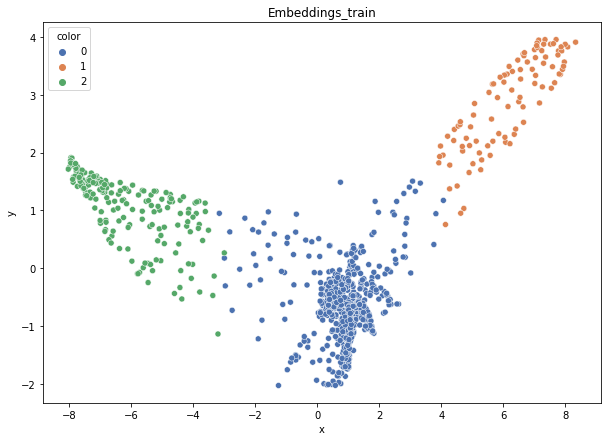

DT-f1-new-features: 0.979
DT-f1-old+new-features: 0.979
DT-f1-old-features: 0.932
DT-gmean-new-features: 0.992
DT-gmean-old+new-features: 0.992
DT-gmean-old-features: 0.959
KNN-f1-new-features: 0.996
KNN-f1-old+new-features: 0.991
KNN-f1-old-features: 0.931
KNN-gmean-new-features: 0.993
KNN-gmean-old+new-features: 0.996
KNN-gmean-old-features: 0.957
LDA-f1-new-features: 0.976
LDA-f1-old+new-features: 0.976
LDA-f1-old-features: 0.28
LDA-gmean-new-features: 0.992
LDA-gmean-old+new-features: 0.992
LDA-gmean-old-features: 0.034
QDA-f1-new-features: 0.945
QDA-f1-old+new-features: 0.937
QDA-f1-old-features: 0.864
QDA-gmean-new-features: 0.98
QDA-gmean-old+new-features: 0.973
QDA-gmean-old-features: 0.798
RF24-f1-new-features: 0.983
RF24-f1-old+new-features: 0.983
RF24-f1-old-features: 0.937
RF24-gmean-new-features: 0.994
RF24-gmean-old+new-features: 0.994
RF24-gmean-old-features: 0.963


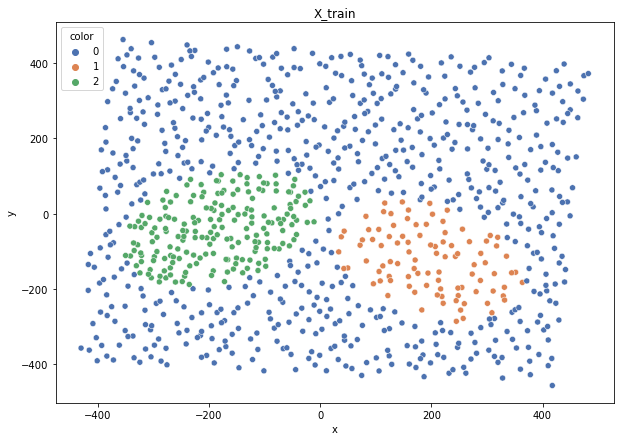

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3469.94it/s]


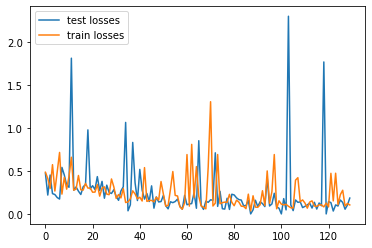

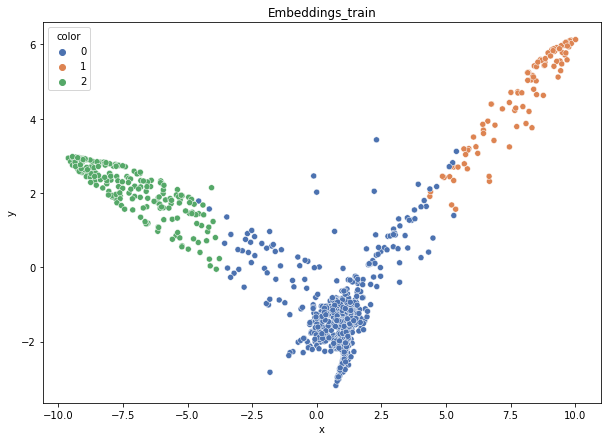

DT-f1-new-features: 0.987
DT-f1-old+new-features: 0.987
DT-f1-old-features: 0.973
DT-gmean-new-features: 0.984
DT-gmean-old+new-features: 0.984
DT-gmean-old-features: 0.973
KNN-f1-new-features: 0.991
KNN-f1-old+new-features: 0.983
KNN-f1-old-features: 0.958
KNN-gmean-new-features: 0.991
KNN-gmean-old+new-features: 0.977
KNN-gmean-old-features: 0.955
LDA-f1-new-features: 0.991
LDA-f1-old+new-features: 0.991
LDA-f1-old-features: 0.259
LDA-gmean-new-features: 0.996
LDA-gmean-old+new-features: 0.996
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.962
QDA-f1-old+new-features: 0.948
QDA-f1-old-features: 0.728
QDA-gmean-new-features: 0.974
QDA-gmean-old+new-features: 0.948
QDA-gmean-old-features: 0.59
RF24-f1-new-features: 0.987
RF24-f1-old+new-features: 0.987
RF24-f1-old-features: 0.948
RF24-gmean-new-features: 0.984
RF24-gmean-old+new-features: 0.984
RF24-gmean-old-features: 0.936
2delikatne-cut


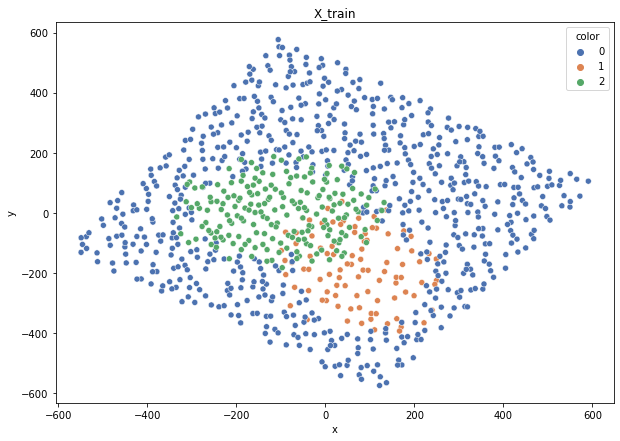

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3305.87it/s]


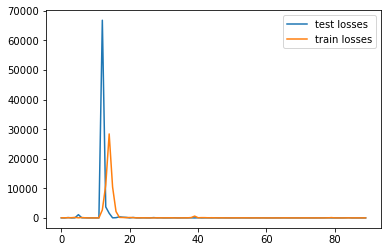

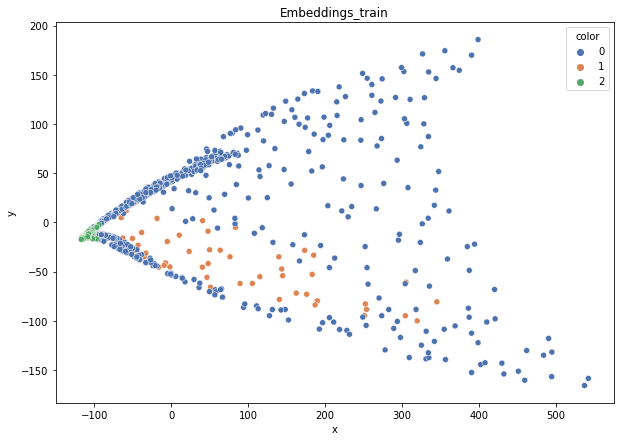

DT-f1-new-features: 0.733
DT-f1-old+new-features: 0.765
DT-f1-old-features: 0.69
DT-gmean-new-features: 0.734
DT-gmean-old+new-features: 0.755
DT-gmean-old-features: 0.674
KNN-f1-new-features: 0.705
KNN-f1-old+new-features: 0.705
KNN-f1-old-features: 0.693
KNN-gmean-new-features: 0.689
KNN-gmean-old+new-features: 0.689
KNN-gmean-old-features: 0.674
LDA-f1-new-features: 0.75
LDA-f1-old+new-features: 0.763
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.736
LDA-gmean-old+new-features: 0.754
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.776
QDA-f1-old+new-features: 0.776
QDA-f1-old-features: 0.615
QDA-gmean-new-features: 0.856
QDA-gmean-old+new-features: 0.864
QDA-gmean-old-features: 0.443
RF24-f1-new-features: 0.788
RF24-f1-old+new-features: 0.764
RF24-f1-old-features: 0.774
RF24-gmean-new-features: 0.79
RF24-gmean-old+new-features: 0.758
RF24-gmean-old-features: 0.76


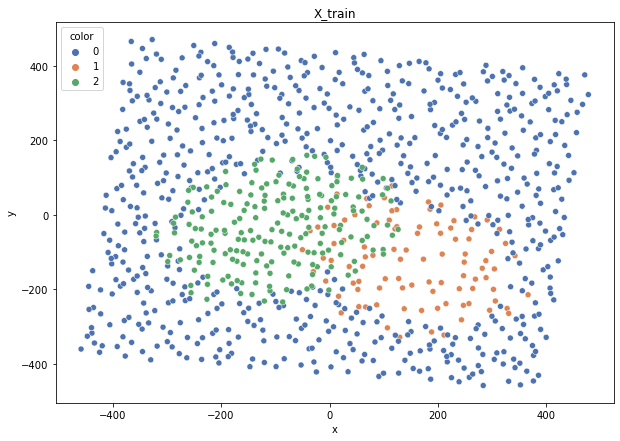

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3411.10it/s]


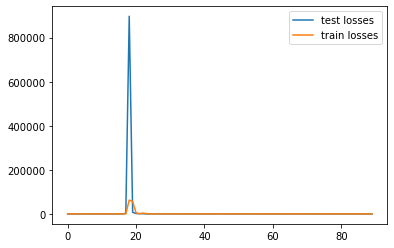

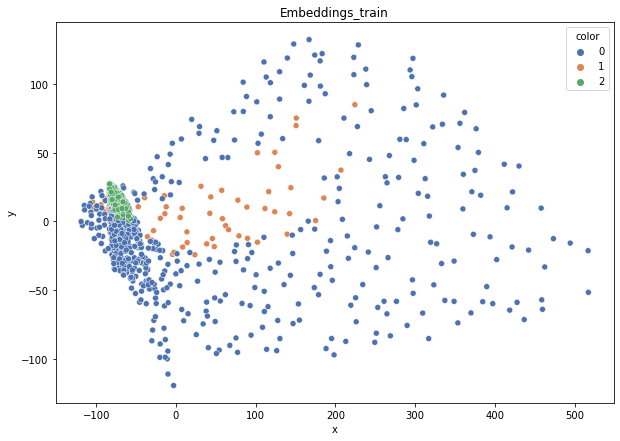

DT-f1-new-features: 0.696
DT-f1-old+new-features: 0.801
DT-f1-old-features: 0.763
DT-gmean-new-features: 0.708
DT-gmean-old+new-features: 0.796
DT-gmean-old-features: 0.787
KNN-f1-new-features: 0.769
KNN-f1-old+new-features: 0.769
KNN-f1-old-features: 0.742
KNN-gmean-new-features: 0.76
KNN-gmean-old+new-features: 0.76
KNN-gmean-old-features: 0.727
LDA-f1-new-features: 0.769
LDA-f1-old+new-features: 0.799
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.825
LDA-gmean-old+new-features: 0.838
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.764
QDA-f1-old+new-features: 0.776
QDA-f1-old-features: 0.646
QDA-gmean-new-features: 0.82
QDA-gmean-old+new-features: 0.825
QDA-gmean-old-features: 0.503
RF24-f1-new-features: 0.82
RF24-f1-old+new-features: 0.804
RF24-f1-old-features: 0.776
RF24-gmean-new-features: 0.824
RF24-gmean-old+new-features: 0.821
RF24-gmean-old-features: 0.776


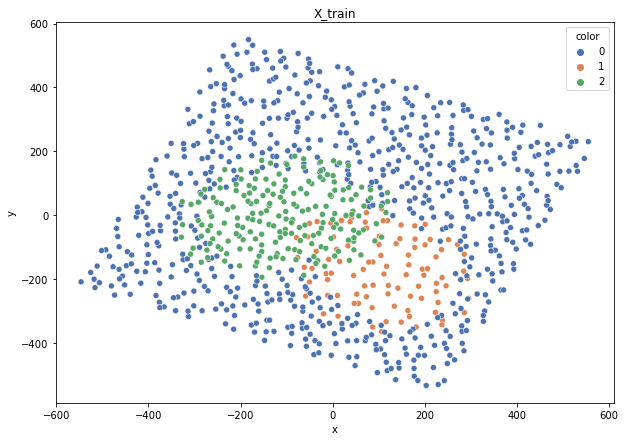

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3514.47it/s]


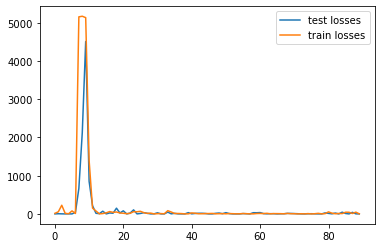

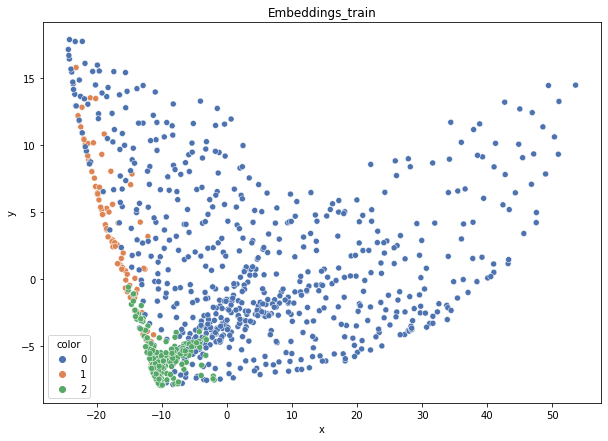

DT-f1-new-features: 0.715
DT-f1-old+new-features: 0.739
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.709
DT-gmean-old+new-features: 0.732
DT-gmean-old-features: 0.727
KNN-f1-new-features: 0.693
KNN-f1-old+new-features: 0.693
KNN-f1-old-features: 0.666
KNN-gmean-new-features: 0.681
KNN-gmean-old+new-features: 0.681
KNN-gmean-old-features: 0.636
LDA-f1-new-features: 0.797
LDA-f1-old+new-features: 0.803
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.777
LDA-gmean-old+new-features: 0.783
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.748
QDA-f1-old+new-features: 0.754
QDA-f1-old-features: 0.657
QDA-gmean-new-features: 0.806
QDA-gmean-old+new-features: 0.809
QDA-gmean-old-features: 0.514
RF24-f1-new-features: 0.788
RF24-f1-old+new-features: 0.767
RF24-f1-old-features: 0.757
RF24-gmean-new-features: 0.788
RF24-gmean-old+new-features: 0.759
RF24-gmean-old-features: 0.754


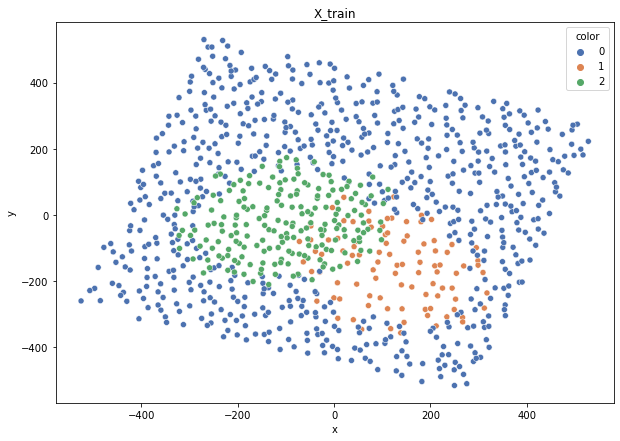

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3448.72it/s]


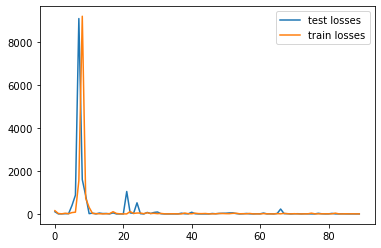

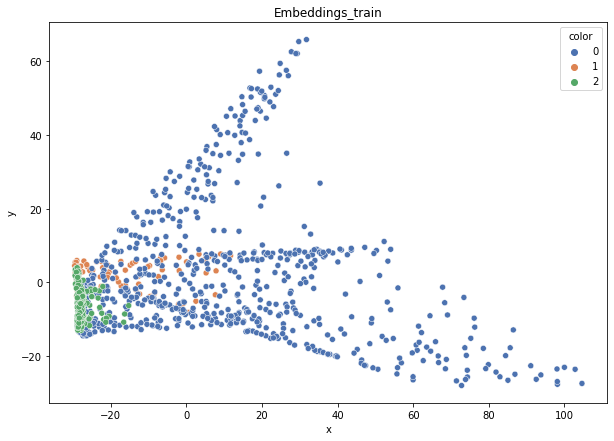

DT-f1-new-features: 0.76
DT-f1-old+new-features: 0.749
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.8
DT-gmean-old+new-features: 0.773
DT-gmean-old-features: 0.724
KNN-f1-new-features: 0.75
KNN-f1-old+new-features: 0.75
KNN-f1-old-features: 0.73
KNN-gmean-new-features: 0.75
KNN-gmean-old+new-features: 0.75
KNN-gmean-old-features: 0.735
LDA-f1-new-features: 0.773
LDA-f1-old+new-features: 0.763
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.769
LDA-gmean-old+new-features: 0.769
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.73
QDA-f1-old+new-features: 0.73
QDA-f1-old-features: 0.668
QDA-gmean-new-features: 0.792
QDA-gmean-old+new-features: 0.792
QDA-gmean-old-features: 0.534
RF24-f1-new-features: 0.769
RF24-f1-old+new-features: 0.73
RF24-f1-old-features: 0.714
RF24-gmean-new-features: 0.769
RF24-gmean-old+new-features: 0.736
RF24-gmean-old-features: 0.712


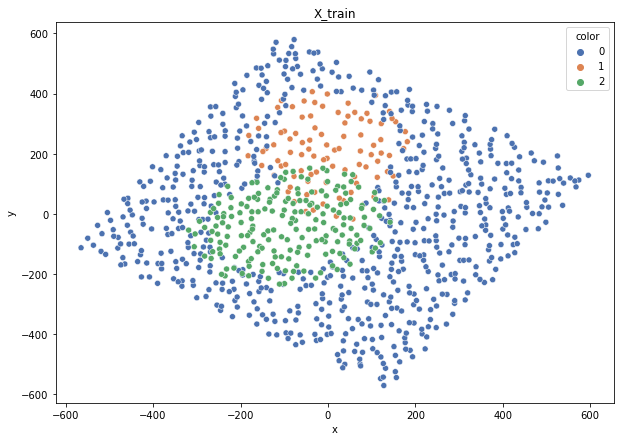

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3414.33it/s]


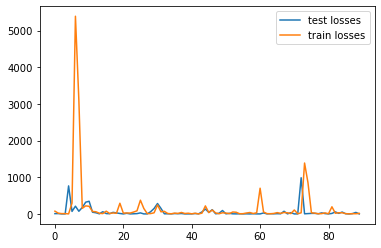

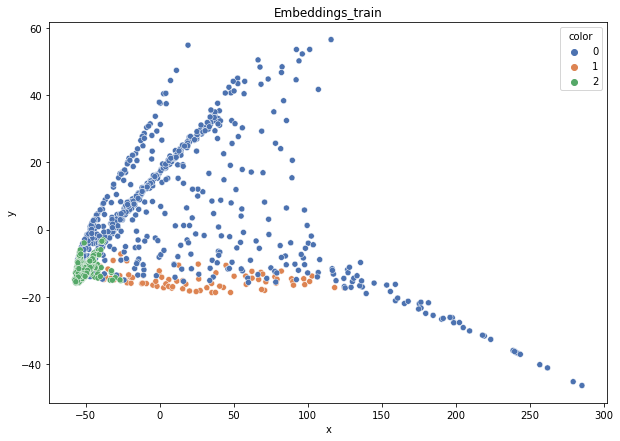

DT-f1-new-features: 0.675
DT-f1-old+new-features: 0.666
DT-f1-old-features: 0.744
DT-gmean-new-features: 0.673
DT-gmean-old+new-features: 0.646
DT-gmean-old-features: 0.774
KNN-f1-new-features: 0.718
KNN-f1-old+new-features: 0.718
KNN-f1-old-features: 0.669
KNN-gmean-new-features: 0.694
KNN-gmean-old+new-features: 0.694
KNN-gmean-old-features: 0.62
LDA-f1-new-features: 0.74
LDA-f1-old+new-features: 0.745
LDA-f1-old-features: 0.273
LDA-gmean-new-features: 0.715
LDA-gmean-old+new-features: 0.738
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.709
QDA-f1-old+new-features: 0.713
QDA-f1-old-features: 0.709
QDA-gmean-new-features: 0.733
QDA-gmean-old+new-features: 0.749
QDA-gmean-old-features: 0.579
RF24-f1-new-features: 0.741
RF24-f1-old+new-features: 0.8
RF24-f1-old-features: 0.785
RF24-gmean-new-features: 0.728
RF24-gmean-old+new-features: 0.77
RF24-gmean-old-features: 0.783
3mocniej-cut


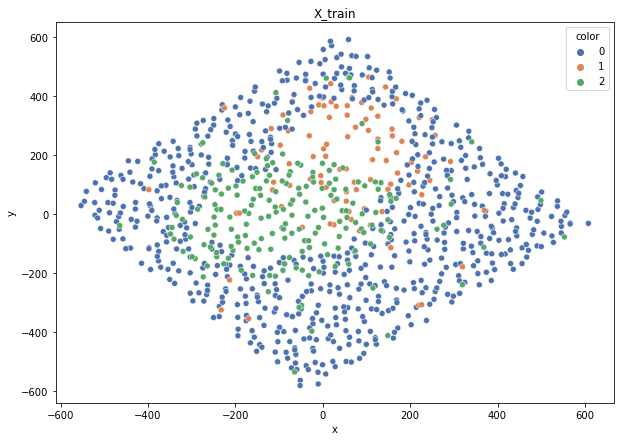

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3480.74it/s]


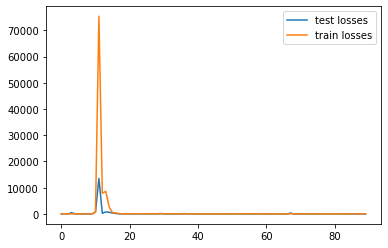

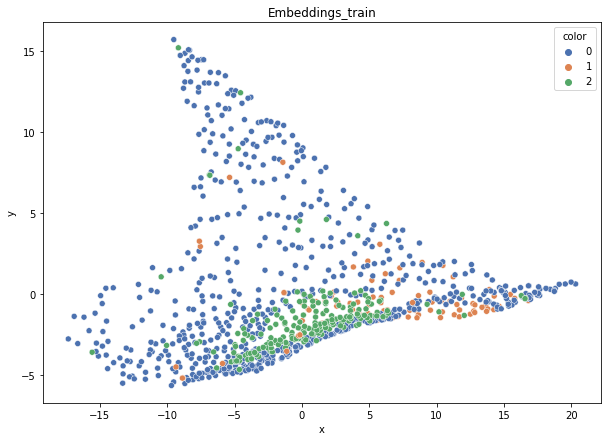

DT-f1-new-features: 0.516
DT-f1-old+new-features: 0.522
DT-f1-old-features: 0.522
DT-gmean-new-features: 0.513
DT-gmean-old+new-features: 0.514
DT-gmean-old-features: 0.524
KNN-f1-new-features: 0.538
KNN-f1-old+new-features: 0.538
KNN-f1-old-features: 0.537
KNN-gmean-new-features: 0.495
KNN-gmean-old+new-features: 0.495
KNN-gmean-old-features: 0.502
LDA-f1-new-features: 0.566
LDA-f1-old+new-features: 0.551
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.476
LDA-gmean-old+new-features: 0.448
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.531
QDA-f1-old+new-features: 0.499
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.626
QDA-gmean-old+new-features: 0.596
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.554
RF24-f1-old+new-features: 0.571
RF24-f1-old-features: 0.545
RF24-gmean-new-features: 0.491
RF24-gmean-old+new-features: 0.502
RF24-gmean-old-features: 0.493


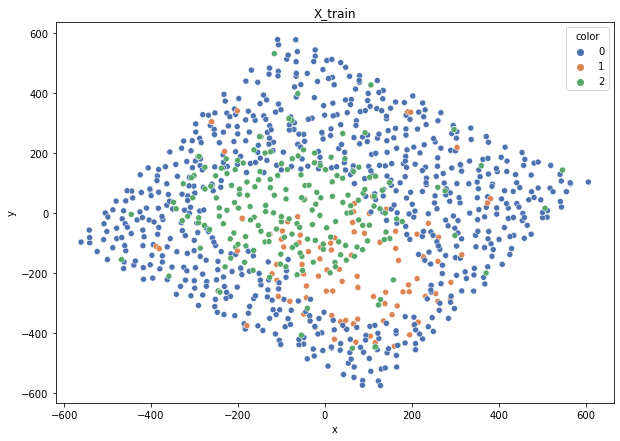

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3403.91it/s]


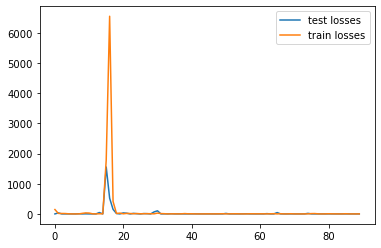

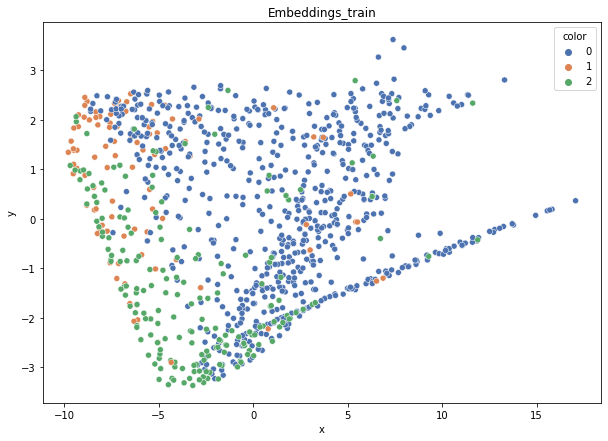

DT-f1-new-features: 0.548
DT-f1-old+new-features: 0.545
DT-f1-old-features: 0.531
DT-gmean-new-features: 0.539
DT-gmean-old+new-features: 0.535
DT-gmean-old-features: 0.547
KNN-f1-new-features: 0.54
KNN-f1-old+new-features: 0.537
KNN-f1-old-features: 0.536
KNN-gmean-new-features: 0.462
KNN-gmean-old+new-features: 0.461
KNN-gmean-old-features: 0.479
LDA-f1-new-features: 0.695
LDA-f1-old+new-features: 0.675
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.668
LDA-gmean-old+new-features: 0.645
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.645
QDA-f1-old+new-features: 0.619
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.726
QDA-gmean-old+new-features: 0.695
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.636
RF24-f1-old+new-features: 0.659
RF24-f1-old-features: 0.581
RF24-gmean-new-features: 0.56
RF24-gmean-old+new-features: 0.607
RF24-gmean-old-features: 0.551


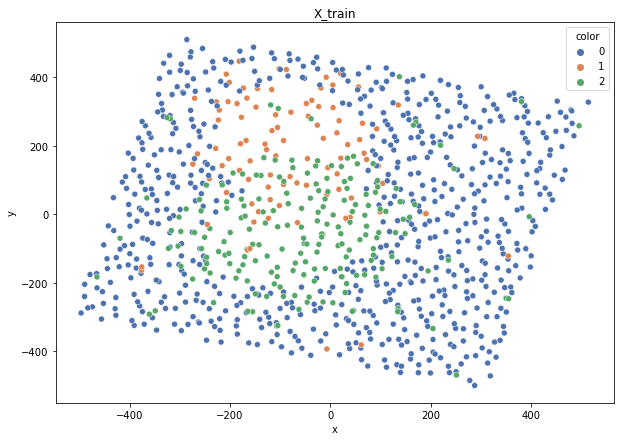

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3420.36it/s]


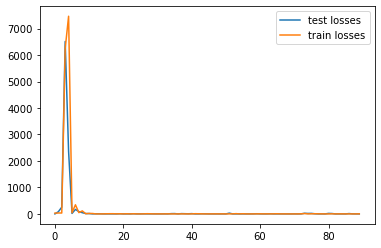

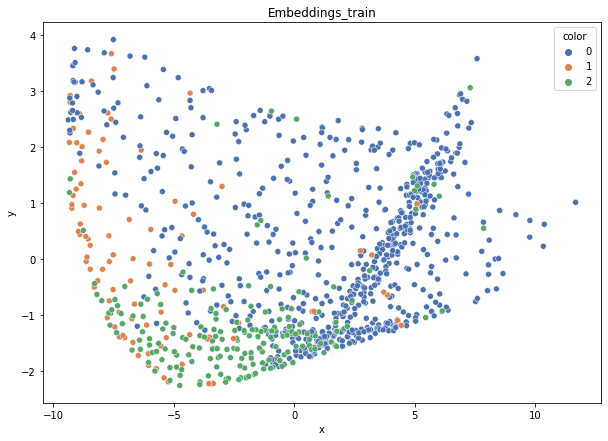

DT-f1-new-features: 0.518
DT-f1-old+new-features: 0.481
DT-f1-old-features: 0.442
DT-gmean-new-features: 0.429
DT-gmean-old+new-features: 0.4
DT-gmean-old-features: 0.43
KNN-f1-new-features: 0.489
KNN-f1-old+new-features: 0.478
KNN-f1-old-features: 0.438
KNN-gmean-new-features: 0.439
KNN-gmean-old+new-features: 0.417
KNN-gmean-old-features: 0.373
LDA-f1-new-features: 0.577
LDA-f1-old+new-features: 0.555
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.507
LDA-gmean-old+new-features: 0.484
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.508
QDA-f1-old+new-features: 0.505
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.577
QDA-gmean-old+new-features: 0.562
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.47
RF24-f1-old+new-features: 0.411
RF24-f1-old-features: 0.481
RF24-gmean-new-features: 0.354
RF24-gmean-old+new-features: 0.23
RF24-gmean-old-features: 0.396


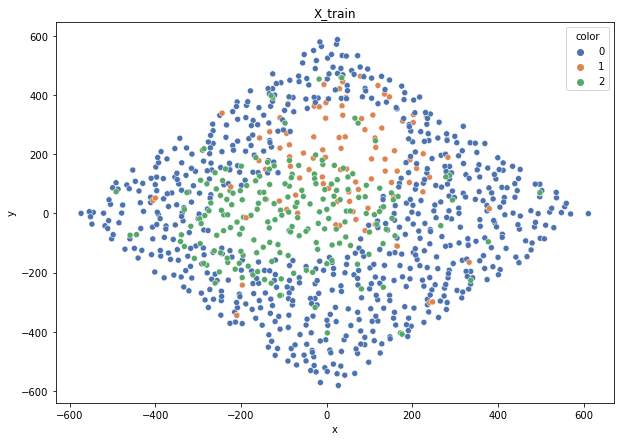

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3512.50it/s]


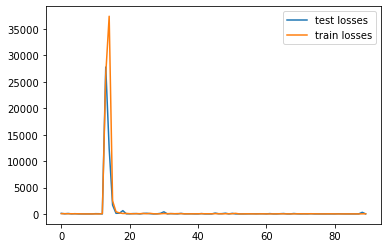

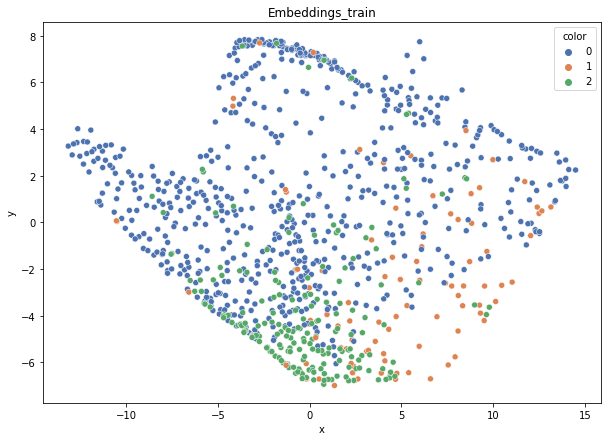

DT-f1-new-features: 0.523
DT-f1-old+new-features: 0.507
DT-f1-old-features: 0.477
DT-gmean-new-features: 0.508
DT-gmean-old+new-features: 0.458
DT-gmean-old-features: 0.473
KNN-f1-new-features: 0.549
KNN-f1-old+new-features: 0.549
KNN-f1-old-features: 0.51
KNN-gmean-new-features: 0.517
KNN-gmean-old+new-features: 0.517
KNN-gmean-old-features: 0.464
LDA-f1-new-features: 0.65
LDA-f1-old+new-features: 0.65
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.589
LDA-gmean-old+new-features: 0.583
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.635
QDA-f1-old+new-features: 0.615
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.668
QDA-gmean-old+new-features: 0.65
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.578
RF24-f1-old+new-features: 0.562
RF24-f1-old-features: 0.585
RF24-gmean-new-features: 0.539
RF24-gmean-old+new-features: 0.522
RF24-gmean-old-features: 0.584


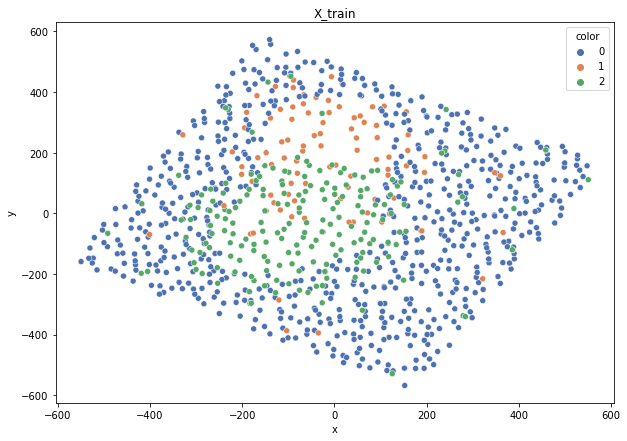

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3336.38it/s]


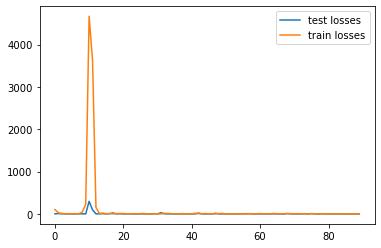

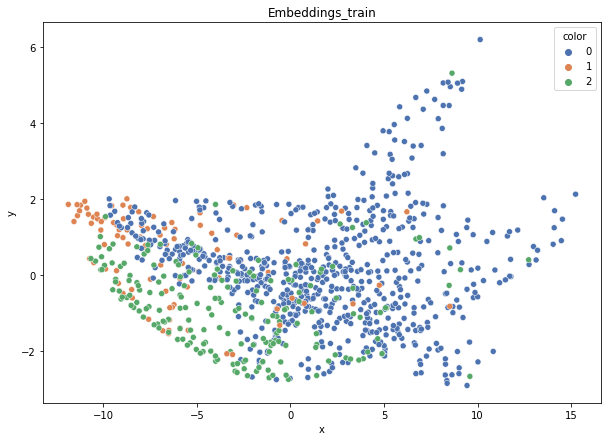

DT-f1-new-features: 0.522
DT-f1-old+new-features: 0.502
DT-f1-old-features: 0.552
DT-gmean-new-features: 0.516
DT-gmean-old+new-features: 0.517
DT-gmean-old-features: 0.536
KNN-f1-new-features: 0.524
KNN-f1-old+new-features: 0.517
KNN-f1-old-features: 0.522
KNN-gmean-new-features: 0.495
KNN-gmean-old+new-features: 0.488
KNN-gmean-old-features: 0.471
LDA-f1-new-features: 0.684
LDA-f1-old+new-features: 0.678
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.63
LDA-gmean-old+new-features: 0.615
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.631
QDA-f1-old+new-features: 0.614
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.703
QDA-gmean-old+new-features: 0.693
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.547
RF24-f1-old+new-features: 0.579
RF24-f1-old-features: 0.612
RF24-gmean-new-features: 0.467
RF24-gmean-old+new-features: 0.494
RF24-gmean-old-features: 0.574
4delikatne-bezover-cut


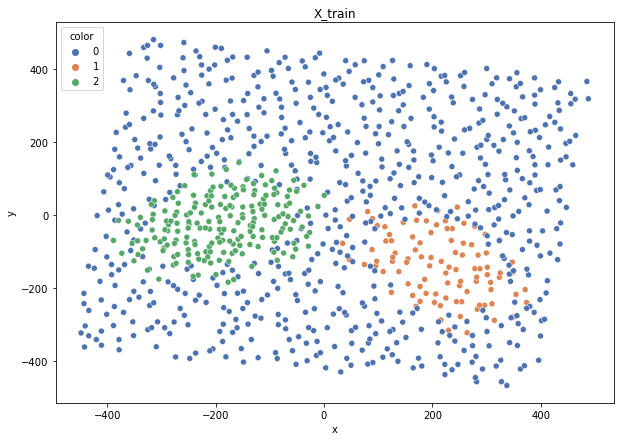

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3443.18it/s]


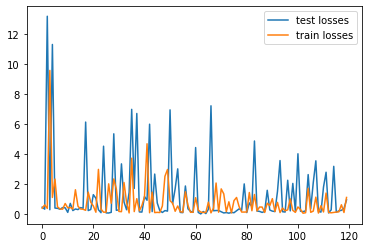

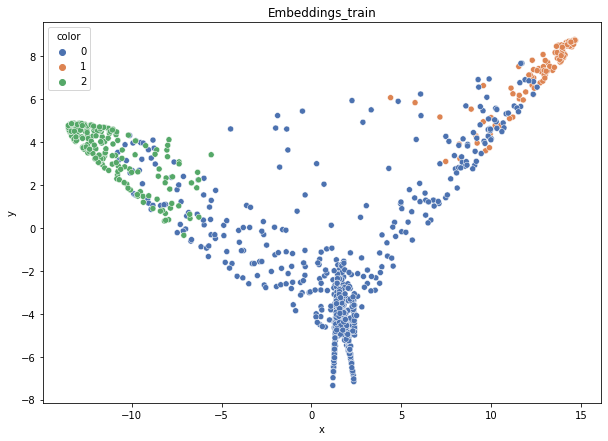

DT-f1-new-features: 0.84
DT-f1-old+new-features: 0.807
DT-f1-old-features: 0.809
DT-gmean-new-features: 0.824
DT-gmean-old+new-features: 0.793
DT-gmean-old-features: 0.814
KNN-f1-new-features: 0.811
KNN-f1-old+new-features: 0.814
KNN-f1-old-features: 0.772
KNN-gmean-new-features: 0.774
KNN-gmean-old+new-features: 0.783
KNN-gmean-old-features: 0.746
LDA-f1-new-features: 0.783
LDA-f1-old+new-features: 0.806
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.831
LDA-gmean-old+new-features: 0.845
LDA-gmean-old-features: 0.026
QDA-f1-new-features: 0.814
QDA-f1-old+new-features: 0.812
QDA-f1-old-features: 0.739
QDA-gmean-new-features: 0.845
QDA-gmean-old+new-features: 0.838
QDA-gmean-old-features: 0.64
RF24-f1-new-features: 0.804
RF24-f1-old+new-features: 0.812
RF24-f1-old-features: 0.811
RF24-gmean-new-features: 0.796
RF24-gmean-old+new-features: 0.8
RF24-gmean-old-features: 0.811


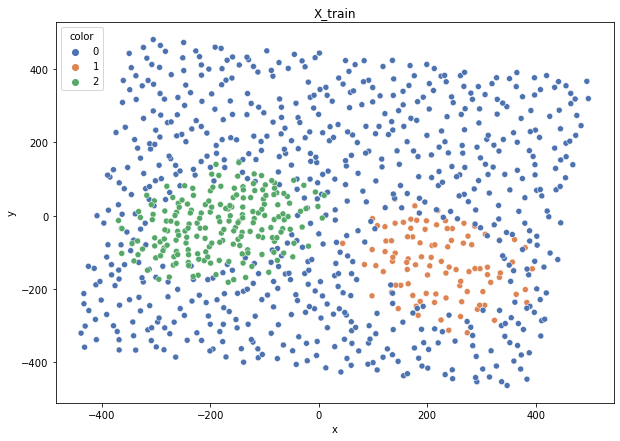

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3358.99it/s]


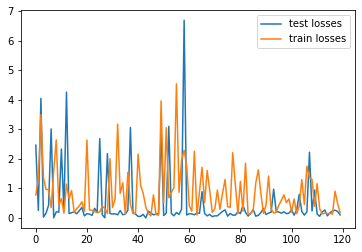

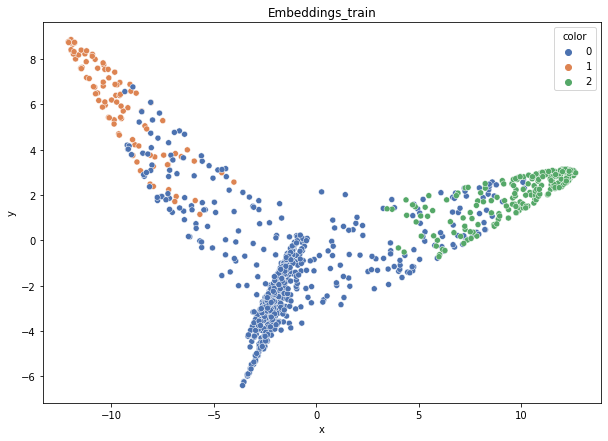

DT-f1-new-features: 0.756
DT-f1-old+new-features: 0.766
DT-f1-old-features: 0.761
DT-gmean-new-features: 0.782
DT-gmean-old+new-features: 0.785
DT-gmean-old-features: 0.769
KNN-f1-new-features: 0.8
KNN-f1-old+new-features: 0.788
KNN-f1-old-features: 0.767
KNN-gmean-new-features: 0.804
KNN-gmean-old+new-features: 0.795
KNN-gmean-old-features: 0.776
LDA-f1-new-features: 0.829
LDA-f1-old+new-features: 0.829
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.86
LDA-gmean-old+new-features: 0.86
LDA-gmean-old-features: 0.027
QDA-f1-new-features: 0.81
QDA-f1-old+new-features: 0.817
QDA-f1-old-features: 0.843
QDA-gmean-new-features: 0.889
QDA-gmean-old+new-features: 0.917
QDA-gmean-old-features: 0.8
RF24-f1-new-features: 0.793
RF24-f1-old+new-features: 0.798
RF24-f1-old-features: 0.826
RF24-gmean-new-features: 0.802
RF24-gmean-old+new-features: 0.809
RF24-gmean-old-features: 0.845


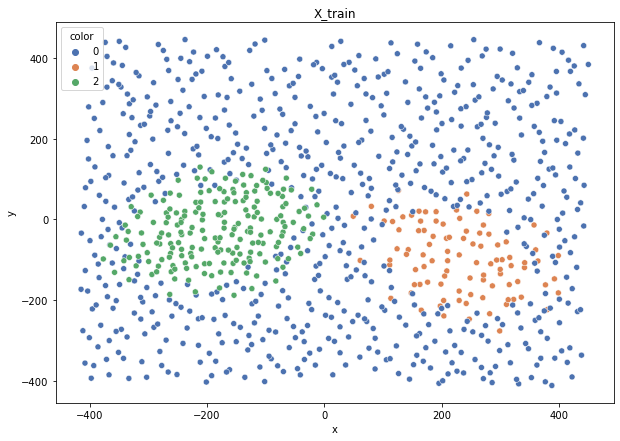

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3345.28it/s]


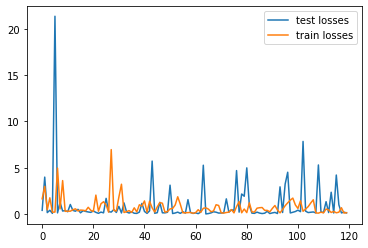

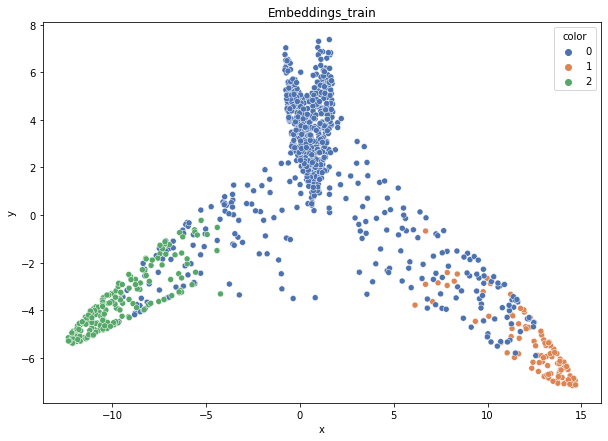

DT-f1-new-features: 0.841
DT-f1-old+new-features: 0.827
DT-f1-old-features: 0.785
DT-gmean-new-features: 0.844
DT-gmean-old+new-features: 0.82
DT-gmean-old-features: 0.785
KNN-f1-new-features: 0.82
KNN-f1-old+new-features: 0.828
KNN-f1-old-features: 0.766
KNN-gmean-new-features: 0.803
KNN-gmean-old+new-features: 0.81
KNN-gmean-old-features: 0.744
LDA-f1-new-features: 0.849
LDA-f1-old+new-features: 0.849
LDA-f1-old-features: 0.276
LDA-gmean-new-features: 0.876
LDA-gmean-old+new-features: 0.876
LDA-gmean-old-features: 0.027
QDA-f1-new-features: 0.842
QDA-f1-old+new-features: 0.855
QDA-f1-old-features: 0.718
QDA-gmean-new-features: 0.894
QDA-gmean-old+new-features: 0.909
QDA-gmean-old-features: 0.599
RF24-f1-new-features: 0.819
RF24-f1-old+new-features: 0.81
RF24-f1-old-features: 0.801
RF24-gmean-new-features: 0.803
RF24-gmean-old+new-features: 0.79
RF24-gmean-old-features: 0.78


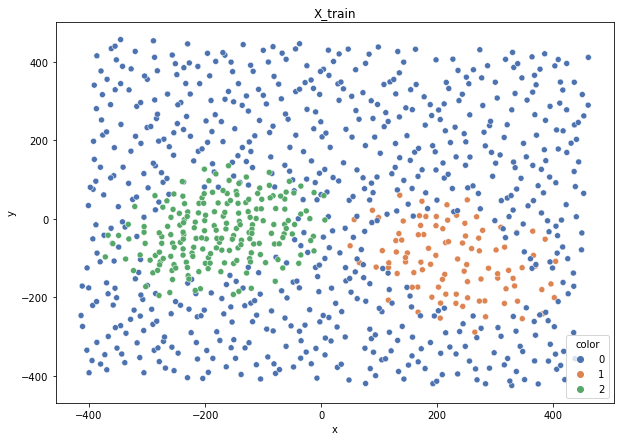

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3530.61it/s]


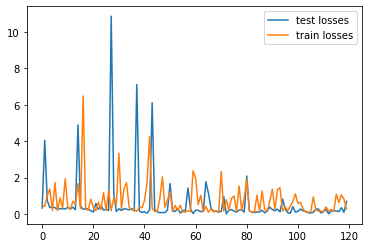

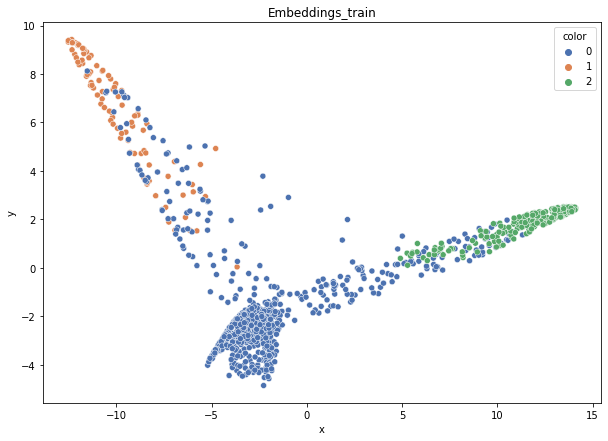

DT-f1-new-features: 0.817
DT-f1-old+new-features: 0.83
DT-f1-old-features: 0.805
DT-gmean-new-features: 0.825
DT-gmean-old+new-features: 0.836
DT-gmean-old-features: 0.831
KNN-f1-new-features: 0.818
KNN-f1-old+new-features: 0.81
KNN-f1-old-features: 0.747
KNN-gmean-new-features: 0.833
KNN-gmean-old+new-features: 0.829
KNN-gmean-old-features: 0.749
LDA-f1-new-features: 0.843
LDA-f1-old+new-features: 0.843
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.916
LDA-gmean-old+new-features: 0.916
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.786
QDA-f1-old+new-features: 0.784
QDA-f1-old-features: 0.828
QDA-gmean-new-features: 0.906
QDA-gmean-old+new-features: 0.896
QDA-gmean-old-features: 0.78
RF24-f1-new-features: 0.843
RF24-f1-old+new-features: 0.856
RF24-f1-old-features: 0.827
RF24-gmean-new-features: 0.874
RF24-gmean-old+new-features: 0.885
RF24-gmean-old-features: 0.871


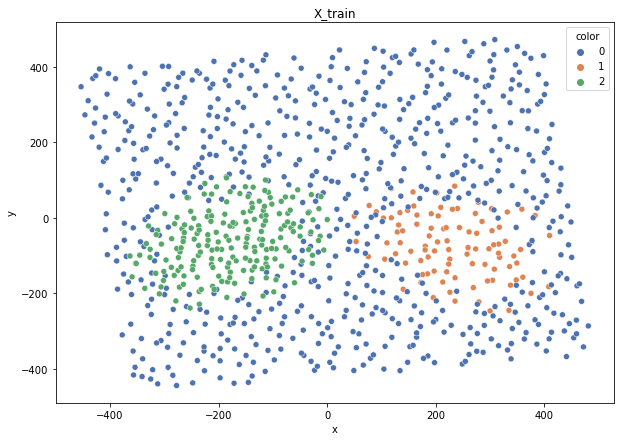

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


100%|██████████| 240/240 [00:00<00:00, 3457.49it/s]


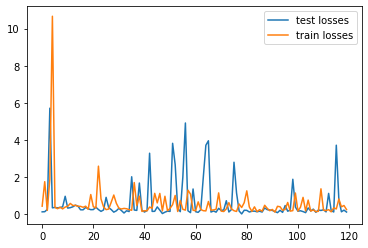

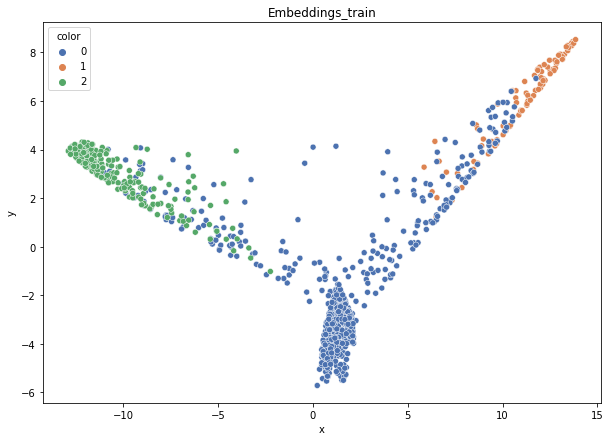

DT-f1-new-features: 0.831
DT-f1-old+new-features: 0.813
DT-f1-old-features: 0.821
DT-gmean-new-features: 0.866
DT-gmean-old+new-features: 0.839
DT-gmean-old-features: 0.866
KNN-f1-new-features: 0.83
KNN-f1-old+new-features: 0.822
KNN-f1-old-features: 0.786
KNN-gmean-new-features: 0.834
KNN-gmean-old+new-features: 0.82
KNN-gmean-old-features: 0.788
LDA-f1-new-features: 0.881
LDA-f1-old+new-features: 0.875
LDA-f1-old-features: 0.264
LDA-gmean-new-features: 0.934
LDA-gmean-old+new-features: 0.932
LDA-gmean-old-features: 0.026
QDA-f1-new-features: 0.829
QDA-f1-old+new-features: 0.829
QDA-f1-old-features: 0.841
QDA-gmean-new-features: 0.921
QDA-gmean-old+new-features: 0.921
QDA-gmean-old-features: 0.767
RF24-f1-new-features: 0.848
RF24-f1-old+new-features: 0.829
RF24-f1-old-features: 0.836
RF24-gmean-new-features: 0.885
RF24-gmean-old+new-features: 0.863
RF24-gmean-old-features: 0.87
balance-scale


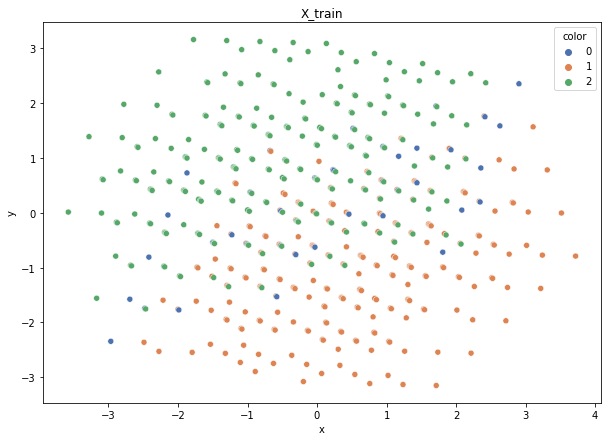

Class cardinalities: Counter({1: 231, 2: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.1266928236932034, 1: 0.12614436991098174}


100%|██████████| 125/125 [00:00<00:00, 3341.80it/s]


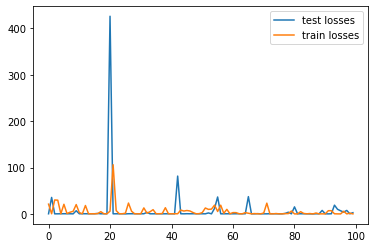

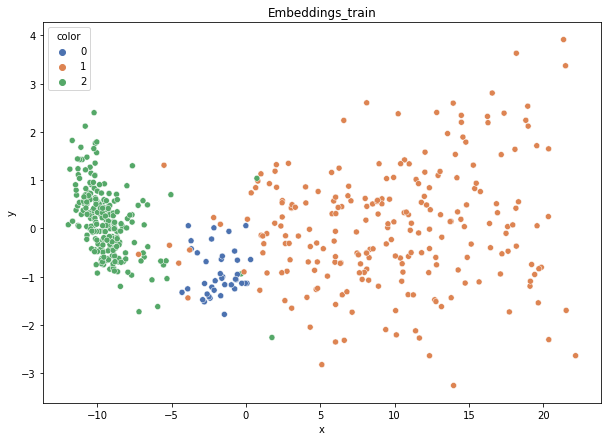

DT-f1-new-features: 0.796
DT-f1-old+new-features: 0.82
DT-f1-old-features: 0.568
DT-gmean-new-features: 0.799
DT-gmean-old+new-features: 0.836
DT-gmean-old-features: 0.088
KNN-f1-new-features: 0.762
KNN-f1-old+new-features: 0.785
KNN-f1-old-features: 0.568
KNN-gmean-new-features: 0.747
KNN-gmean-old+new-features: 0.789
KNN-gmean-old-features: 0.09
LDA-f1-new-features: 0.786
LDA-f1-old+new-features: 0.797
LDA-f1-old-features: 0.617
LDA-gmean-new-features: 0.793
LDA-gmean-old+new-features: 0.798
LDA-gmean-old-features: 0.098
QDA-f1-new-features: 0.786
QDA-f1-old+new-features: 0.835
QDA-f1-old-features: 0.936
QDA-gmean-new-features: 0.794
QDA-gmean-old+new-features: 0.77
QDA-gmean-old-features: 0.971
RF24-f1-new-features: 0.847
RF24-f1-old+new-features: 0.836
RF24-f1-old-features: 0.585
RF24-gmean-new-features: 0.885
RF24-gmean-old+new-features: 0.879
RF24-gmean-old-features: 0.092


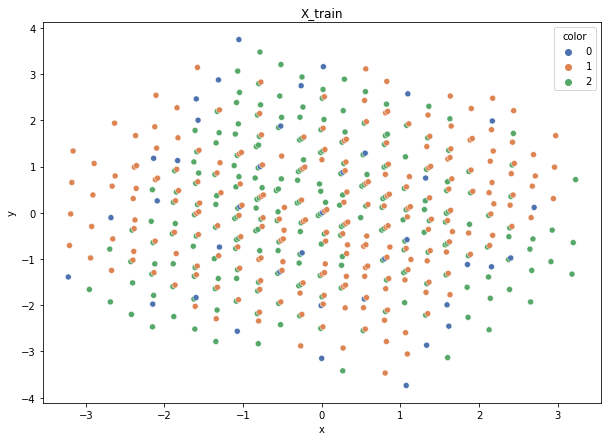

Class cardinalities: Counter({1: 231, 2: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.1266928236932034, 1: 0.12614436991098174}


100%|██████████| 125/125 [00:00<00:00, 3251.16it/s]


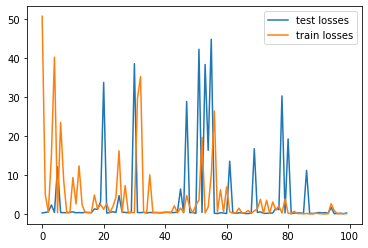

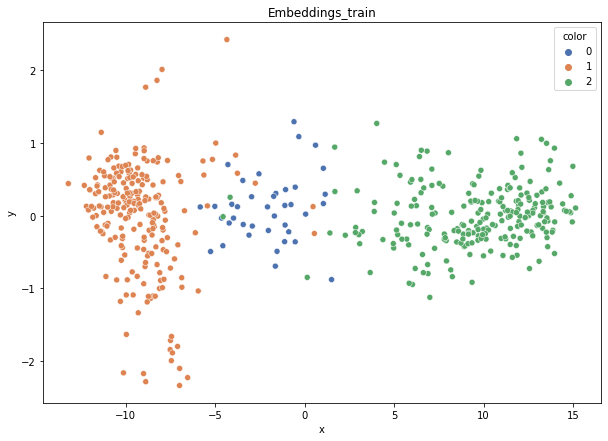

DT-f1-new-features: 0.821
DT-f1-old+new-features: 0.821
DT-f1-old-features: 0.638
DT-gmean-new-features: 0.874
DT-gmean-old+new-features: 0.874
DT-gmean-old-features: 0.585
KNN-f1-new-features: 0.785
KNN-f1-old+new-features: 0.808
KNN-f1-old-features: 0.545
KNN-gmean-new-features: 0.825
KNN-gmean-old+new-features: 0.885
KNN-gmean-old-features: 0.088
LDA-f1-new-features: 0.769
LDA-f1-old+new-features: 0.761
LDA-f1-old-features: 0.601
LDA-gmean-new-features: 0.862
LDA-gmean-old+new-features: 0.856
LDA-gmean-old-features: 0.096
QDA-f1-new-features: 0.793
QDA-f1-old+new-features: 0.877
QDA-f1-old-features: 0.845
QDA-gmean-new-features: 0.851
QDA-gmean-old+new-features: 0.885
QDA-gmean-old-features: 0.908
RF24-f1-new-features: 0.784
RF24-f1-old+new-features: 0.784
RF24-f1-old-features: 0.591
RF24-gmean-new-features: 0.851
RF24-gmean-old+new-features: 0.851
RF24-gmean-old-features: 0.092


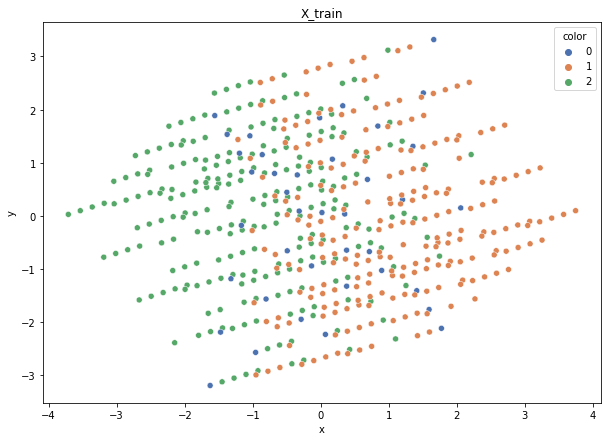

Class cardinalities: Counter({2: 231, 1: 230, 0: 39})
Weights: {2: 0.12614436991098174, 1: 0.1266928236932034, 0: 0.7471628063958148}


100%|██████████| 125/125 [00:00<00:00, 3320.76it/s]


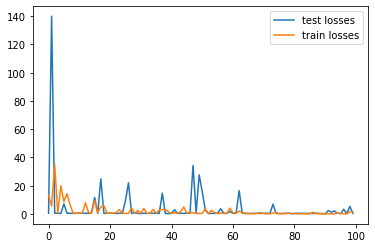

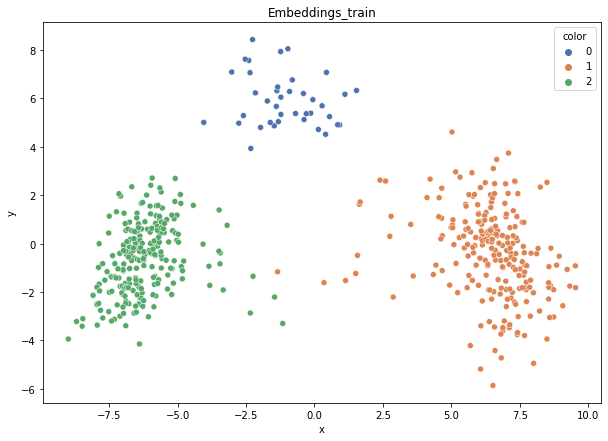

DT-f1-new-features: 0.904
DT-f1-old+new-features: 0.904
DT-f1-old-features: 0.655
DT-gmean-new-features: 0.861
DT-gmean-old+new-features: 0.861
DT-gmean-old-features: 0.597
KNN-f1-new-features: 0.94
KNN-f1-old+new-features: 0.94
KNN-f1-old-features: 0.566
KNN-gmean-new-features: 0.912
KNN-gmean-old+new-features: 0.912
KNN-gmean-old-features: 0.09
LDA-f1-new-features: 0.893
LDA-f1-old+new-features: 0.878
LDA-f1-old-features: 0.6
LDA-gmean-new-features: 0.931
LDA-gmean-old+new-features: 0.901
LDA-gmean-old-features: 0.096
QDA-f1-new-features: 0.921
QDA-f1-old+new-features: 0.946
QDA-f1-old-features: 0.836
QDA-gmean-new-features: 0.877
QDA-gmean-old+new-features: 0.917
QDA-gmean-old-features: 0.923
RF24-f1-new-features: 0.921
RF24-f1-old+new-features: 0.921
RF24-f1-old-features: 0.602
RF24-gmean-new-features: 0.877
RF24-gmean-old+new-features: 0.877
RF24-gmean-old-features: 0.093


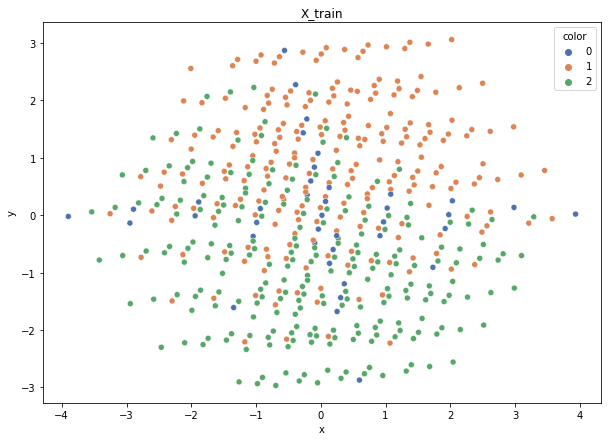

Class cardinalities: Counter({2: 231, 1: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.12614436991098174, 1: 0.1266928236932034}


100%|██████████| 125/125 [00:00<00:00, 3354.39it/s]


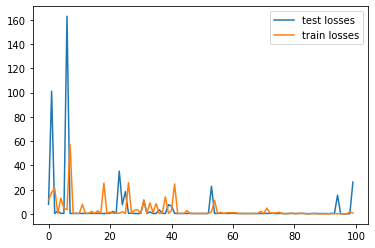

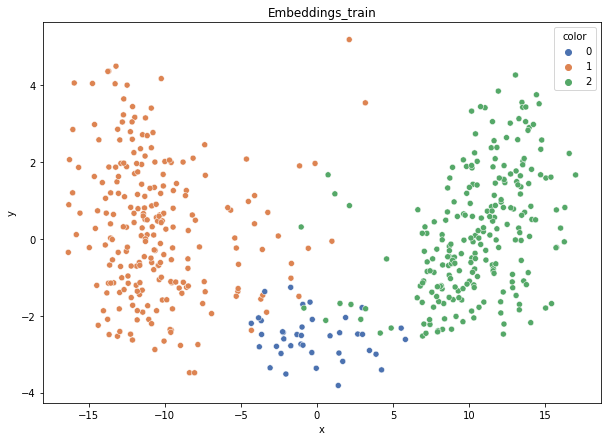

DT-f1-new-features: 0.82
DT-f1-old+new-features: 0.79
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.835
DT-gmean-old+new-features: 0.814
DT-gmean-old-features: 0.397
KNN-f1-new-features: 0.836
KNN-f1-old+new-features: 0.824
KNN-f1-old-features: 0.562
KNN-gmean-new-features: 0.868
KNN-gmean-old+new-features: 0.863
KNN-gmean-old-features: 0.089
LDA-f1-new-features: 0.832
LDA-f1-old+new-features: 0.826
LDA-f1-old-features: 0.6
LDA-gmean-new-features: 0.923
LDA-gmean-old+new-features: 0.917
LDA-gmean-old-features: 0.096
QDA-f1-new-features: 0.877
QDA-f1-old+new-features: 0.91
QDA-f1-old-features: 0.809
QDA-gmean-new-features: 0.885
QDA-gmean-old+new-features: 0.896
QDA-gmean-old-features: 0.862
RF24-f1-new-features: 0.848
RF24-f1-old+new-features: 0.848
RF24-f1-old-features: 0.603
RF24-gmean-new-features: 0.879
RF24-gmean-old+new-features: 0.879
RF24-gmean-old-features: 0.094


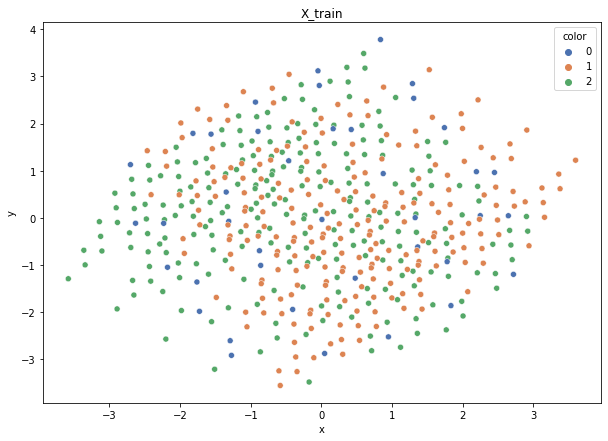

Class cardinalities: Counter({2: 230, 1: 230, 0: 40})
Weights: {0: 0.7419354838709677, 2: 0.12903225806451613, 1: 0.12903225806451613}


100%|██████████| 125/125 [00:00<00:00, 3265.76it/s]


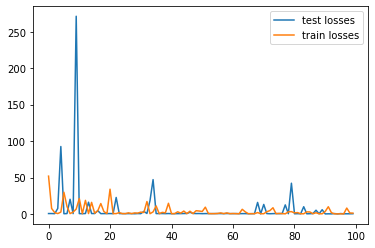

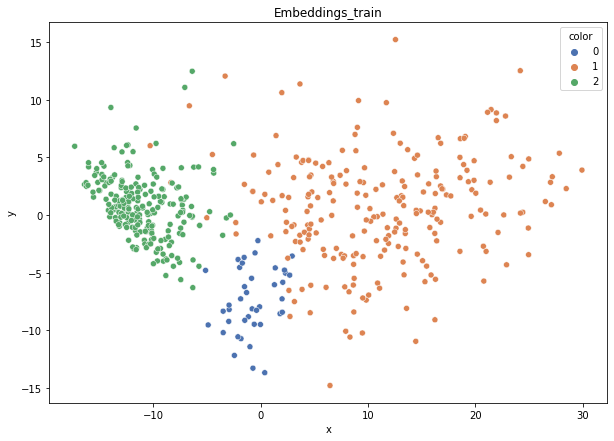

DT-f1-new-features: 0.801
DT-f1-old+new-features: 0.812
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.728
DT-gmean-old+new-features: 0.737
DT-gmean-old-features: 0.415
KNN-f1-new-features: 0.775
KNN-f1-old+new-features: 0.792
KNN-f1-old-features: 0.563
KNN-gmean-new-features: 0.728
KNN-gmean-old+new-features: 0.741
KNN-gmean-old-features: 0.089
LDA-f1-new-features: 0.812
LDA-f1-old+new-features: 0.736
LDA-f1-old-features: 0.62
LDA-gmean-new-features: 0.789
LDA-gmean-old+new-features: 0.661
LDA-gmean-old-features: 0.098
QDA-f1-new-features: 0.74
QDA-f1-old+new-features: 0.766
QDA-f1-old-features: 0.859
QDA-gmean-new-features: 0.657
QDA-gmean-old+new-features: 0.656
QDA-gmean-old-features: 0.917
RF24-f1-new-features: 0.764
RF24-f1-old+new-features: 0.773
RF24-f1-old-features: 0.587
RF24-gmean-new-features: 0.669
RF24-gmean-old+new-features: 0.669
RF24-gmean-old-features: 0.091
cleveland


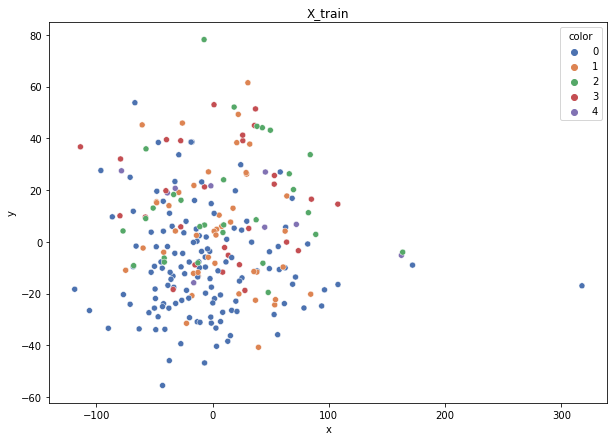

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 2: 0.1719341785442781, 1: 0.11332025404054694, 3: 0.17807468492085946, 4: 0.4986091177784065}


100%|██████████| 61/61 [00:00<00:00, 3224.72it/s]


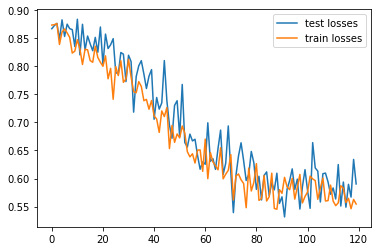

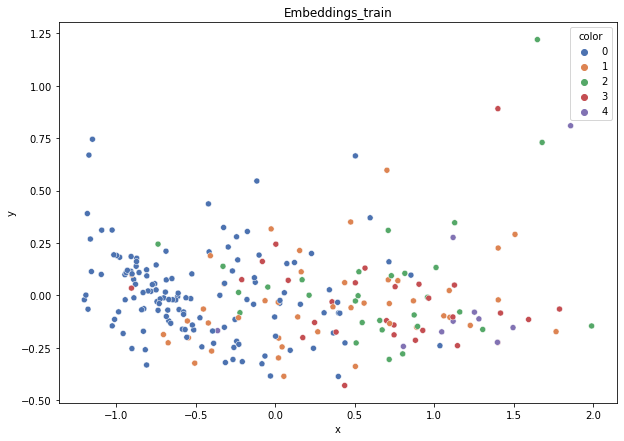

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.289
DT-f1-old+new-features: 0.295
DT-f1-old-features: 0.266
DT-gmean-new-features: 0.09
DT-gmean-old+new-features: 0.105
DT-gmean-old-features: 0.098
KNN-f1-new-features: 0.205
KNN-f1-old+new-features: 0.313
KNN-f1-old-features: 0.275
KNN-gmean-new-features: 0.026
KNN-gmean-old+new-features: 0.102
KNN-gmean-old-features: 0.089
LDA-f1-new-features: 0.472
LDA-f1-old+new-features: 0.484
LDA-f1-old-features: 0.365
LDA-gmean-new-features: 0.151
LDA-gmean-old+new-features: 0.149
LDA-gmean-old-features: 0.111
QDA-f1-new-features: 0.403
QDA-f1-old+new-features: 0.211
QDA-f1-old-features: 0.392
QDA-gmean-new-features: 0.135
QDA-gmean-old+new-features: 0.012
QDA-gmean-old-features: 0.132
RF24-f1-new-features: 0.291
RF24-f1-old+new-features: 0.268
RF24-f1-old-features: 0.316
RF24-gmean-new-features: 0.037
RF24-gmean-old+new-features: 0.032
RF24-gmean-old-features: 0.092


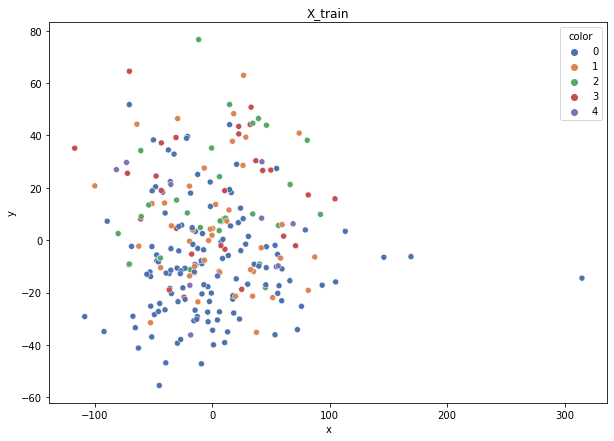

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 2: 0.1719341785442781, 1: 0.11332025404054694, 3: 0.17807468492085946, 4: 0.4986091177784065}


100%|██████████| 61/61 [00:00<00:00, 2564.42it/s]


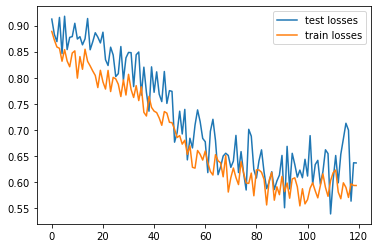

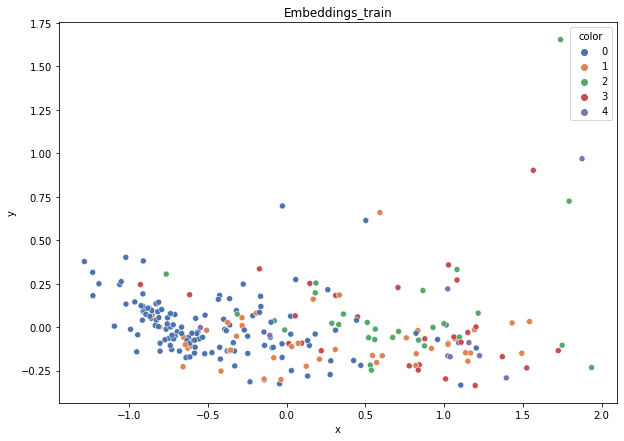

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.271
DT-f1-old+new-features: 0.288
DT-f1-old-features: 0.281
DT-gmean-new-features: 0.092
DT-gmean-old+new-features: 0.097
DT-gmean-old-features: 0.101
KNN-f1-new-features: 0.407
KNN-f1-old+new-features: 0.426
KNN-f1-old-features: 0.356
KNN-gmean-new-features: 0.363
KNN-gmean-old+new-features: 0.39
KNN-gmean-old-features: 0.122
LDA-f1-new-features: 0.453
LDA-f1-old+new-features: 0.425
LDA-f1-old-features: 0.355
LDA-gmean-new-features: 0.37
LDA-gmean-old+new-features: 0.37
LDA-gmean-old-features: 0.108
QDA-f1-new-features: 0.259
QDA-f1-old+new-features: 0.191
QDA-f1-old-features: 0.39
QDA-gmean-new-features: 0.036
QDA-gmean-old+new-features: 0.011
QDA-gmean-old-features: 0.136
RF24-f1-new-features: 0.595
RF24-f1-old+new-features: 0.45
RF24-f1-old-features: 0.307
RF24-gmean-new-features: 0.554
RF24-gmean-old+new-features: 0.363
RF24-gmean-old-features: 0.093


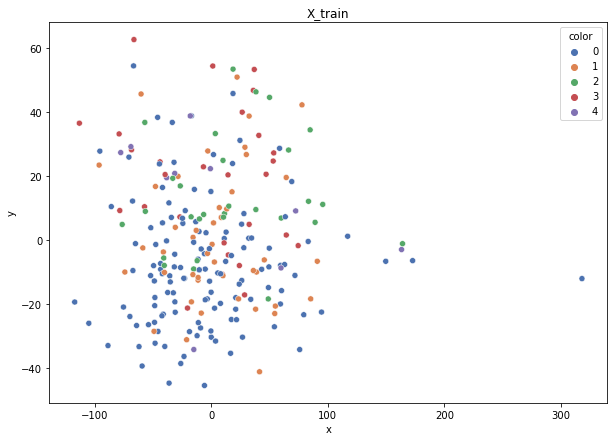

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 3: 0.17807468492085946, 1: 0.11332025404054694, 2: 0.1719341785442781, 4: 0.4986091177784065}


100%|██████████| 61/61 [00:00<00:00, 3110.52it/s]


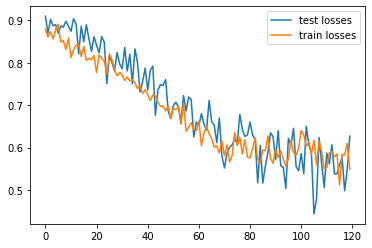

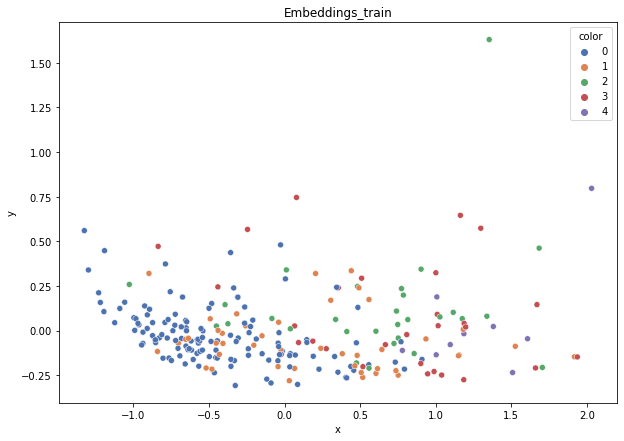

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.245
DT-f1-old+new-features: 0.315
DT-f1-old-features: 0.368
DT-gmean-new-features: 0.09
DT-gmean-old+new-features: 0.107
DT-gmean-old-features: 0.128
KNN-f1-new-features: 0.26
KNN-f1-old+new-features: 0.328
KNN-f1-old-features: 0.325
KNN-gmean-new-features: 0.083
KNN-gmean-old+new-features: 0.115
KNN-gmean-old-features: 0.109
LDA-f1-new-features: 0.403
LDA-f1-old+new-features: 0.238
LDA-f1-old-features: 0.261
LDA-gmean-new-features: 0.322
LDA-gmean-old+new-features: 0.069
LDA-gmean-old-features: 0.034
QDA-f1-new-features: 0.364
QDA-f1-old+new-features: 0.239
QDA-f1-old-features: 0.345
QDA-gmean-new-features: 0.123
QDA-gmean-old+new-features: 0.013
QDA-gmean-old-features: 0.12
RF24-f1-new-features: 0.361
RF24-f1-old+new-features: 0.336
RF24-f1-old-features: 0.315
RF24-gmean-new-features: 0.279
RF24-gmean-old+new-features: 0.257
RF24-gmean-old-features: 0.1


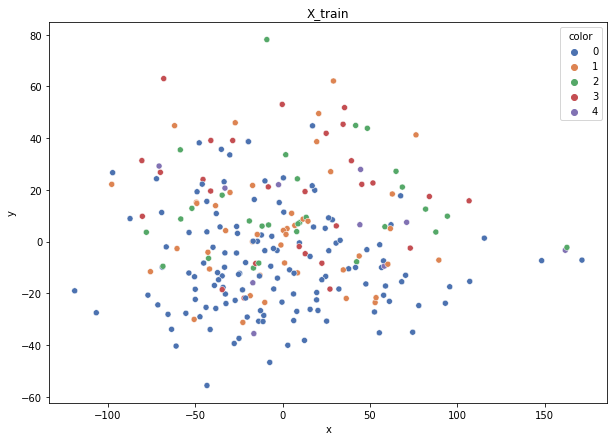

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 11})
Weights: {0: 0.03986894846317969, 2: 0.18009766374746689, 1: 0.11870073292446681, 3: 0.18652972316701927, 4: 0.47480293169786725}


100%|██████████| 60/60 [00:00<00:00, 3129.34it/s]


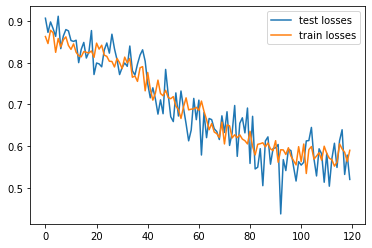

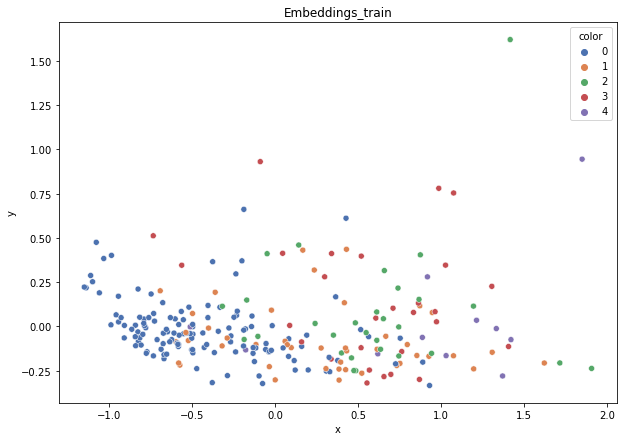

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.298
DT-f1-old+new-features: 0.293
DT-f1-old-features: 0.305
DT-gmean-new-features: 0.097
DT-gmean-old+new-features: 0.097
DT-gmean-old-features: 0.112
KNN-f1-new-features: 0.182
KNN-f1-old+new-features: 0.231
KNN-f1-old-features: 0.254
KNN-gmean-new-features: 0.011
KNN-gmean-old+new-features: 0.033
KNN-gmean-old-features: 0.036
LDA-f1-new-features: 0.264
LDA-f1-old+new-features: 0.27
LDA-f1-old-features: 0.287
LDA-gmean-new-features: 0.034
LDA-gmean-old+new-features: 0.08
LDA-gmean-old-features: 0.086
QDA-f1-new-features: 0.242
QDA-f1-old+new-features: 0.174
QDA-f1-old-features: 0.254
QDA-gmean-new-features: 0.03
QDA-gmean-old+new-features: 0.01
QDA-gmean-old-features: 0.032
RF24-f1-new-features: 0.297
RF24-f1-old+new-features: 0.261
RF24-f1-old-features: 0.309
RF24-gmean-new-features: 0.091
RF24-gmean-old+new-features: 0.032
RF24-gmean-old-features: 0.098


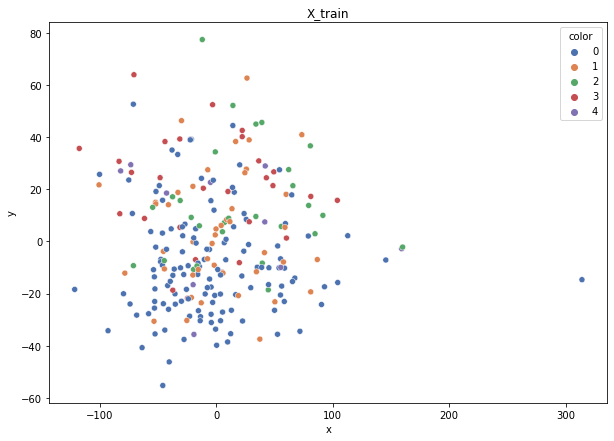

Class cardinalities: Counter({0: 132, 1: 44, 2: 28, 3: 28, 4: 11})
Weights: {2: 0.18539325842696627, 1: 0.11797752808988764, 0: 0.03932584269662921, 3: 0.18539325842696627, 4: 0.47191011235955055}


100%|██████████| 60/60 [00:00<00:00, 3107.20it/s]


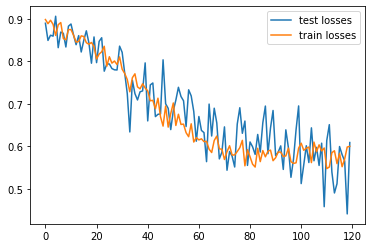

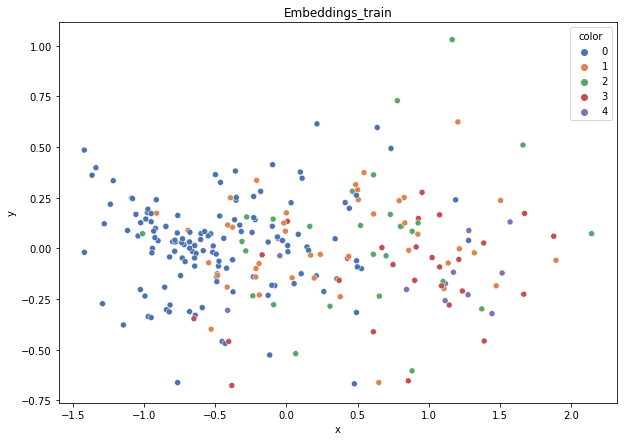

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.25
DT-f1-old+new-features: 0.253
DT-f1-old-features: 0.227
DT-gmean-new-features: 0.09
DT-gmean-old+new-features: 0.08
DT-gmean-old-features: 0.03
KNN-f1-new-features: 0.333
KNN-f1-old+new-features: 0.302
KNN-f1-old-features: 0.275
KNN-gmean-new-features: 0.106
KNN-gmean-old+new-features: 0.04
KNN-gmean-old-features: 0.035
LDA-f1-new-features: 0.31
LDA-f1-old+new-features: 0.382
LDA-f1-old-features: 0.415
LDA-gmean-new-features: 0.096
LDA-gmean-old+new-features: 0.122
LDA-gmean-old-features: 0.363
QDA-f1-new-features: 0.304
QDA-f1-old+new-features: 0.19
QDA-f1-old-features: 0.268
QDA-gmean-new-features: 0.093
QDA-gmean-old+new-features: 0.011
QDA-gmean-old-features: 0.037
RF24-f1-new-features: 0.351
RF24-f1-old+new-features: 0.341
RF24-f1-old-features: 0.497
RF24-gmean-new-features: 0.105
RF24-gmean-old+new-features: 0.106
RF24-gmean-old-features: 0.452
cleveland_v2


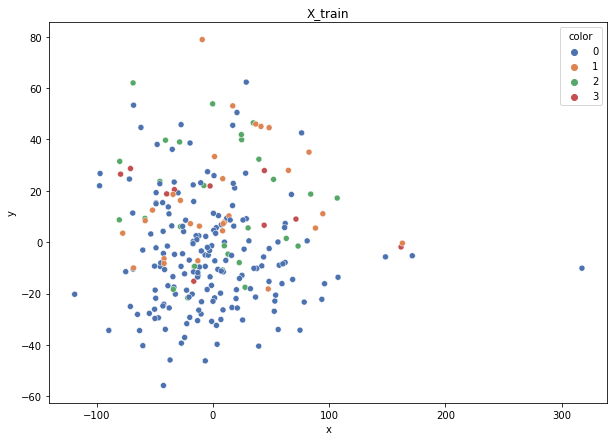

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


100%|██████████| 61/61 [00:00<00:00, 3263.30it/s]


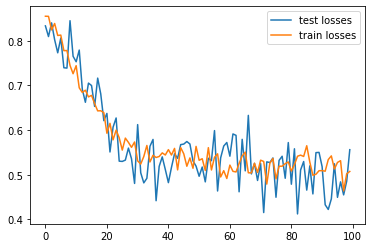

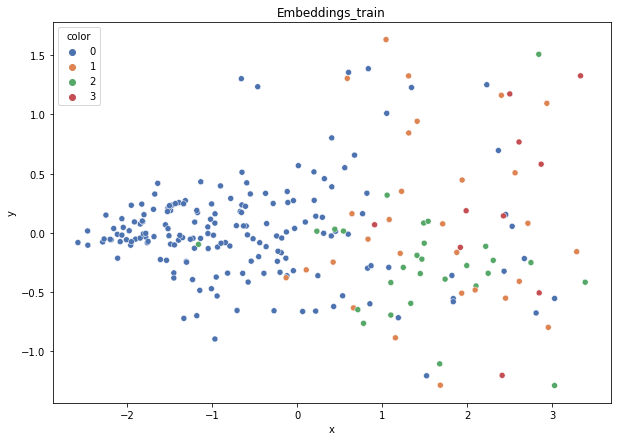

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.374
DT-f1-old+new-features: 0.465
DT-f1-old-features: 0.358
DT-gmean-new-features: 0.325
DT-gmean-old+new-features: 0.13
DT-gmean-old-features: 0.099
KNN-f1-new-features: 0.362
KNN-f1-old+new-features: 0.24
KNN-f1-old-features: 0.238
KNN-gmean-new-features: 0.086
KNN-gmean-old+new-features: 0.018
KNN-gmean-old-features: 0.018
LDA-f1-new-features: 0.487
LDA-f1-old+new-features: 0.526
LDA-f1-old-features: 0.376
LDA-gmean-new-features: 0.394
LDA-gmean-old+new-features: 0.469
LDA-gmean-old-features: 0.028
QDA-f1-new-features: 0.416
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.394
QDA-gmean-new-features: 0.11
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.093
RF24-f1-new-features: 0.463
RF24-f1-old+new-features: 0.469
RF24-f1-old-features: 0.459
RF24-gmean-new-features: 0.43
RF24-gmean-old+new-features: 0.433
RF24-gmean-old-features: 0.121


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


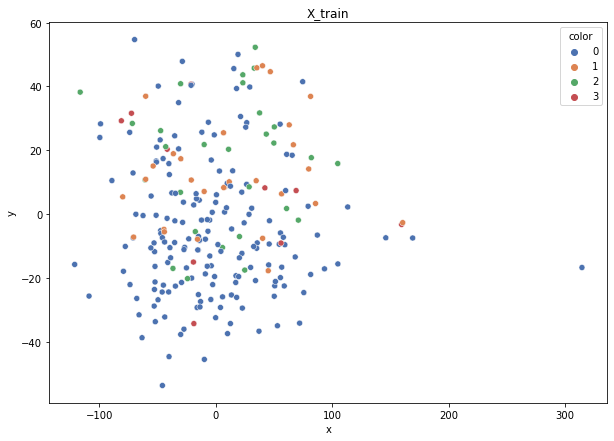

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


100%|██████████| 61/61 [00:00<00:00, 3164.34it/s]


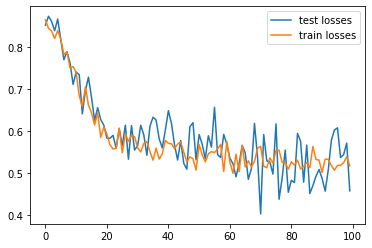

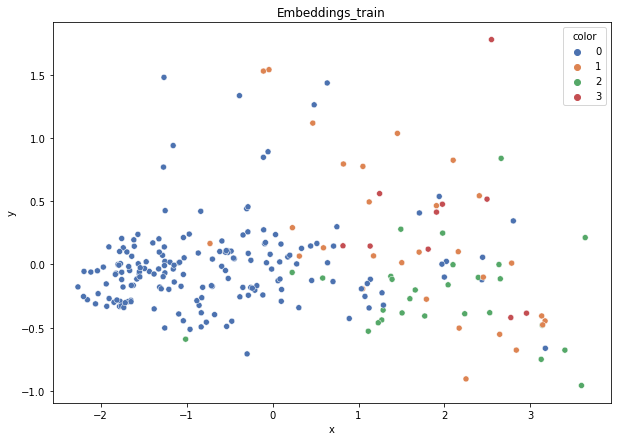

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.393
DT-f1-old+new-features: 0.403
DT-f1-old-features: 0.484
DT-gmean-new-features: 0.111
DT-gmean-old+new-features: 0.112
DT-gmean-old-features: 0.546
KNN-f1-new-features: 0.283
KNN-f1-old+new-features: 0.417
KNN-f1-old-features: 0.39
KNN-gmean-new-features: 0.065
KNN-gmean-old+new-features: 0.118
KNN-gmean-old-features: 0.11
LDA-f1-new-features: 0.367
LDA-f1-old+new-features: 0.292
LDA-f1-old-features: 0.344
LDA-gmean-new-features: 0.1
LDA-gmean-old+new-features: 0.075
LDA-gmean-old-features: 0.085
QDA-f1-new-features: 0.341
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.399
QDA-gmean-new-features: 0.085
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.11
RF24-f1-new-features: 0.34
RF24-f1-old+new-features: 0.361
RF24-f1-old-features: 0.346
RF24-gmean-new-features: 0.084
RF24-gmean-old+new-features: 0.099
RF24-gmean-old-features: 0.085


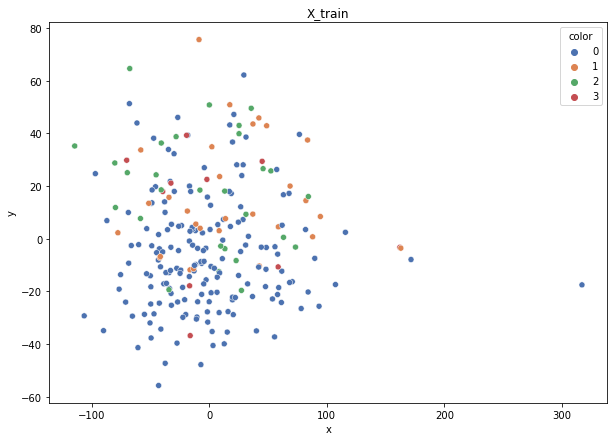

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


100%|██████████| 61/61 [00:00<00:00, 3155.79it/s]


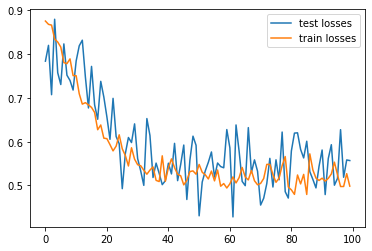

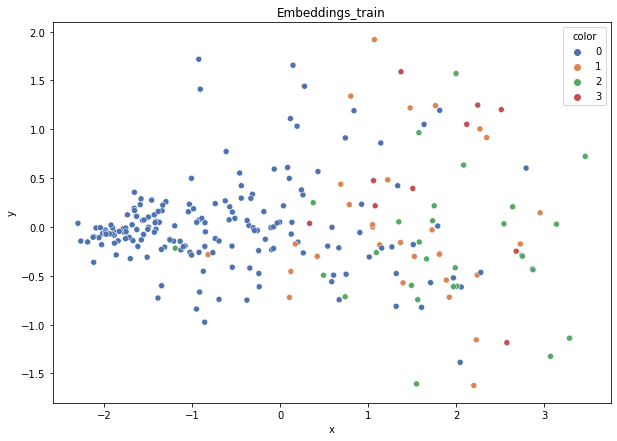

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.37
DT-f1-old+new-features: 0.328
DT-f1-old-features: 0.295
DT-gmean-new-features: 0.086
DT-gmean-old+new-features: 0.025
DT-gmean-old-features: 0.075
KNN-f1-new-features: 0.265
KNN-f1-old+new-features: 0.315
KNN-f1-old-features: 0.356
KNN-gmean-new-features: 0.019
KNN-gmean-old+new-features: 0.066
KNN-gmean-old-features: 0.079
LDA-f1-new-features: 0.306
LDA-f1-old+new-features: 0.267
LDA-f1-old-features: 0.377
LDA-gmean-new-features: 0.023
LDA-gmean-old+new-features: 0.019
LDA-gmean-old-features: 0.098
QDA-f1-new-features: 0.305
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.351
QDA-gmean-new-features: 0.023
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.079
RF24-f1-new-features: 0.322
RF24-f1-old+new-features: 0.297
RF24-f1-old-features: 0.257
RF24-gmean-new-features: 0.025
RF24-gmean-old+new-features: 0.023
RF24-gmean-old-features: 0.019


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


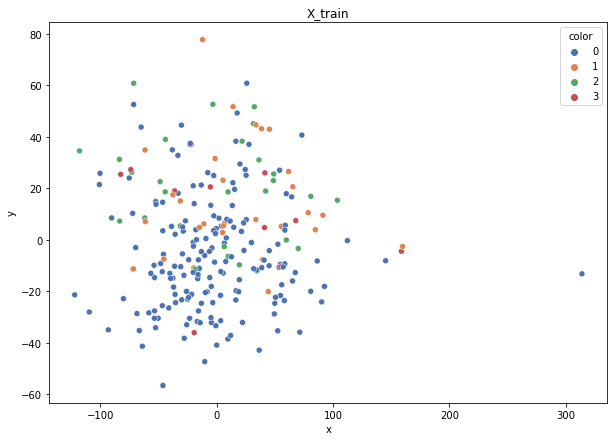

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 11})
Weights: {1: 0.20670586024536255, 0: 0.03425411398351722, 2: 0.21408821239698264, 3: 0.5449518133741377}


100%|██████████| 60/60 [00:00<00:00, 3224.40it/s]


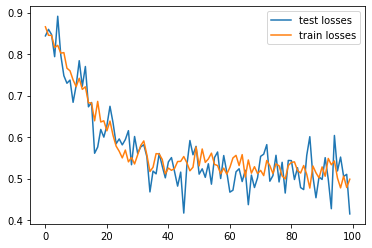

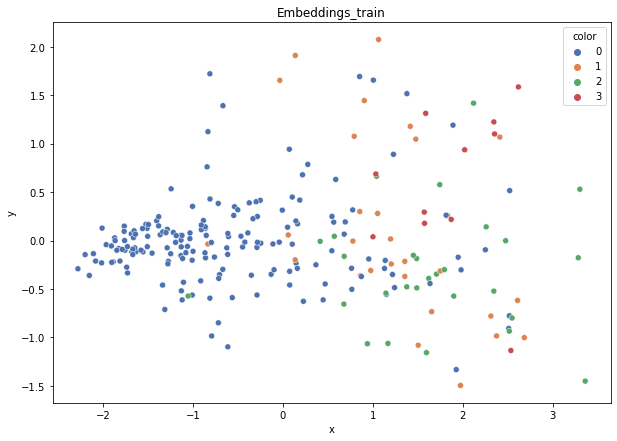

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.285
DT-f1-old+new-features: 0.315
DT-f1-old-features: 0.238
DT-gmean-new-features: 0.065
DT-gmean-old+new-features: 0.077
DT-gmean-old-features: 0.018
KNN-f1-new-features: 0.323
KNN-f1-old+new-features: 0.304
KNN-f1-old-features: 0.283
KNN-gmean-new-features: 0.077
KNN-gmean-old+new-features: 0.023
KNN-gmean-old-features: 0.022
LDA-f1-new-features: 0.306
LDA-f1-old+new-features: 0.352
LDA-f1-old-features: 0.301
LDA-gmean-new-features: 0.066
LDA-gmean-old+new-features: 0.079
LDA-gmean-old-features: 0.023
QDA-f1-new-features: 0.406
QDA-f1-old+new-features: 0.212
QDA-f1-old-features: 0.413
QDA-gmean-new-features: 0.095
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.095
RF24-f1-new-features: 0.294
RF24-f1-old+new-features: 0.338
RF24-f1-old-features: 0.428
RF24-gmean-new-features: 0.023
RF24-gmean-old+new-features: 0.078
RF24-gmean-old-features: 0.104


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


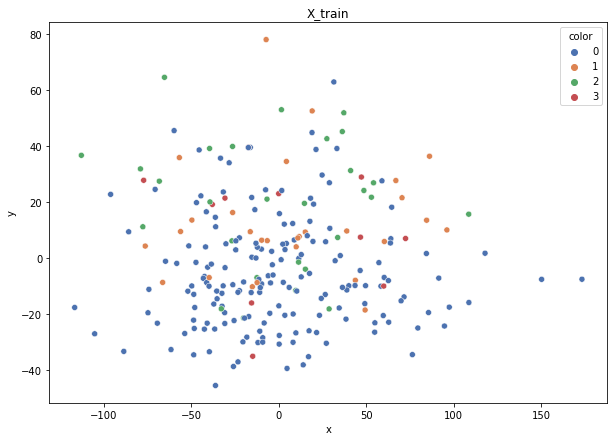

Class cardinalities: Counter({0: 176, 1: 28, 2: 28, 3: 11})
Weights: {0: 0.03381642512077295, 1: 0.21256038647342995, 2: 0.21256038647342995, 3: 0.5410628019323672}


100%|██████████| 60/60 [00:00<00:00, 3047.04it/s]


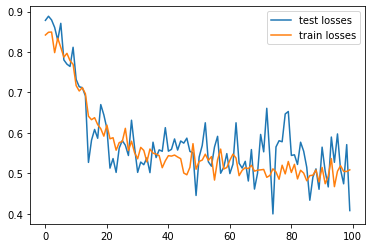

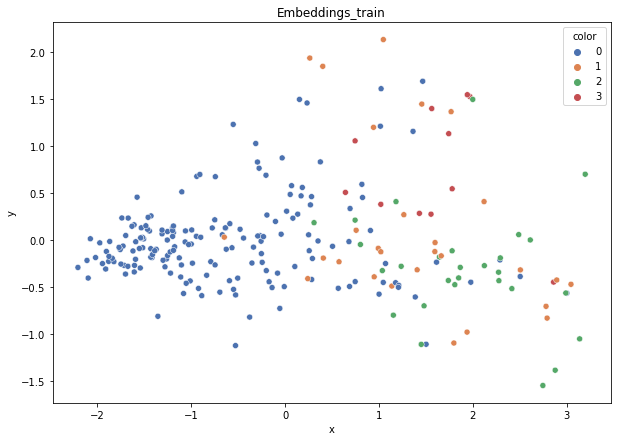

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.432
DT-f1-old+new-features: 0.377
DT-f1-old-features: 0.335
DT-gmean-new-features: 0.457
DT-gmean-old+new-features: 0.119
DT-gmean-old-features: 0.092
KNN-f1-new-features: 0.324
KNN-f1-old+new-features: 0.326
KNN-f1-old-features: 0.37
KNN-gmean-new-features: 0.086
KNN-gmean-old+new-features: 0.086
KNN-gmean-old-features: 0.096
LDA-f1-new-features: 0.343
LDA-f1-old+new-features: 0.423
LDA-f1-old-features: 0.467
LDA-gmean-new-features: 0.101
LDA-gmean-old+new-features: 0.387
LDA-gmean-old-features: 0.463
QDA-f1-new-features: 0.262
QDA-f1-old+new-features: 0.209
QDA-f1-old-features: 0.301
QDA-gmean-new-features: 0.021
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.074
RF24-f1-new-features: 0.408
RF24-f1-old+new-features: 0.347
RF24-f1-old-features: 0.29
RF24-gmean-new-features: 0.387
RF24-gmean-old+new-features: 0.294
RF24-gmean-old-features: 0.022
glass


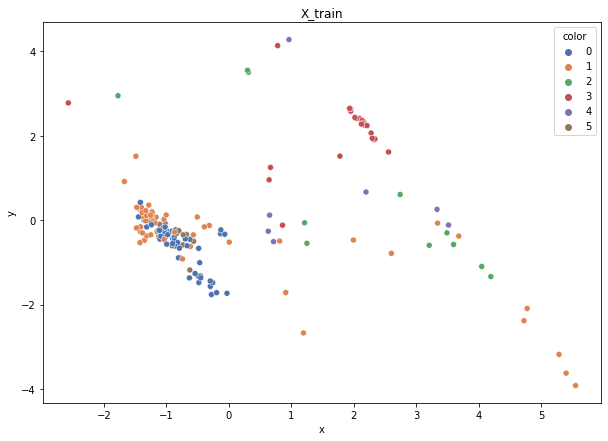

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 13, 2: 11, 4: 7})
Weights: {0: 0.04597401674853029, 1: 0.042205654719962245, 3: 0.1119367364312042, 5: 0.1980419183013613, 2: 0.2340495398106997, 4: 0.36779213398824234}


100%|██████████| 43/43 [00:00<00:00, 3132.03it/s]


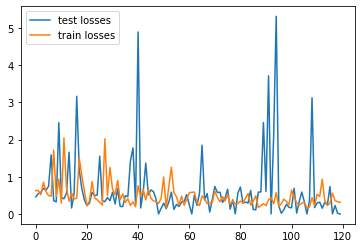

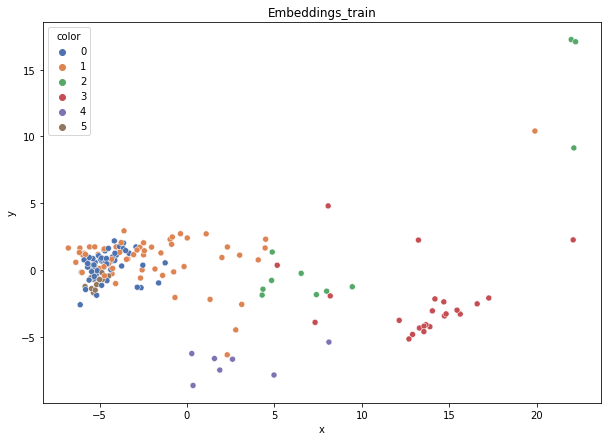

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.516
DT-f1-old+new-features: 0.586
DT-f1-old-features: 0.711
DT-gmean-new-features: 0.195
DT-gmean-old+new-features: 0.529
DT-gmean-old-features: 0.742
KNN-f1-new-features: 0.585
KNN-f1-old+new-features: 0.764
KNN-f1-old-features: 0.747
KNN-gmean-new-features: 0.225
KNN-gmean-old+new-features: 0.713
KNN-gmean-old-features: 0.701
LDA-f1-new-features: 0.572
LDA-f1-old+new-features: 0.44
LDA-f1-old-features: 0.551
LDA-gmean-new-features: 0.211
LDA-gmean-old+new-features: 0.073
LDA-gmean-old-features: 0.088
QDA-f1-new-features: 0.441
QDA-f1-old+new-features: 0.359
QDA-f1-old-features: 0.388
QDA-gmean-new-features: 0.07
QDA-gmean-old+new-features: 0.027
QDA-gmean-old-features: 0.065
RF24-f1-new-features: 0.558
RF24-f1-old+new-features: 0.705
RF24-f1-old-features: 0.786
RF24-gmean-new-features: 0.201
RF24-gmean-old+new-features: 0.635
RF24-gmean-old-features: 0.742


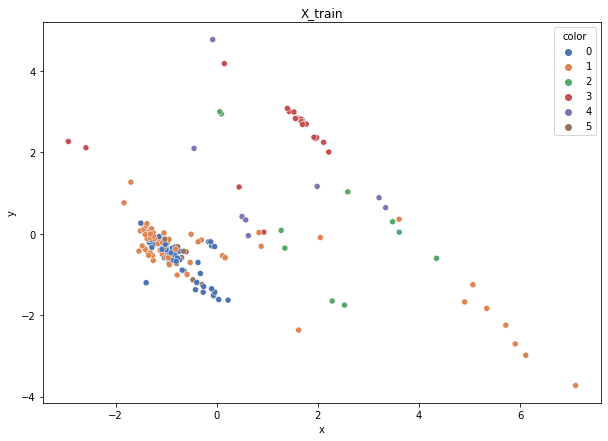

Class cardinalities: Counter({1: 60, 0: 56, 3: 24, 5: 13, 2: 10, 4: 8})
Weights: {5: 0.2034390893678857, 4: 0.33058852022281426, 1: 0.0440784693630419, 0: 0.047226931460402036, 3: 0.11019617340760475, 2: 0.2644708161782514}


100%|██████████| 43/43 [00:00<00:00, 3071.44it/s]


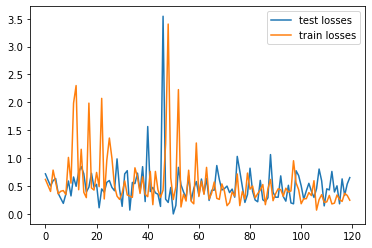

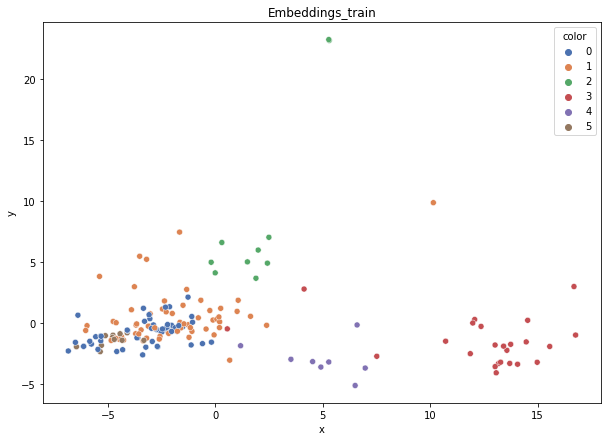

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.57
DT-f1-old+new-features: 0.45
DT-f1-old-features: 0.53
DT-gmean-new-features: 0.251
DT-gmean-old+new-features: 0.196
DT-gmean-old-features: 0.232
KNN-f1-new-features: 0.642
KNN-f1-old+new-features: 0.488
KNN-f1-old-features: 0.568
KNN-gmean-new-features: 0.56
KNN-gmean-old+new-features: 0.181
KNN-gmean-old-features: 0.557
LDA-f1-new-features: 0.588
LDA-f1-old+new-features: 0.581
LDA-f1-old-features: 0.425
LDA-gmean-new-features: 0.566
LDA-gmean-old+new-features: 0.566
LDA-gmean-old-features: 0.072
QDA-f1-new-features: 0.333
QDA-f1-old+new-features: 0.283
QDA-f1-old-features: 0.369
QDA-gmean-new-features: 0.027
QDA-gmean-old+new-features: 0.024
QDA-gmean-old-features: 0.06
RF24-f1-new-features: 0.572
RF24-f1-old+new-features: 0.576
RF24-f1-old-features: 0.652
RF24-gmean-new-features: 0.553
RF24-gmean-old+new-features: 0.564
RF24-gmean-old-features: 0.279


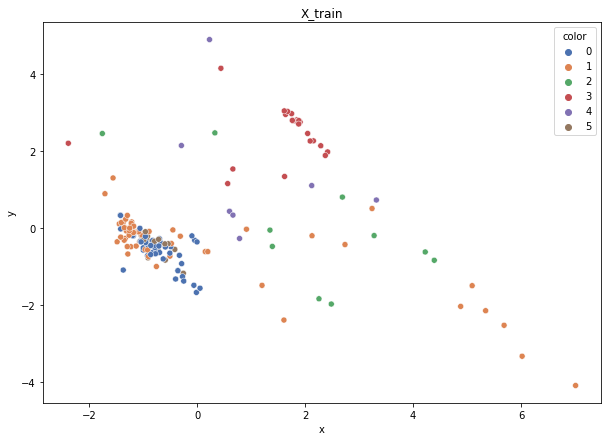

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 10, 4: 7})
Weights: {0: 0.04555224384573926, 5: 0.18220897538295705, 4: 0.3644179507659141, 1: 0.04181845336658031, 3: 0.11090981110266952, 2: 0.2550925655361399}


100%|██████████| 43/43 [00:00<00:00, 3074.85it/s]


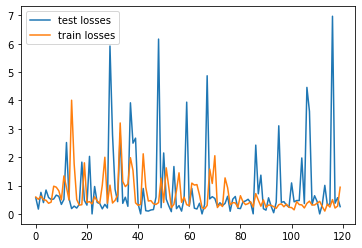

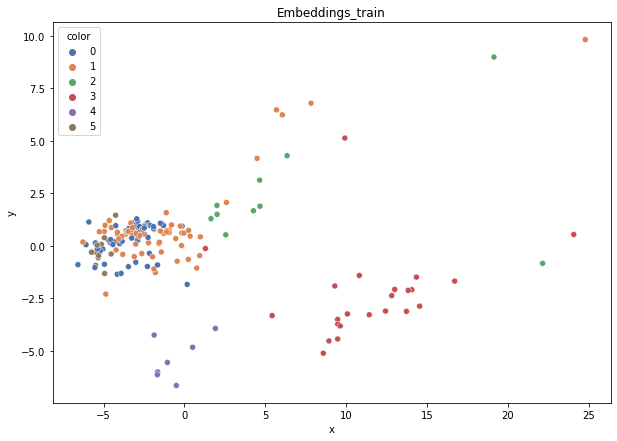

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.572
DT-f1-old+new-features: 0.637
DT-f1-old-features: 0.607
DT-gmean-new-features: 0.55
DT-gmean-old+new-features: 0.602
DT-gmean-old-features: 0.25
KNN-f1-new-features: 0.627
KNN-f1-old+new-features: 0.639
KNN-f1-old-features: 0.661
KNN-gmean-new-features: 0.236
KNN-gmean-old+new-features: 0.242
KNN-gmean-old-features: 0.246
LDA-f1-new-features: 0.718
LDA-f1-old+new-features: 0.71
LDA-f1-old-features: 0.575
LDA-gmean-new-features: 0.644
LDA-gmean-old+new-features: 0.664
LDA-gmean-old-features: 0.233
QDA-f1-new-features: 0.308
QDA-f1-old+new-features: 0.335
QDA-f1-old-features: 0.587
QDA-gmean-new-features: 0.025
QDA-gmean-old+new-features: 0.026
QDA-gmean-old-features: 0.526
RF24-f1-new-features: 0.664
RF24-f1-old+new-features: 0.677
RF24-f1-old-features: 0.731
RF24-gmean-new-features: 0.256
RF24-gmean-old+new-features: 0.253
RF24-gmean-old-features: 0.281


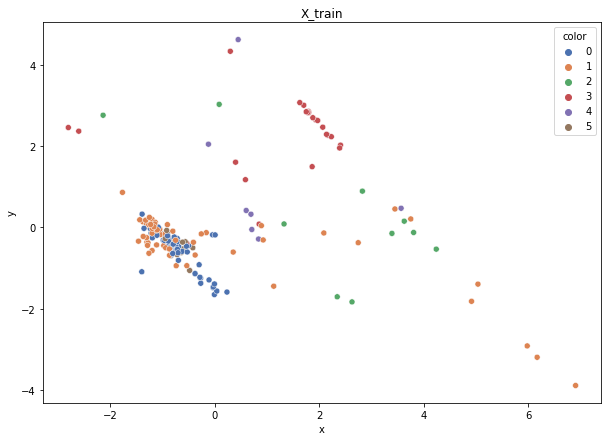

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 10, 4: 7})
Weights: {0: 0.04555224384573926, 5: 0.18220897538295705, 4: 0.3644179507659141, 1: 0.04181845336658031, 3: 0.11090981110266952, 2: 0.2550925655361399}


100%|██████████| 43/43 [00:00<00:00, 3120.65it/s]


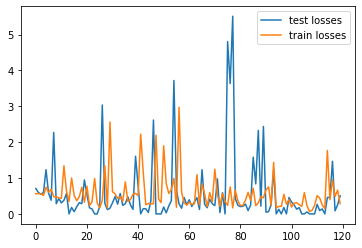

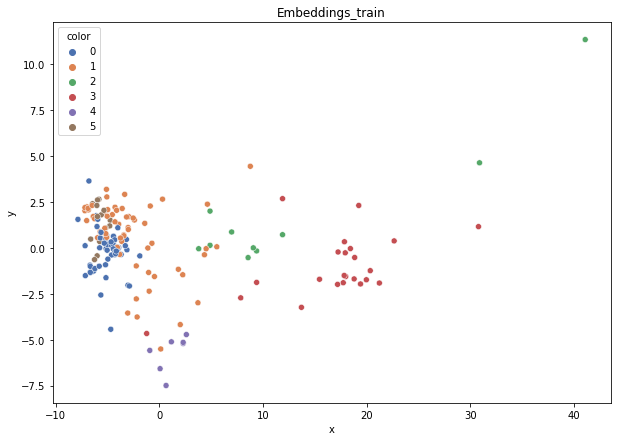

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.518
DT-f1-old+new-features: 0.546
DT-f1-old-features: 0.646
DT-gmean-new-features: 0.216
DT-gmean-old+new-features: 0.223
DT-gmean-old-features: 0.681
KNN-f1-new-features: 0.421
KNN-f1-old+new-features: 0.476
KNN-f1-old-features: 0.641
KNN-gmean-new-features: 0.072
KNN-gmean-old+new-features: 0.082
KNN-gmean-old-features: 0.587
LDA-f1-new-features: 0.67
LDA-f1-old+new-features: 0.719
LDA-f1-old-features: 0.517
LDA-gmean-new-features: 0.261
LDA-gmean-old+new-features: 0.676
LDA-gmean-old-features: 0.196
QDA-f1-new-features: 0.453
QDA-f1-old+new-features: 0.348
QDA-f1-old-features: 0.571
QDA-gmean-new-features: 0.076
QDA-gmean-old+new-features: 0.026
QDA-gmean-old-features: 0.219
RF24-f1-new-features: 0.54
RF24-f1-old+new-features: 0.57
RF24-f1-old-features: 0.776
RF24-gmean-new-features: 0.219
RF24-gmean-old+new-features: 0.228
RF24-gmean-old-features: 0.748


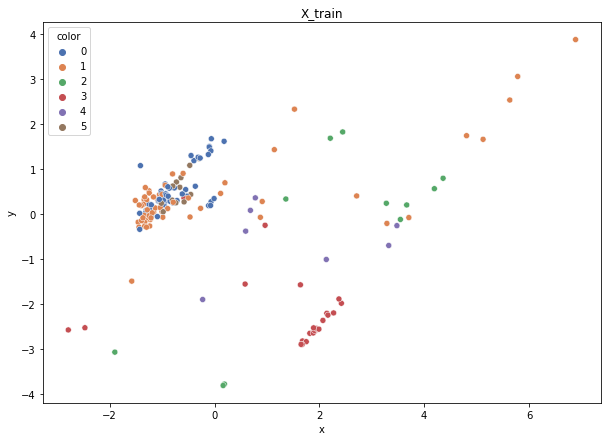

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 11, 4: 7})
Weights: {0: 0.04663368999308034, 5: 0.18653475997232136, 4: 0.3730695199446427, 1: 0.04281125638709015, 3: 0.11354289737445648, 2: 0.237407876328409}


100%|██████████| 42/42 [00:00<00:00, 2380.20it/s]


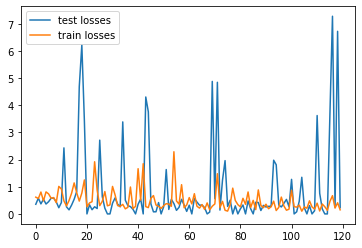

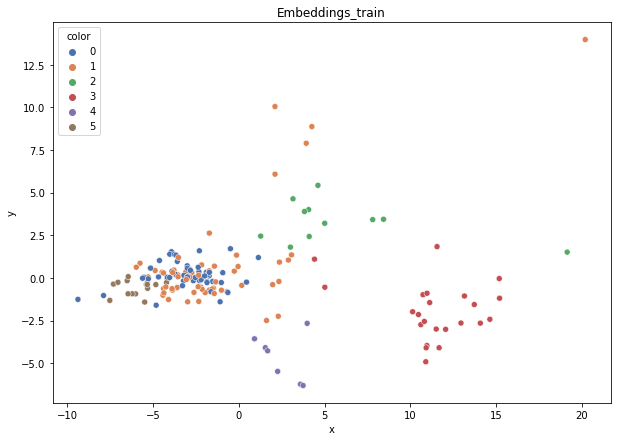

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.589
DT-f1-old+new-features: 0.599
DT-f1-old-features: 0.73
DT-gmean-new-features: 0.248
DT-gmean-old+new-features: 0.251
DT-gmean-old-features: 0.737
KNN-f1-new-features: 0.78
KNN-f1-old+new-features: 0.827
KNN-f1-old-features: 0.678
KNN-gmean-new-features: 0.8
KNN-gmean-old+new-features: 0.85
KNN-gmean-old-features: 0.681
LDA-f1-new-features: 0.724
LDA-f1-old+new-features: 0.784
LDA-f1-old-features: 0.55
LDA-gmean-new-features: 0.677
LDA-gmean-old+new-features: 0.755
LDA-gmean-old-features: 0.222
QDA-f1-new-features: 0.356
QDA-f1-old+new-features: 0.361
QDA-f1-old-features: 0.553
QDA-gmean-new-features: 0.027
QDA-gmean-old+new-features: 0.027
QDA-gmean-old-features: 0.217
RF24-f1-new-features: 0.746
RF24-f1-old+new-features: 0.828
RF24-f1-old-features: 0.857
RF24-gmean-new-features: 0.735
RF24-gmean-old+new-features: 0.792
RF24-gmean-old-features: 0.865
new_ecoli


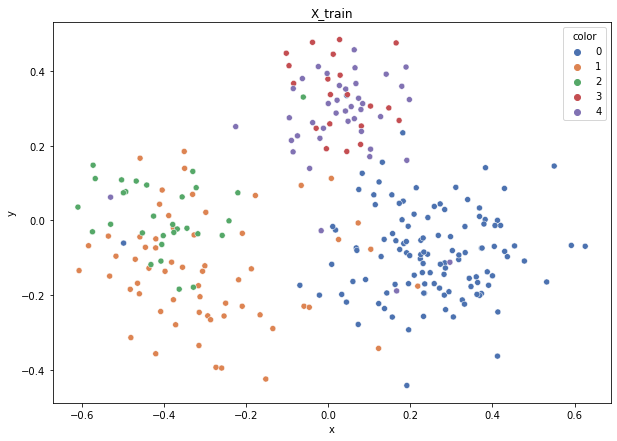

Class cardinalities: Counter({0: 116, 1: 61, 4: 41, 2: 30, 3: 20})
Weights: {0: 0.0649452946471851, 1: 0.1235025275257946, 2: 0.2511218059691157, 3: 0.37668270895367356, 4: 0.183747662904231}


100%|██████████| 68/68 [00:00<00:00, 3072.92it/s]


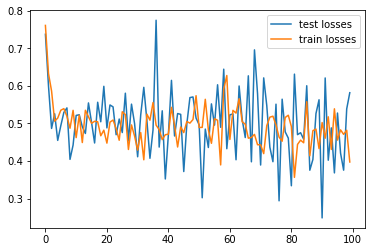

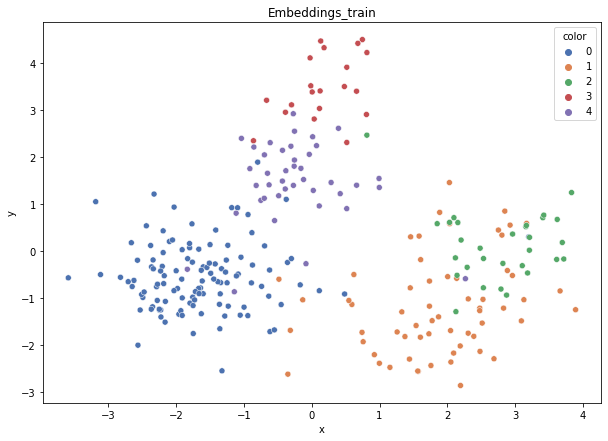

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.825
DT-f1-old+new-features: 0.701
DT-f1-old-features: 0.634
DT-gmean-new-features: 0.833
DT-gmean-old+new-features: 0.696
DT-gmean-old-features: 0.537
KNN-f1-new-features: 0.762
KNN-f1-old+new-features: 0.815
KNN-f1-old-features: 0.749
KNN-gmean-new-features: 0.79
KNN-gmean-old+new-features: 0.833
KNN-gmean-old-features: 0.719
LDA-f1-new-features: 0.781
LDA-f1-old+new-features: 0.822
LDA-f1-old-features: 0.809
LDA-gmean-new-features: 0.776
LDA-gmean-old+new-features: 0.808
LDA-gmean-old-features: 0.791
QDA-f1-new-features: 0.736
QDA-f1-old+new-features: 0.639
QDA-f1-old-features: 0.287
QDA-gmean-new-features: 0.711
QDA-gmean-old+new-features: 0.639
QDA-gmean-old-features: 0.042
RF24-f1-new-features: 0.792
RF24-f1-old+new-features: 0.831
RF24-f1-old-features: 0.769
RF24-gmean-new-features: 0.771
RF24-gmean-old+new-features: 0.818
RF24-gmean-old-features: 0.771


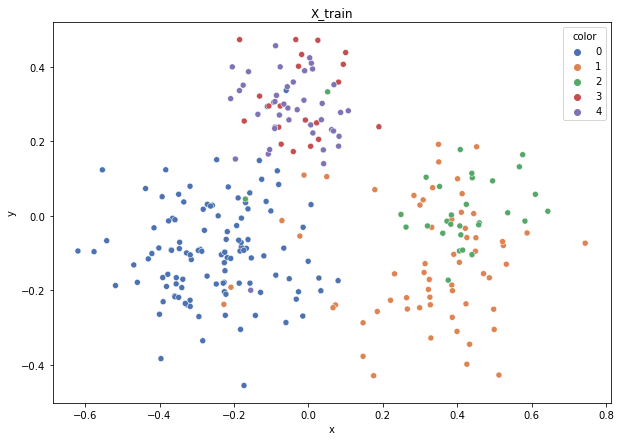

Class cardinalities: Counter({0: 116, 1: 61, 4: 42, 2: 30, 3: 20})
Weights: {0: 0.06523067522150933, 1: 0.12404521845401774, 2: 0.25222527752316937, 3: 0.3783379162847541, 4: 0.18016091251654956}


100%|██████████| 67/67 [00:00<00:00, 3151.10it/s]


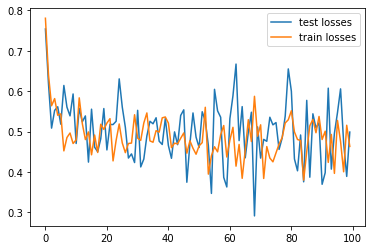

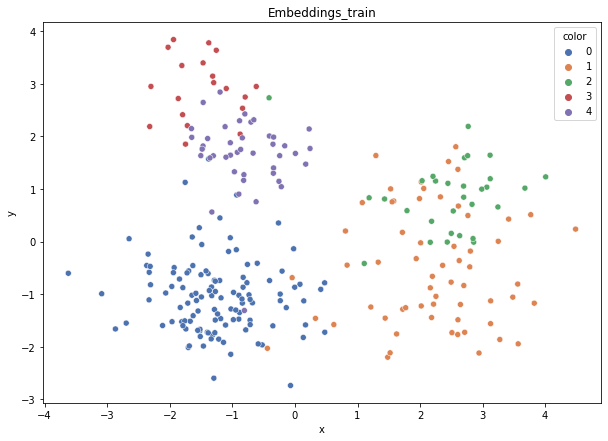

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.754
DT-f1-old+new-features: 0.79
DT-f1-old-features: 0.707
DT-gmean-new-features: 0.754
DT-gmean-old+new-features: 0.779
DT-gmean-old-features: 0.688
KNN-f1-new-features: 0.788
KNN-f1-old+new-features: 0.725
KNN-f1-old-features: 0.728
KNN-gmean-new-features: 0.775
KNN-gmean-old+new-features: 0.709
KNN-gmean-old-features: 0.709
LDA-f1-new-features: 0.853
LDA-f1-old+new-features: 0.859
LDA-f1-old-features: 0.853
LDA-gmean-new-features: 0.84
LDA-gmean-old+new-features: 0.84
LDA-gmean-old-features: 0.84
QDA-f1-new-features: 0.828
QDA-f1-old+new-features: 0.473
QDA-f1-old-features: 0.494
QDA-gmean-new-features: 0.809
QDA-gmean-old+new-features: 0.146
QDA-gmean-old-features: 0.344
RF24-f1-new-features: 0.804
RF24-f1-old+new-features: 0.836
RF24-f1-old-features: 0.841
RF24-gmean-new-features: 0.787
RF24-gmean-old+new-features: 0.829
RF24-gmean-old-features: 0.829


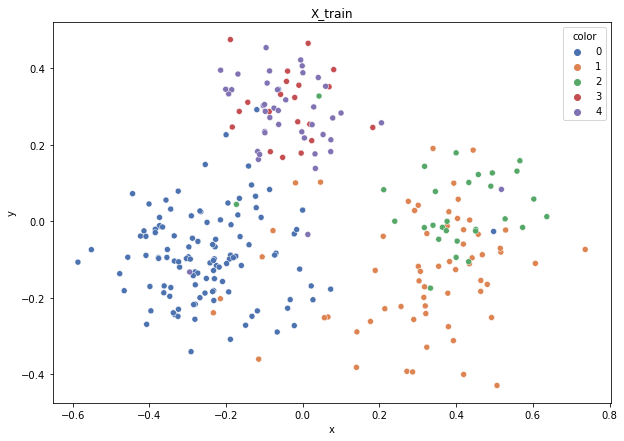

Class cardinalities: Counter({0: 116, 1: 62, 4: 42, 2: 29, 3: 20})
Weights: {0: 0.06479675120436358, 1: 0.12123263128558347, 2: 0.2591870048174543, 3: 0.37582115698530877, 4: 0.17896245570728986}


100%|██████████| 67/67 [00:00<00:00, 3316.44it/s]


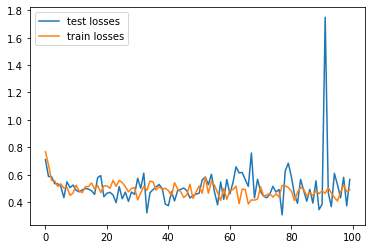

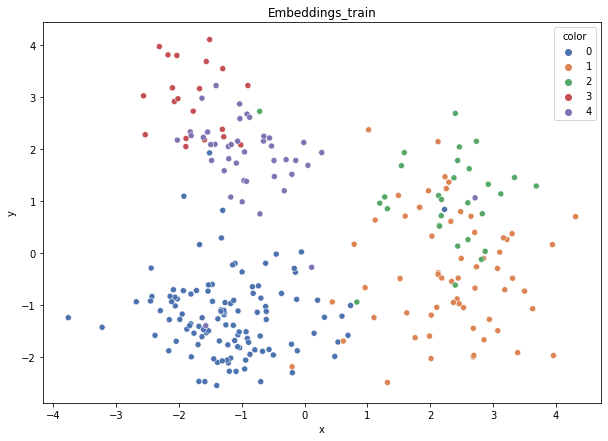

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.843
DT-f1-old+new-features: 0.795
DT-f1-old-features: 0.722
DT-gmean-new-features: 0.85
DT-gmean-old+new-features: 0.812
DT-gmean-old-features: 0.69
KNN-f1-new-features: 0.786
KNN-f1-old+new-features: 0.846
KNN-f1-old-features: 0.862
KNN-gmean-new-features: 0.727
KNN-gmean-old+new-features: 0.794
KNN-gmean-old-features: 0.815
LDA-f1-new-features: 0.883
LDA-f1-old+new-features: 0.906
LDA-f1-old-features: 0.872
LDA-gmean-new-features: 0.863
LDA-gmean-old+new-features: 0.905
LDA-gmean-old-features: 0.852
QDA-f1-new-features: 0.816
QDA-f1-old+new-features: 0.624
QDA-f1-old-features: 0.176
QDA-gmean-new-features: 0.791
QDA-gmean-old+new-features: 0.217
QDA-gmean-old-features: 0.011
RF24-f1-new-features: 0.922
RF24-f1-old+new-features: 0.92
RF24-f1-old-features: 0.879
RF24-gmean-new-features: 0.905
RF24-gmean-old+new-features: 0.891
RF24-gmean-old-features: 0.846


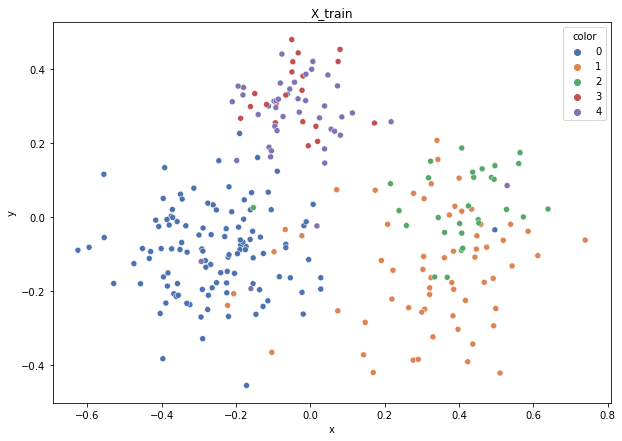

Class cardinalities: Counter({0: 116, 1: 62, 4: 42, 2: 29, 3: 20})
Weights: {0: 0.06479675120436358, 1: 0.12123263128558347, 2: 0.2591870048174543, 3: 0.37582115698530877, 4: 0.17896245570728986}


100%|██████████| 67/67 [00:00<00:00, 3217.67it/s]


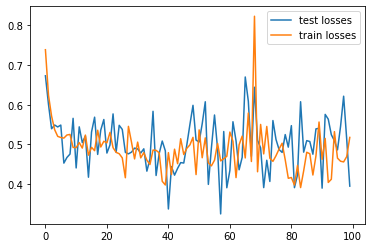

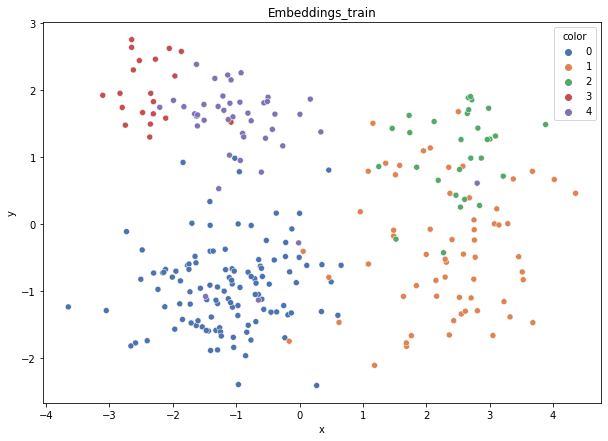

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.745
DT-f1-old+new-features: 0.761
DT-f1-old-features: 0.649
DT-gmean-new-features: 0.745
DT-gmean-old+new-features: 0.736
DT-gmean-old-features: 0.606
KNN-f1-new-features: 0.717
KNN-f1-old+new-features: 0.779
KNN-f1-old-features: 0.817
KNN-gmean-new-features: 0.595
KNN-gmean-old+new-features: 0.734
KNN-gmean-old-features: 0.782
LDA-f1-new-features: 0.816
LDA-f1-old+new-features: 0.776
LDA-f1-old-features: 0.74
LDA-gmean-new-features: 0.772
LDA-gmean-old+new-features: 0.739
LDA-gmean-old-features: 0.718
QDA-f1-new-features: 0.776
QDA-f1-old+new-features: 0.557
QDA-f1-old-features: 0.328
QDA-gmean-new-features: 0.769
QDA-gmean-old+new-features: 0.505
QDA-gmean-old-features: 0.235
RF24-f1-new-features: 0.742
RF24-f1-old+new-features: 0.751
RF24-f1-old-features: 0.753
RF24-gmean-new-features: 0.718
RF24-gmean-old+new-features: 0.723
RF24-gmean-old-features: 0.719


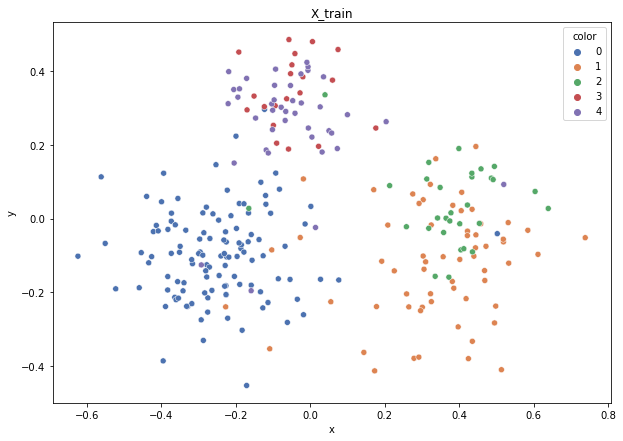

Class cardinalities: Counter({0: 116, 1: 62, 4: 41, 2: 30, 3: 20})
Weights: {0: 0.06507492234699798, 1: 0.12175308052018977, 2: 0.25162303307505884, 3: 0.3774345496125883, 4: 0.18411441444516502}


100%|██████████| 67/67 [00:00<00:00, 3285.07it/s]


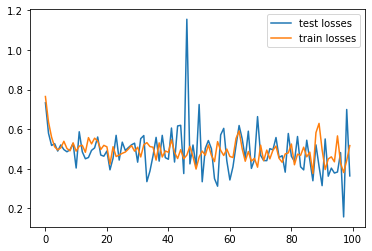

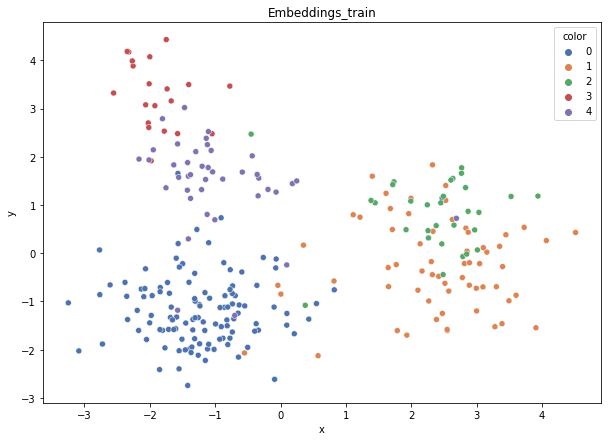

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.728
DT-f1-old+new-features: 0.801
DT-f1-old-features: 0.793
DT-gmean-new-features: 0.765
DT-gmean-old+new-features: 0.821
DT-gmean-old-features: 0.822
KNN-f1-new-features: 0.816
KNN-f1-old+new-features: 0.82
KNN-f1-old-features: 0.808
KNN-gmean-new-features: 0.816
KNN-gmean-old+new-features: 0.827
KNN-gmean-old-features: 0.84
LDA-f1-new-features: 0.848
LDA-f1-old+new-features: 0.806
LDA-f1-old-features: 0.86
LDA-gmean-new-features: 0.849
LDA-gmean-old+new-features: 0.819
LDA-gmean-old-features: 0.873
QDA-f1-new-features: 0.858
QDA-f1-old+new-features: 0.624
QDA-f1-old-features: 0.333
QDA-gmean-new-features: 0.825
QDA-gmean-old+new-features: 0.216
QDA-gmean-old-features: 0.299
RF24-f1-new-features: 0.862
RF24-f1-old+new-features: 0.871
RF24-f1-old-features: 0.887
RF24-gmean-new-features: 0.875
RF24-gmean-old+new-features: 0.881
RF24-gmean-old-features: 0.876
new_led7digit


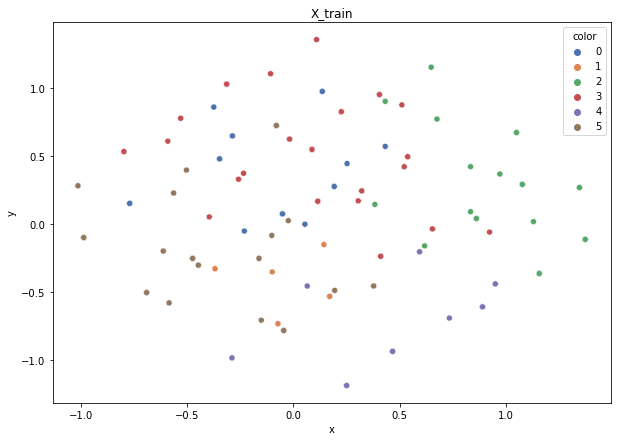

Class cardinalities: Counter({3: 87, 5: 79, 0: 78, 2: 75, 4: 41, 1: 40})
Weights: {0: 0.12859532399632337, 2: 0.1337391369561763, 3: 0.11529235944497956, 4: 0.24464476272471275, 5: 0.1269675350849775, 1: 0.25076088179283057}


100%|██████████| 100/100 [00:00<00:00, 3407.51it/s]


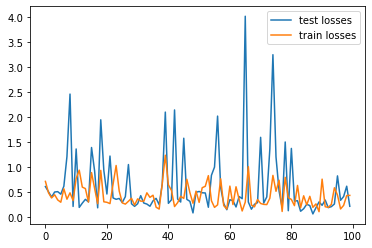

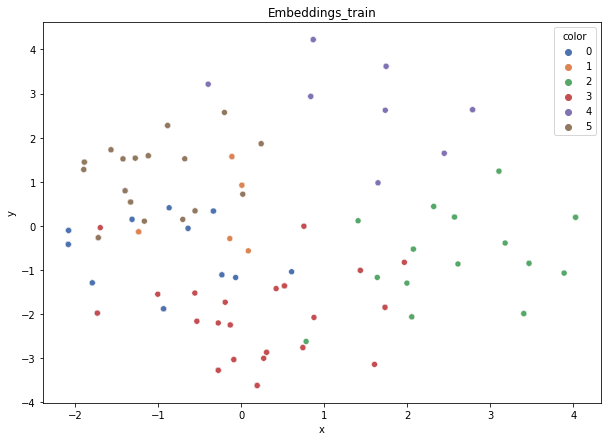

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.768
DT-f1-old+new-features: 0.76
DT-f1-old-features: 0.789
DT-gmean-new-features: 0.768
DT-gmean-old+new-features: 0.76
DT-gmean-old-features: 0.797
KNN-f1-new-features: 0.728
KNN-f1-old+new-features: 0.745
KNN-f1-old-features: 0.741
KNN-gmean-new-features: 0.715
KNN-gmean-old+new-features: 0.735
KNN-gmean-old-features: 0.719
LDA-f1-new-features: 0.781
LDA-f1-old+new-features: 0.766
LDA-f1-old-features: 0.804
LDA-gmean-new-features: 0.777
LDA-gmean-old+new-features: 0.762
LDA-gmean-old-features: 0.806
QDA-f1-new-features: 0.779
QDA-f1-old+new-features: 0.704
QDA-f1-old-features: 0.709
QDA-gmean-new-features: 0.764
QDA-gmean-old+new-features: 0.661
QDA-gmean-old-features: 0.689
RF24-f1-new-features: 0.753
RF24-f1-old+new-features: 0.776
RF24-f1-old-features: 0.796
RF24-gmean-new-features: 0.735
RF24-gmean-old+new-features: 0.777
RF24-gmean-old-features: 0.797


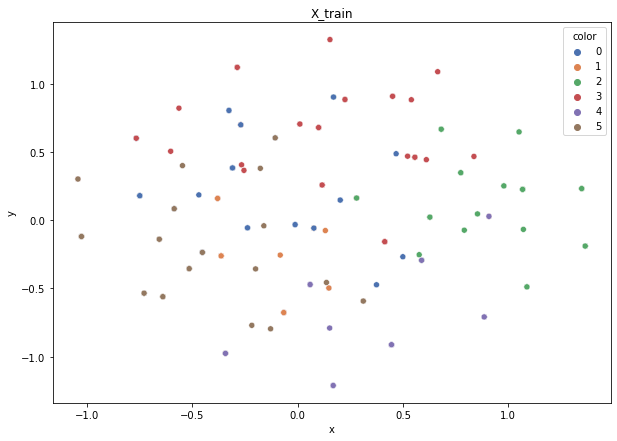

Class cardinalities: Counter({3: 87, 5: 80, 0: 78, 2: 75, 4: 41, 1: 39})
Weights: {0: 0.1279755802357915, 2: 0.13309460344522317, 3: 0.114736727107951, 4: 0.2434657380095546, 5: 0.12477619072989674, 1: 0.255951160471583}


100%|██████████| 100/100 [00:00<00:00, 3285.60it/s]


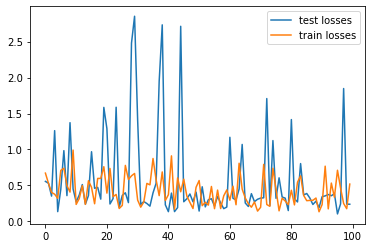

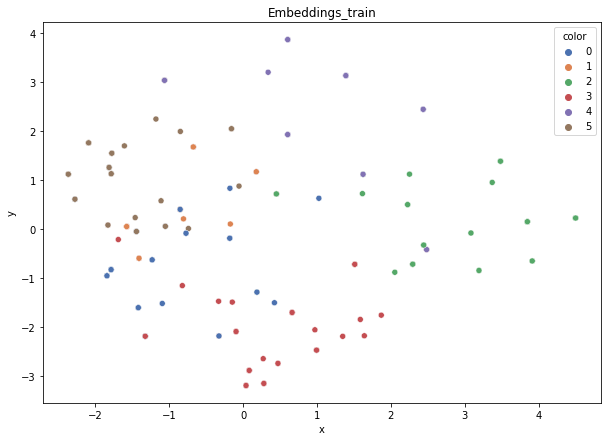

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.743
DT-f1-old+new-features: 0.751
DT-f1-old-features: 0.779
DT-gmean-new-features: 0.713
DT-gmean-old+new-features: 0.721
DT-gmean-old-features: 0.755
KNN-f1-new-features: 0.781
KNN-f1-old+new-features: 0.757
KNN-f1-old-features: 0.692
KNN-gmean-new-features: 0.761
KNN-gmean-old+new-features: 0.733
KNN-gmean-old-features: 0.283
LDA-f1-new-features: 0.768
LDA-f1-old+new-features: 0.75
LDA-f1-old-features: 0.756
LDA-gmean-new-features: 0.74
LDA-gmean-old+new-features: 0.72
LDA-gmean-old-features: 0.729
QDA-f1-new-features: 0.755
QDA-f1-old+new-features: 0.626
QDA-f1-old-features: 0.745
QDA-gmean-new-features: 0.721
QDA-gmean-old+new-features: 0.598
QDA-gmean-old-features: 0.695
RF24-f1-new-features: 0.759
RF24-f1-old+new-features: 0.751
RF24-f1-old-features: 0.767
RF24-gmean-new-features: 0.728
RF24-gmean-old+new-features: 0.72
RF24-gmean-old-features: 0.735


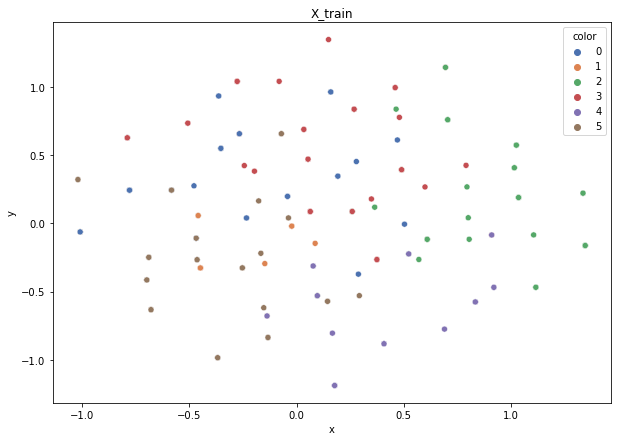

Class cardinalities: Counter({3: 86, 5: 79, 0: 78, 2: 76, 4: 42, 1: 39})
Weights: {0: 0.12857143873483481, 2: 0.1319548976489094, 3: 0.11661130489903622, 4: 0.23877552907897892, 5: 0.12694395216857107, 1: 0.25714287746966963}


100%|██████████| 100/100 [00:00<00:00, 3279.05it/s]


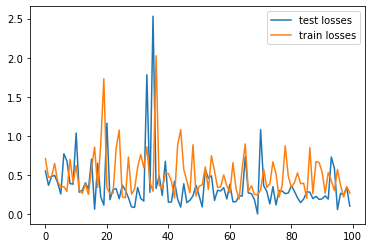

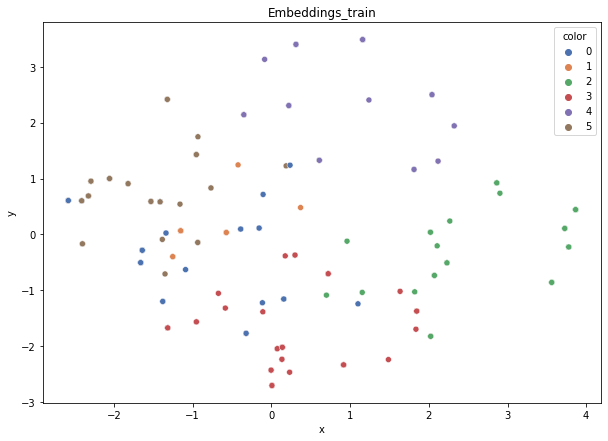

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.784
DT-f1-old+new-features: 0.784
DT-f1-old-features: 0.782
DT-gmean-new-features: 0.785
DT-gmean-old+new-features: 0.785
DT-gmean-old-features: 0.783
KNN-f1-new-features: 0.76
KNN-f1-old+new-features: 0.76
KNN-f1-old-features: 0.739
KNN-gmean-new-features: 0.752
KNN-gmean-old+new-features: 0.752
KNN-gmean-old-features: 0.739
LDA-f1-new-features: 0.813
LDA-f1-old+new-features: 0.813
LDA-f1-old-features: 0.824
LDA-gmean-new-features: 0.809
LDA-gmean-old+new-features: 0.809
LDA-gmean-old-features: 0.824
QDA-f1-new-features: 0.807
QDA-f1-old+new-features: 0.467
QDA-f1-old-features: 0.769
QDA-gmean-new-features: 0.801
QDA-gmean-old+new-features: 0.164
QDA-gmean-old-features: 0.761
RF24-f1-new-features: 0.785
RF24-f1-old+new-features: 0.793
RF24-f1-old-features: 0.793
RF24-gmean-new-features: 0.785
RF24-gmean-old+new-features: 0.793
RF24-gmean-old-features: 0.793


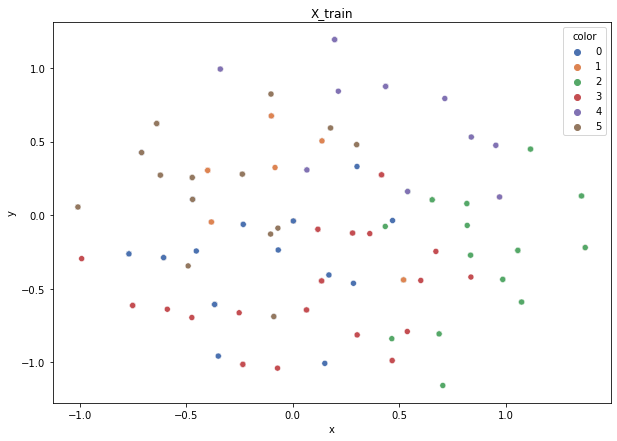

Class cardinalities: Counter({3: 86, 0: 79, 5: 79, 2: 75, 4: 42, 1: 39})
Weights: {0: 0.12692720893782067, 2: 0.13369666008117112, 3: 0.11659592448939342, 4: 0.23874403585923412, 5: 0.12692720893782067, 1: 0.2571089616945598}


100%|██████████| 100/100 [00:00<00:00, 3236.70it/s]


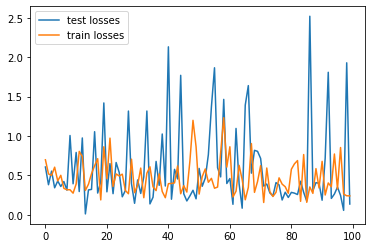

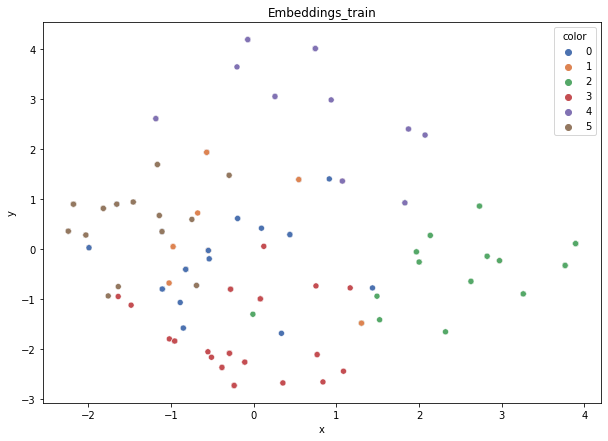

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.704
DT-f1-old+new-features: 0.708
DT-f1-old-features: 0.716
DT-gmean-new-features: 0.693
DT-gmean-old+new-features: 0.693
DT-gmean-old-features: 0.698
KNN-f1-new-features: 0.777
KNN-f1-old+new-features: 0.777
KNN-f1-old-features: 0.714
KNN-gmean-new-features: 0.774
KNN-gmean-old+new-features: 0.774
KNN-gmean-old-features: 0.704
LDA-f1-new-features: 0.759
LDA-f1-old+new-features: 0.717
LDA-f1-old-features: 0.784
LDA-gmean-new-features: 0.745
LDA-gmean-old+new-features: 0.7
LDA-gmean-old-features: 0.777
QDA-f1-new-features: 0.76
QDA-f1-old+new-features: 0.571
QDA-f1-old-features: 0.722
QDA-gmean-new-features: 0.748
QDA-gmean-old+new-features: 0.555
QDA-gmean-old-features: 0.704
RF24-f1-new-features: 0.747
RF24-f1-old+new-features: 0.747
RF24-f1-old-features: 0.763
RF24-gmean-new-features: 0.735
RF24-gmean-old+new-features: 0.735
RF24-gmean-old-features: 0.751


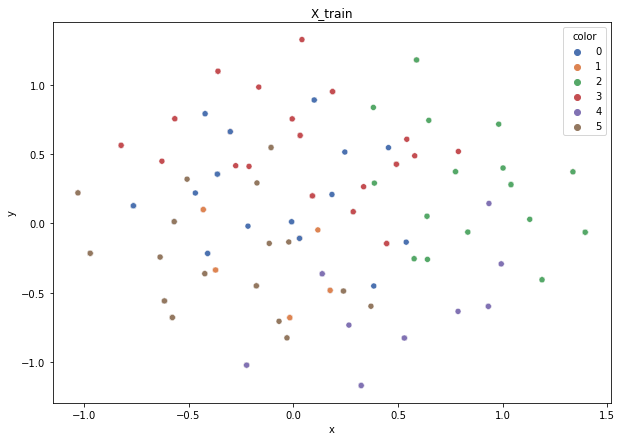

Class cardinalities: Counter({3: 86, 0: 79, 5: 79, 2: 75, 4: 42, 1: 39})
Weights: {0: 0.12692720893782067, 2: 0.13369666008117112, 3: 0.11659592448939342, 4: 0.23874403585923412, 5: 0.12692720893782067, 1: 0.2571089616945598}


100%|██████████| 100/100 [00:00<00:00, 3380.40it/s]


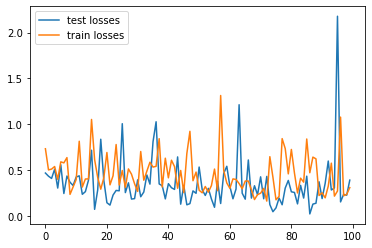

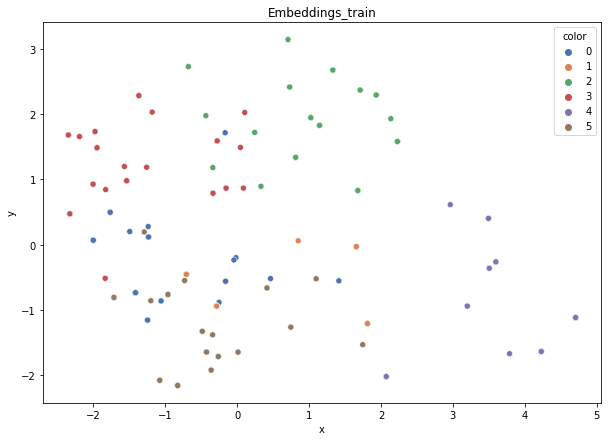

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.786
DT-f1-old+new-features: 0.786
DT-f1-old-features: 0.802
DT-gmean-new-features: 0.791
DT-gmean-old+new-features: 0.791
DT-gmean-old-features: 0.806
KNN-f1-new-features: 0.733
KNN-f1-old+new-features: 0.733
KNN-f1-old-features: 0.785
KNN-gmean-new-features: 0.735
KNN-gmean-old+new-features: 0.735
KNN-gmean-old-features: 0.796
LDA-f1-new-features: 0.794
LDA-f1-old+new-features: 0.794
LDA-f1-old-features: 0.822
LDA-gmean-new-features: 0.798
LDA-gmean-old+new-features: 0.798
LDA-gmean-old-features: 0.822
QDA-f1-new-features: 0.785
QDA-f1-old+new-features: 0.702
QDA-f1-old-features: 0.8
QDA-gmean-new-features: 0.791
QDA-gmean-old+new-features: 0.69
QDA-gmean-old-features: 0.797
RF24-f1-new-features: 0.794
RF24-f1-old+new-features: 0.794
RF24-f1-old-features: 0.802
RF24-gmean-new-features: 0.798
RF24-gmean-old+new-features: 0.798
RF24-gmean-old-features: 0.806
new_winequality-red


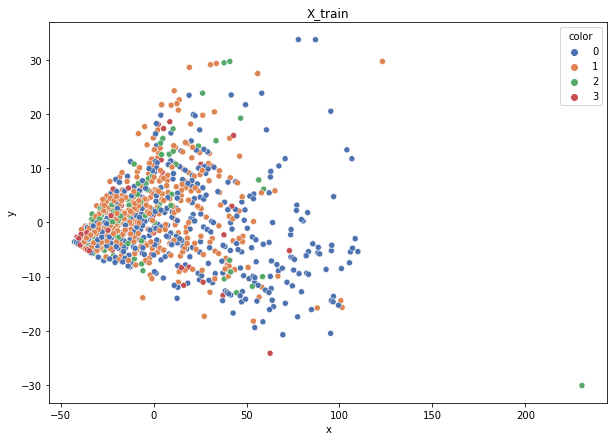

Class cardinalities: Counter({0: 544, 1: 511, 2: 159, 3: 65})
Weights: {0: 0.07217510080141348, 1: 0.07683611513888246, 2: 0.246938709660182, 3: 0.6040500743995221}


100%|██████████| 320/320 [00:00<00:00, 3322.11it/s]


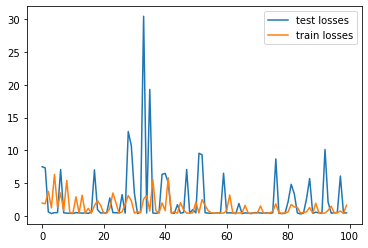

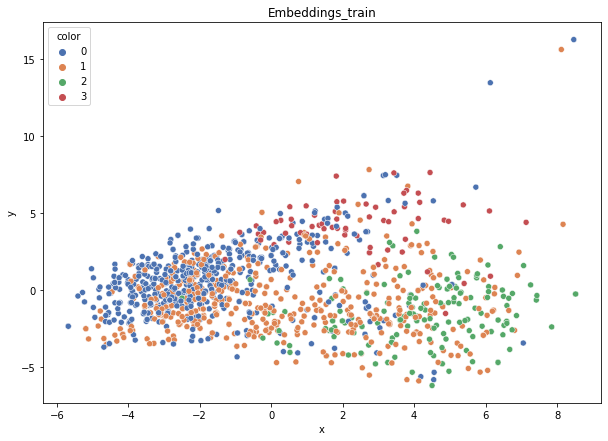

DT-f1-new-features: 0.524
DT-f1-old+new-features: 0.504
DT-f1-old-features: 0.503
DT-gmean-new-features: 0.504
DT-gmean-old+new-features: 0.461
DT-gmean-old-features: 0.368
KNN-f1-new-features: 0.533
KNN-f1-old+new-features: 0.537
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.442
KNN-gmean-old+new-features: 0.478
KNN-gmean-old-features: 0.487
LDA-f1-new-features: 0.509
LDA-f1-old+new-features: 0.547
LDA-f1-old-features: 0.458
LDA-gmean-new-features: 0.482
LDA-gmean-old+new-features: 0.525
LDA-gmean-old-features: 0.328
QDA-f1-new-features: 0.477
QDA-f1-old+new-features: 0.528
QDA-f1-old-features: 0.403
QDA-gmean-new-features: 0.464
QDA-gmean-old+new-features: 0.541
QDA-gmean-old-features: 0.111
RF24-f1-new-features: 0.598
RF24-f1-old+new-features: 0.596
RF24-f1-old-features: 0.581
RF24-gmean-new-features: 0.557
RF24-gmean-old+new-features: 0.553
RF24-gmean-old-features: 0.402


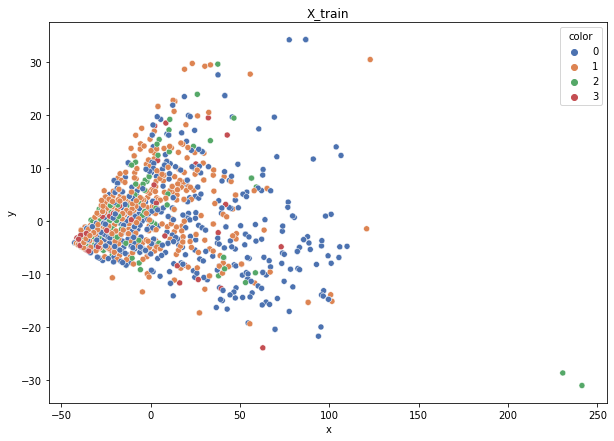

Class cardinalities: Counter({0: 545, 1: 510, 2: 159, 3: 65})
Weights: {0: 0.072041356277607, 1: 0.07698537092410943, 2: 0.24693420862450194, 3: 0.6040390641737817}


100%|██████████| 320/320 [00:00<00:00, 3447.59it/s]


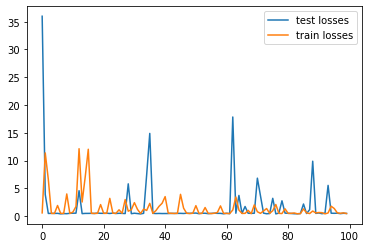

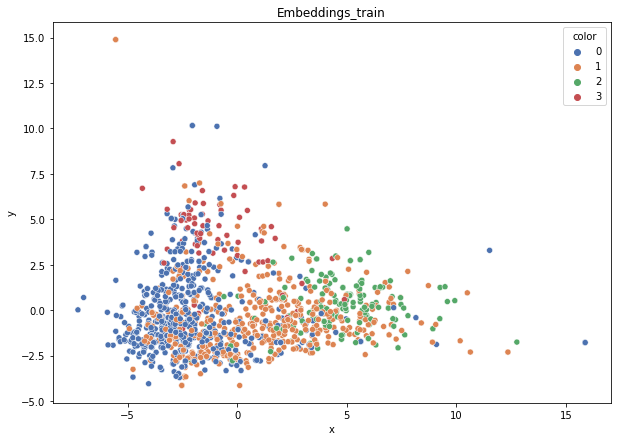

DT-f1-new-features: 0.503
DT-f1-old+new-features: 0.502
DT-f1-old-features: 0.505
DT-gmean-new-features: 0.479
DT-gmean-old+new-features: 0.506
DT-gmean-old-features: 0.48
KNN-f1-new-features: 0.494
KNN-f1-old+new-features: 0.548
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.431
KNN-gmean-old+new-features: 0.495
KNN-gmean-old-features: 0.512
LDA-f1-new-features: 0.463
LDA-f1-old+new-features: 0.486
LDA-f1-old-features: 0.453
LDA-gmean-new-features: 0.418
LDA-gmean-old+new-features: 0.462
LDA-gmean-old-features: 0.348
QDA-f1-new-features: 0.483
QDA-f1-old+new-features: 0.514
QDA-f1-old-features: 0.478
QDA-gmean-new-features: 0.51
QDA-gmean-old+new-features: 0.542
QDA-gmean-old-features: 0.421
RF24-f1-new-features: 0.555
RF24-f1-old+new-features: 0.566
RF24-f1-old-features: 0.558
RF24-gmean-new-features: 0.482
RF24-gmean-old+new-features: 0.492
RF24-gmean-old-features: 0.439


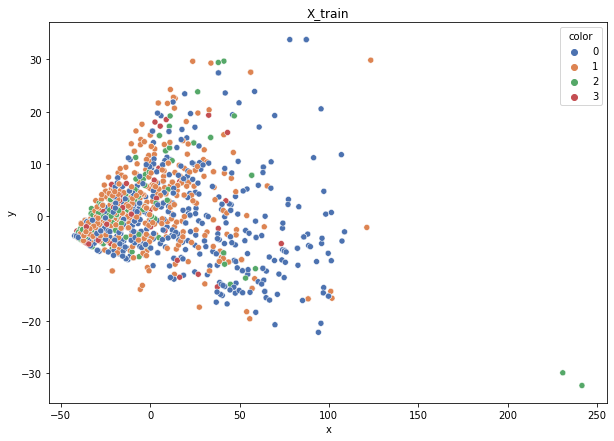

Class cardinalities: Counter({0: 545, 1: 510, 2: 159, 3: 65})
Weights: {0: 0.072041356277607, 1: 0.07698537092410943, 2: 0.24693420862450194, 3: 0.6040390641737817}


100%|██████████| 320/320 [00:00<00:00, 3389.03it/s]


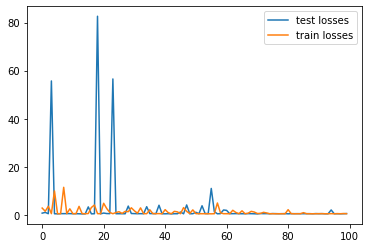

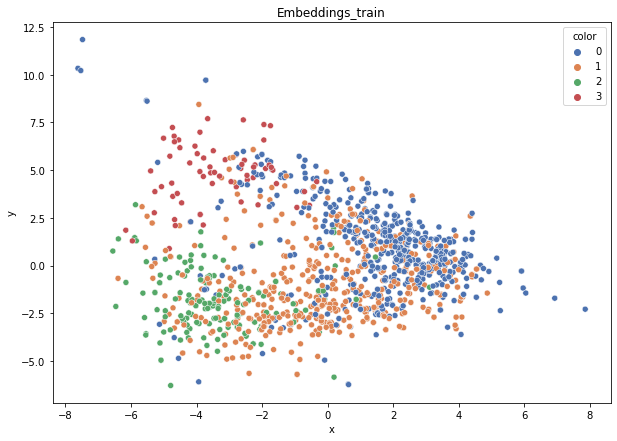

DT-f1-new-features: 0.471
DT-f1-old+new-features: 0.446
DT-f1-old-features: 0.514
DT-gmean-new-features: 0.41
DT-gmean-old+new-features: 0.338
DT-gmean-old-features: 0.468
KNN-f1-new-features: 0.488
KNN-f1-old+new-features: 0.536
KNN-f1-old-features: 0.544
KNN-gmean-new-features: 0.419
KNN-gmean-old+new-features: 0.488
KNN-gmean-old-features: 0.516
LDA-f1-new-features: 0.517
LDA-f1-old+new-features: 0.482
LDA-f1-old-features: 0.445
LDA-gmean-new-features: 0.511
LDA-gmean-old+new-features: 0.446
LDA-gmean-old-features: 0.321
QDA-f1-new-features: 0.442
QDA-f1-old+new-features: 0.476
QDA-f1-old-features: 0.42
QDA-gmean-new-features: 0.422
QDA-gmean-old+new-features: 0.451
QDA-gmean-old-features: 0.306
RF24-f1-new-features: 0.49
RF24-f1-old+new-features: 0.524
RF24-f1-old-features: 0.515
RF24-gmean-new-features: 0.132
RF24-gmean-old+new-features: 0.378
RF24-gmean-old-features: 0.138


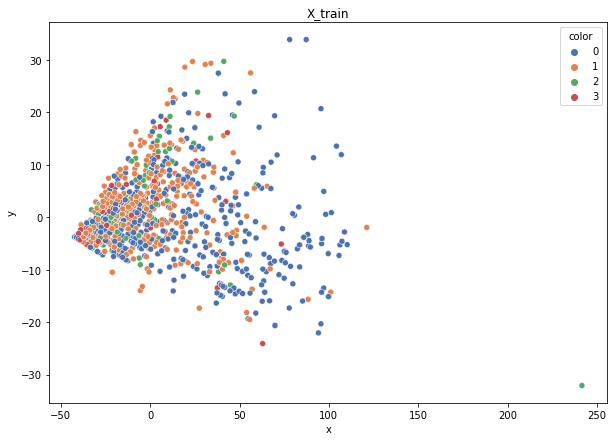

Class cardinalities: Counter({0: 545, 1: 510, 2: 160, 3: 64})
Weights: {0: 0.07147706120661339, 2: 0.24346873973502686, 3: 0.6086718493375671, 1: 0.07638234972079273}


100%|██████████| 320/320 [00:00<00:00, 3288.13it/s]


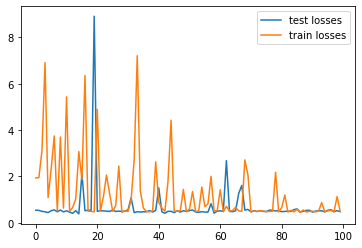

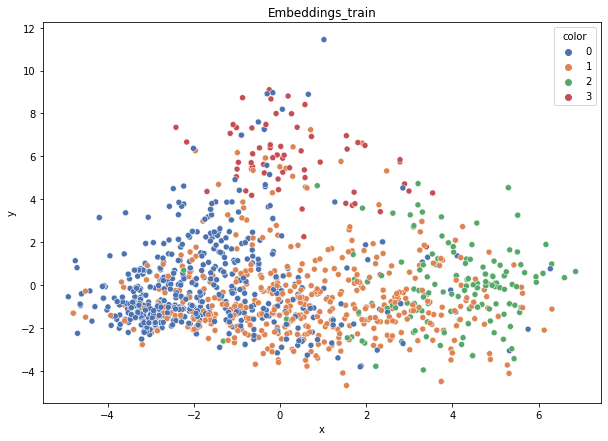

DT-f1-new-features: 0.48
DT-f1-old+new-features: 0.49
DT-f1-old-features: 0.427
DT-gmean-new-features: 0.338
DT-gmean-old+new-features: 0.456
DT-gmean-old-features: 0.378
KNN-f1-new-features: 0.485
KNN-f1-old+new-features: 0.495
KNN-f1-old-features: 0.486
KNN-gmean-new-features: 0.394
KNN-gmean-old+new-features: 0.388
KNN-gmean-old-features: 0.421
LDA-f1-new-features: 0.47
LDA-f1-old+new-features: 0.468
LDA-f1-old-features: 0.411
LDA-gmean-new-features: 0.406
LDA-gmean-old+new-features: 0.404
LDA-gmean-old-features: 0.11
QDA-f1-new-features: 0.409
QDA-f1-old+new-features: 0.415
QDA-f1-old-features: 0.418
QDA-gmean-new-features: 0.299
QDA-gmean-old+new-features: 0.116
QDA-gmean-old-features: 0.361
RF24-f1-new-features: 0.571
RF24-f1-old+new-features: 0.559
RF24-f1-old-features: 0.513
RF24-gmean-new-features: 0.501
RF24-gmean-old+new-features: 0.463
RF24-gmean-old-features: 0.401


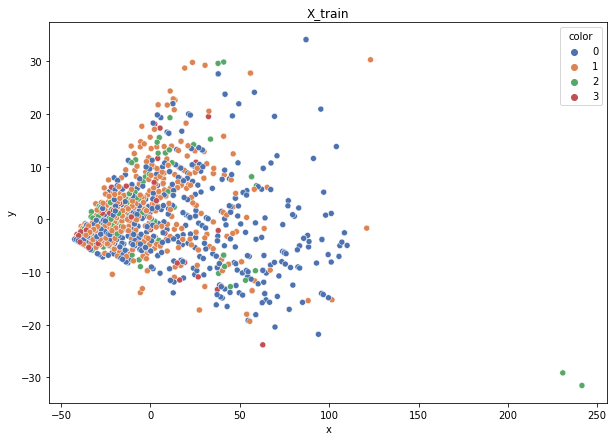

Class cardinalities: Counter({0: 545, 1: 511, 2: 159, 3: 65})
Weights: {0: 0.07205221139741194, 1: 0.07684629199919668, 2: 0.24697141642509127, 3: 0.6041300801783002}


100%|██████████| 319/319 [00:00<00:00, 3308.03it/s]


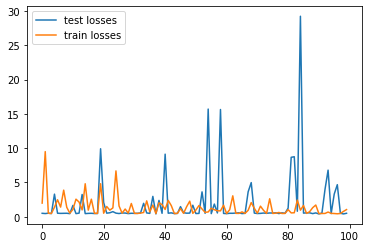

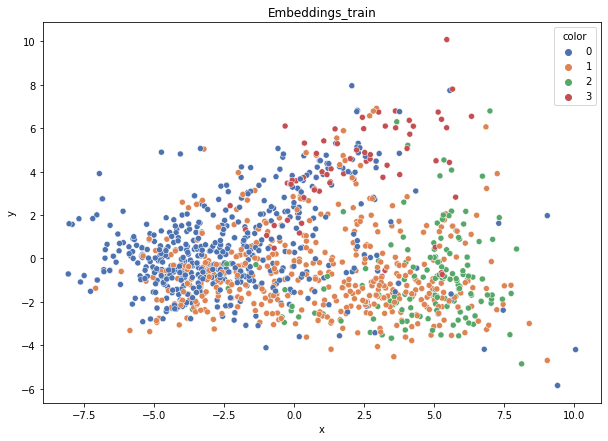

DT-f1-new-features: 0.518
DT-f1-old+new-features: 0.47
DT-f1-old-features: 0.463
DT-gmean-new-features: 0.436
DT-gmean-old+new-features: 0.399
DT-gmean-old-features: 0.399
KNN-f1-new-features: 0.487
KNN-f1-old+new-features: 0.566
KNN-f1-old-features: 0.537
KNN-gmean-new-features: 0.13
KNN-gmean-old+new-features: 0.462
KNN-gmean-old-features: 0.437
LDA-f1-new-features: 0.541
LDA-f1-old+new-features: 0.543
LDA-f1-old-features: 0.512
LDA-gmean-new-features: 0.513
LDA-gmean-old+new-features: 0.519
LDA-gmean-old-features: 0.431
QDA-f1-new-features: 0.517
QDA-f1-old+new-features: 0.547
QDA-f1-old-features: 0.512
QDA-gmean-new-features: 0.514
QDA-gmean-old+new-features: 0.54
QDA-gmean-old-features: 0.449
RF24-f1-new-features: 0.627
RF24-f1-old+new-features: 0.606
RF24-f1-old-features: 0.608
RF24-gmean-new-features: 0.574
RF24-gmean-old+new-features: 0.52
RF24-gmean-old-features: 0.472
thyroid-newthyroid


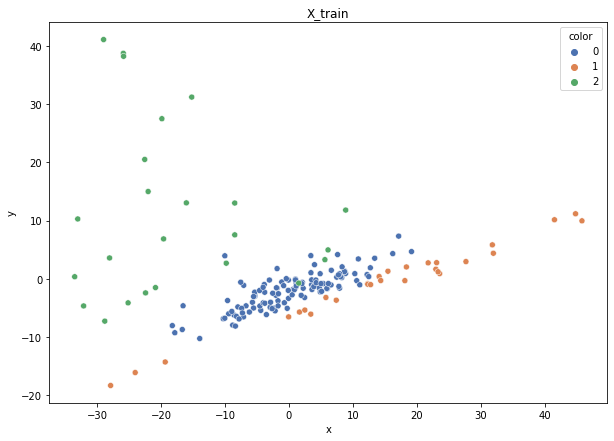

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 2996.78it/s]


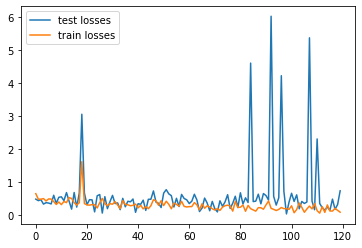

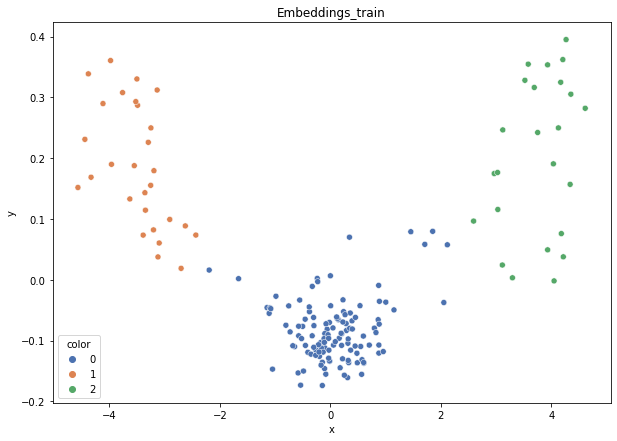

DT-f1-new-features: 0.923
DT-f1-old+new-features: 0.923
DT-f1-old-features: 0.902
DT-gmean-new-features: 0.874
DT-gmean-old+new-features: 0.874
DT-gmean-old-features: 0.884
KNN-f1-new-features: 0.964
KNN-f1-old+new-features: 0.964
KNN-f1-old-features: 0.964
KNN-gmean-new-features: 0.941
KNN-gmean-old+new-features: 0.941
KNN-gmean-old-features: 0.941
LDA-f1-new-features: 0.964
LDA-f1-old+new-features: 0.964
LDA-f1-old-features: 0.898
LDA-gmean-new-features: 0.941
LDA-gmean-old+new-features: 0.941
LDA-gmean-old-features: 0.841
QDA-f1-new-features: 0.964
QDA-f1-old+new-features: 0.964
QDA-f1-old-features: 0.964
QDA-gmean-new-features: 0.941
QDA-gmean-old+new-features: 0.941
QDA-gmean-old-features: 0.941
RF24-f1-new-features: 0.923
RF24-f1-old+new-features: 0.923
RF24-f1-old-features: 0.933
RF24-gmean-new-features: 0.874
RF24-gmean-old+new-features: 0.874
RF24-gmean-old-features: 0.894


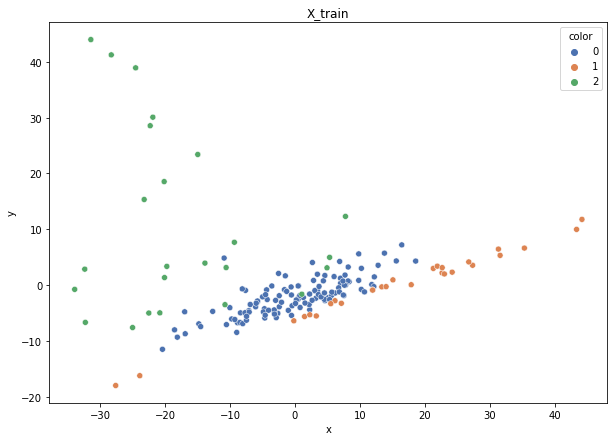

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 3171.64it/s]


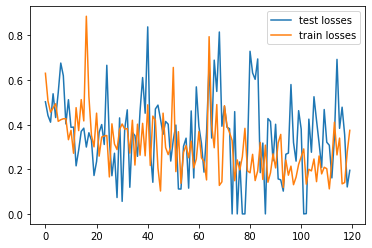

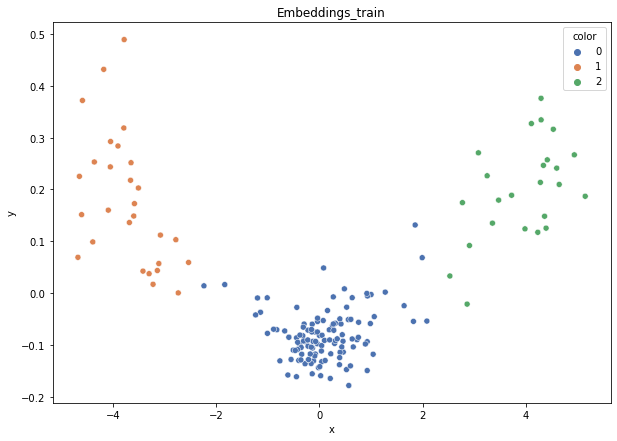

DT-f1-new-features: 0.969
DT-f1-old+new-features: 0.969
DT-f1-old-features: 0.947
DT-gmean-new-features: 0.95
DT-gmean-old+new-features: 0.95
DT-gmean-old-features: 0.977
KNN-f1-new-features: 0.969
KNN-f1-old+new-features: 0.969
KNN-f1-old-features: 0.972
KNN-gmean-new-features: 0.95
KNN-gmean-old+new-features: 0.95
KNN-gmean-old-features: 0.989
LDA-f1-new-features: 0.969
LDA-f1-old+new-features: 0.969
LDA-f1-old-features: 0.933
LDA-gmean-new-features: 0.95
LDA-gmean-old+new-features: 0.95
LDA-gmean-old-features: 0.894
QDA-f1-new-features: 0.969
QDA-f1-old+new-features: 0.969
QDA-f1-old-features: 0.969
QDA-gmean-new-features: 0.95
QDA-gmean-old+new-features: 0.95
QDA-gmean-old-features: 0.989
RF24-f1-new-features: 0.969
RF24-f1-old+new-features: 0.969
RF24-f1-old-features: 0.969
RF24-gmean-new-features: 0.95
RF24-gmean-old+new-features: 0.95
RF24-gmean-old-features: 0.95


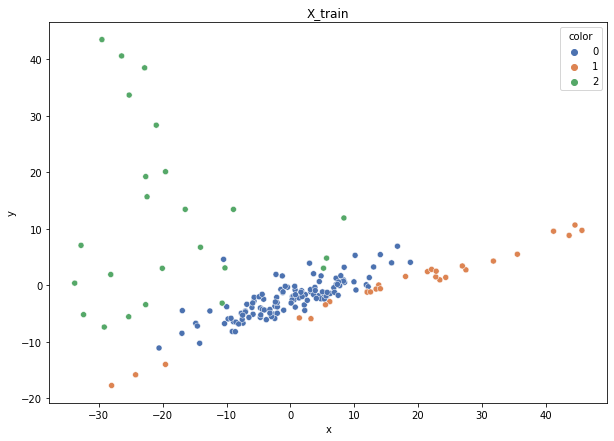

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 3143.55it/s]


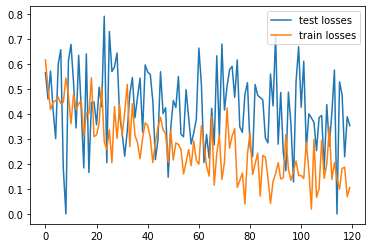

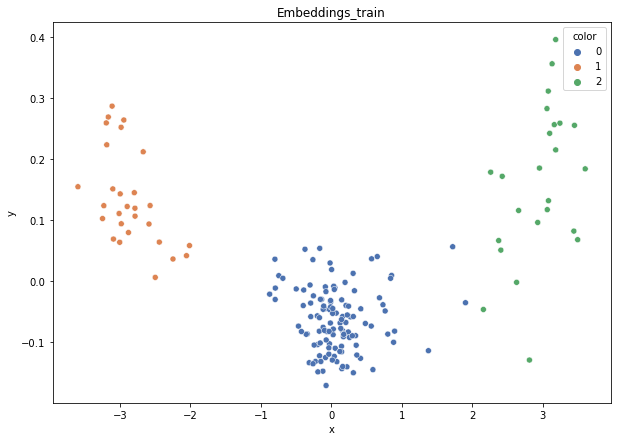

DT-f1-new-features: 0.972
DT-f1-old+new-features: 0.972
DT-f1-old-features: 0.905
DT-gmean-new-features: 0.989
DT-gmean-old+new-features: 0.989
DT-gmean-old-features: 0.92
KNN-f1-new-features: 0.936
KNN-f1-old+new-features: 0.905
KNN-f1-old-features: 0.902
KNN-gmean-new-features: 0.93
KNN-gmean-old+new-features: 0.92
KNN-gmean-old-features: 0.884
LDA-f1-new-features: 0.875
LDA-f1-old+new-features: 0.875
LDA-f1-old-features: 0.817
LDA-gmean-new-features: 0.874
LDA-gmean-old+new-features: 0.874
LDA-gmean-old-features: 0.725
QDA-f1-new-features: 0.875
QDA-f1-old+new-features: 0.941
QDA-f1-old-features: 0.936
QDA-gmean-new-features: 0.874
QDA-gmean-old+new-features: 0.977
QDA-gmean-old-features: 0.93
RF24-f1-new-features: 0.936
RF24-f1-old+new-features: 0.936
RF24-f1-old-features: 0.933
RF24-gmean-new-features: 0.93
RF24-gmean-old+new-features: 0.93
RF24-gmean-old-features: 0.894


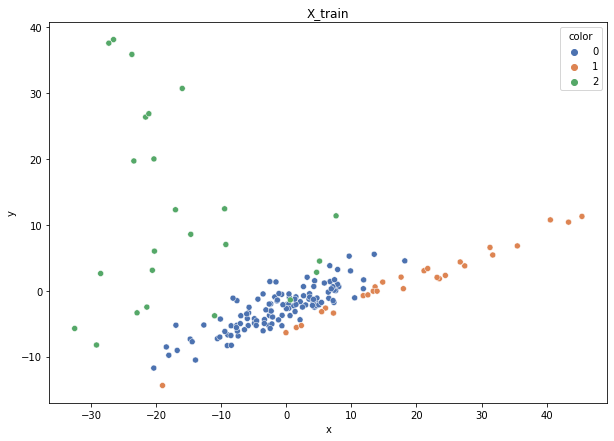

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 2666.87it/s]


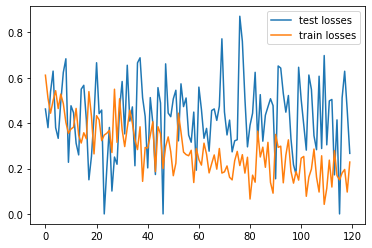

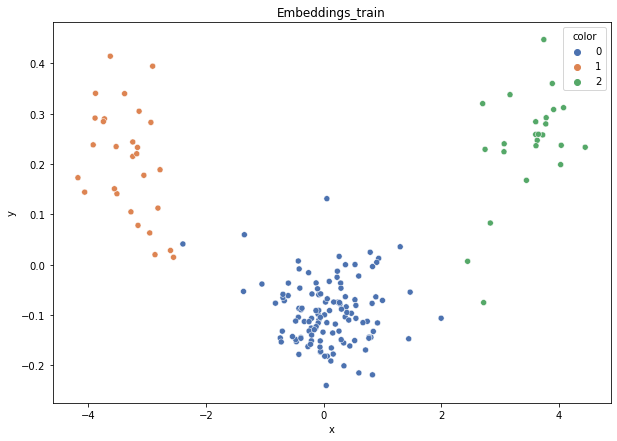

DT-f1-new-features: 0.933
DT-f1-old+new-features: 0.933
DT-f1-old-features: 0.902
DT-gmean-new-features: 0.894
DT-gmean-old+new-features: 0.894
DT-gmean-old-features: 0.884
KNN-f1-new-features: 0.969
KNN-f1-old+new-features: 0.941
KNN-f1-old-features: 0.941
KNN-gmean-new-features: 0.95
KNN-gmean-old+new-features: 0.977
KNN-gmean-old-features: 0.977
LDA-f1-new-features: 0.913
LDA-f1-old+new-features: 0.941
LDA-f1-old-features: 0.898
LDA-gmean-new-features: 0.965
LDA-gmean-old+new-features: 0.977
LDA-gmean-old-features: 0.841
QDA-f1-new-features: 0.913
QDA-f1-old+new-features: 0.941
QDA-f1-old-features: 0.969
QDA-gmean-new-features: 0.965
QDA-gmean-old+new-features: 0.977
QDA-gmean-old-features: 0.989
RF24-f1-new-features: 0.969
RF24-f1-old+new-features: 0.969
RF24-f1-old-features: 0.902
RF24-gmean-new-features: 0.95
RF24-gmean-old+new-features: 0.95
RF24-gmean-old-features: 0.884


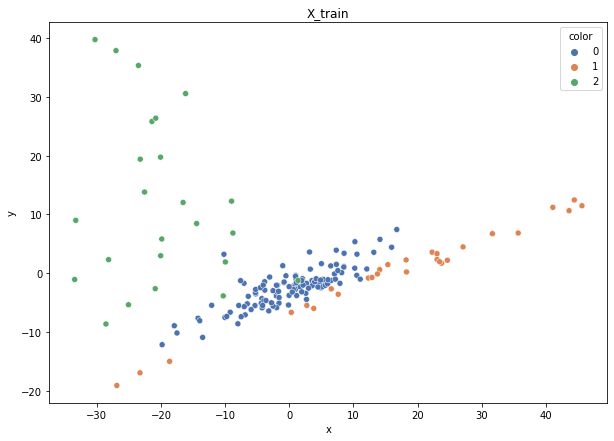

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


100%|██████████| 43/43 [00:00<00:00, 3231.24it/s]


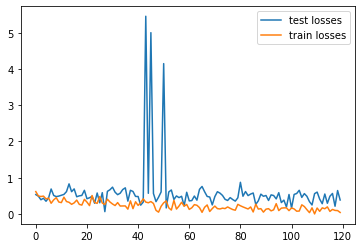

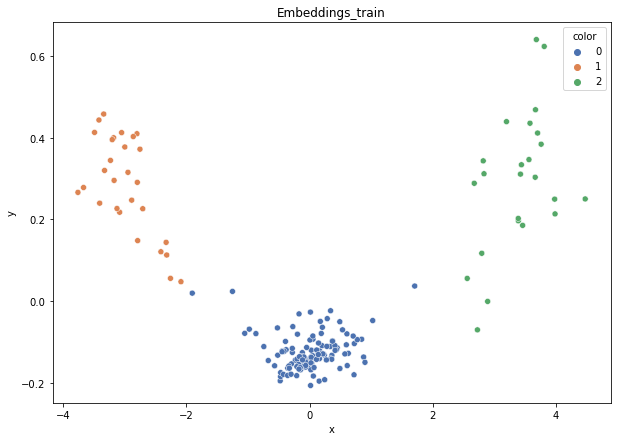

DT-f1-new-features: 0.923
DT-f1-old+new-features: 0.923
DT-f1-old-features: 0.893
DT-gmean-new-features: 0.874
DT-gmean-old+new-features: 0.874
DT-gmean-old-features: 0.864
KNN-f1-new-features: 0.923
KNN-f1-old+new-features: 0.923
KNN-f1-old-features: 0.873
KNN-gmean-new-features: 0.874
KNN-gmean-old+new-features: 0.874
KNN-gmean-old-features: 0.794
LDA-f1-new-features: 0.923
LDA-f1-old+new-features: 0.893
LDA-f1-old-features: 0.721
LDA-gmean-new-features: 0.874
LDA-gmean-old+new-features: 0.864
LDA-gmean-old-features: 0.598
QDA-f1-new-features: 0.893
QDA-f1-old+new-features: 0.893
QDA-f1-old-features: 0.895
QDA-gmean-new-features: 0.864
QDA-gmean-old+new-features: 0.864
QDA-gmean-old-features: 0.864
RF24-f1-new-features: 0.893
RF24-f1-old+new-features: 0.923
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.864
RF24-gmean-old+new-features: 0.874
RF24-gmean-old-features: 0.874


In [12]:
result_dict = defaultdict(list)

safety_dict = defaultdict(list)

if test_all_ds:
    ds_names = dt_name_to_cols_to_encode.keys()
else:
    ds_names = [ds_name]
for dataset_name in ds_names:
# for dataset_name in list(datasets.keys()):
    print(dataset_name)
    result_dict["dataset"].append(dataset_name)
    fold_result_dict = defaultdict(list)
    
    safety_dict["dataset"].append(dataset_name)
    fold_safety_dict = defaultdict(list)

    X, y = datasets[dataset_name]['data'], datasets[dataset_name]['target']
    X_encoded, y = datasets[f"{dataset_name}_encoded"]['data'], datasets[f"{dataset_name}_encoded"]['target']
    
    skf = StratifiedKFold(n_splits=5, random_state=0, shuffle=True)
    n_splits = skf.get_n_splits(X, y)
    
    folds = []
    if test_on_all_folds:
        folds = skf.split(X, y)
    else:
        folds = list(skf.split(X, y))[1:2]
        
    for train_index, test_index in folds:
        X_train, X_test = X[train_index], X[test_index]
        X_train_norm, X_test_norm = standardize(X_train, X_test)
        y_train, y_test = y[train_index], y[test_index]
        
        
        X_train_enc, X_test_enc = X_encoded[train_index], X_encoded[test_index]
        X_train_enc, X_test_enc = standardize(X_train_enc, X_test_enc)
        
        
        # PCA X_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(X_train), y_train)
        plt.title("X_train")
        plt.show()
        
        weights = ex.weights_calculation_strategy1(X_train, y_train)
        cfg =  config[dataset_name]
        # pretrain ANN triplets
        embeddings_train, embeddings_test = ex.train_triplets(X_train_enc, y_train, X_test_enc, y_test, weights,cfg)
        
        s_dict = calc_safety5(embeddings_test, y_test)
        for k, v in s_dict.items():
            fold_safety_dict[f"emb-{k}"].append(v)
            
        s_dict = calc_safety5(X_test_enc, y_test)
        for k,v in s_dict.items():
            fold_safety_dict[f"raw-{k}"].append(v)
        
        # PCA embeddings_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(embeddings_train), y_train)
        plt.title("Embeddings_train")
        plt.show()
        
        X_train_new = np.hstack([X_train_norm, embeddings_train])
        X_test_new = np.hstack([X_test_norm, embeddings_test])
        
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train_norm, y_train)
            preds = clf.predict(X_test_norm)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-old-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old-features"].append(gmean)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train_new, y_train)
            preds = clf.predict(X_test_new)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-old+new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old+new-features"].append(gmean)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(embeddings_train, y_train)
            preds = clf.predict(embeddings_test)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-new-features"].append(gmean)
        for key in sorted(list(fold_result_dict.keys())):
            print(f"{key}: {np.round(fold_result_dict[key][-1],3)}")
            
    for k in fold_result_dict:
        result_dict[k].append(np.mean(fold_result_dict[k]))
        
    for k in fold_safety_dict:
        safety_dict[k].append(np.sum(fold_safety_dict[k]) / X.shape[0])

In [13]:
results_df = pd.DataFrame.from_dict(result_dict)

In [14]:
# safety_dict['emb-outlier'].append("None")

In [15]:
safety_df = pd.DataFrame.from_dict(safety_dict)

In [16]:
results_df

,dataset,RF24-f1-old-features,RF24-gmean-old-features,DT-f1-old-features,DT-gmean-old-features,KNN-f1-old-features,KNN-gmean-old-features,QDA-f1-old-features,QDA-gmean-old-features,LDA-f1-old-features,...,RF24-f1-new-features,RF24-gmean-new-features,DT-f1-new-features,DT-gmean-new-features,KNN-f1-new-features,KNN-gmean-new-features,QDA-f1-new-features,QDA-gmean-new-features,LDA-f1-new-features,LDA-gmean-new-features
0,cmc,0.514118,0.512655,0.467266,0.470278,0.422592,0.412867,0.508046,0.519498,0.488274,...,0.450141,0.436567,0.405399,0.401031,0.413393,0.402578,0.478668,0.483032,0.484231,0.472237
1,dermatology,0.964200,0.962295,0.949703,0.951222,0.937131,0.932309,0.777500,0.747057,0.958265,...,0.927941,0.919994,0.926170,0.925854,0.930132,0.923927,0.753163,0.292724,0.954455,0.952701
2,hayes-roth,0.852497,0.841131,0.851208,0.838449,0.672362,0.636136,0.637542,0.633175,0.559310,...,0.864896,0.858903,0.874201,0.866637,0.885409,0.880603,0.848746,0.839966,0.854457,0.847326
3,new_vehicle,0.957161,0.962521,0.896672,0.898498,0.912321,0.912341,0.969460,0.973731,0.939198,...,0.978011,0.976225,0.971910,0.968887,0.979859,0.979883,0.982478,0.984348,0.981082,0.980703
4,new_yeast,0.562953,0.338100,0.442388,0.282887,0.486925,0.408416,0.151335,0.045770,0.531617,...,0.493184,0.267123,0.427894,0.318323,0.441489,0.349937,0.472093,0.313937,0.506410,0.273140
5,1czysty-cut,0.934189,0.938694,0.935490,0.936512,0.945528,0.943824,0.814045,0.716022,0.264241,...,0.975376,0.978122,0.974644,0.974010,0.979607,0.974912,0.953099,0.976652,0.969907,0.980958
6,2delikatne-cut,0.761136,0.756883,0.724198,0.737376,0.699865,0.678350,0.658847,0.514531,0.273738,...,0.781074,0.780045,0.715954,0.724922,0.727295,0.714922,0.745229,0.801630,0.765899,0.764317
7,3mocniej-cut,0.560931,0.519703,0.504810,0.502048,0.508642,0.457700,0.274510,0.010000,0.274510,...,0.556959,0.482231,0.525492,0.500888,0.527916,0.481368,0.590204,0.659899,0.634338,0.573924
8,4delikatne-bezover-cut,0.820201,0.835313,0.796105,0.813035,0.767612,0.760887,0.793653,0.717321,0.268589,...,0.821495,0.832142,0.817081,0.828224,0.815979,0.809353,0.816105,0.891015,0.837152,0.883287
9,balance-scale,0.593905,0.092184,0.605016,0.416495,0.560676,0.089082,0.857046,0.916265,0.607652,...,0.832932,0.832332,0.828433,0.819335,0.819548,0.815868,0.823565,0.812680,0.818502,0.859591


In [17]:
safety_df[sorted(safety_df.filter(regex=("dataset|emb")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,emb-borderline,emb-outlier,emb-rare,emb-safe
0,cmc,0.505771,0.112695,0.254582,0.126952
1,dermatology,0.169399,0.013661,0.038251,0.778689
2,hayes-roth,0.181250,0.043750,0.037500,0.737500
3,new_vehicle,0.016548,0.004728,0.007092,0.971631
4,new_yeast,0.427224,0.159704,0.185310,0.227763
5,1czysty-cut,0.020000,0.001667,0.003333,0.975000
6,2delikatne-cut,0.200833,0.026667,0.065000,0.707500
7,3mocniej-cut,0.233333,0.069167,0.073333,0.624167
8,4delikatne-bezover-cut,0.145833,0.016667,0.040833,0.796667
9,balance-scale,0.112000,0.022400,0.041600,0.824000


In [18]:
safety_df[sorted(safety_df.filter(regex=("dataset|raw")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,raw-borderline,raw-outlier,raw-rare,raw-safe
0,cmc,0.505092,0.117447,0.260692,0.116768
1,dermatology,0.464481,0.060109,0.144809,0.330601
2,hayes-roth,0.687500,0.031250,0.131250,0.150000
3,new_vehicle,0.255319,0.020095,0.053191,0.671395
4,new_yeast,0.415768,0.164420,0.174528,0.245283
5,1czysty-cut,0.131667,0.003333,0.015000,0.850000
6,2delikatne-cut,0.209167,0.010000,0.060833,0.720000
7,3mocniej-cut,0.232500,0.062500,0.079167,0.625833
8,4delikatne-bezover-cut,0.185833,0.010833,0.040833,0.762500
9,balance-scale,0.505600,0.064000,0.120000,0.310400


In [19]:
safety_df[sorted(safety_df.filter(regex=("dataset|.*safe")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,emb-safe,raw-safe
0,cmc,0.126952,0.116768
1,dermatology,0.778689,0.330601
2,hayes-roth,0.737500,0.150000
3,new_vehicle,0.971631,0.671395
4,new_yeast,0.227763,0.245283
5,1czysty-cut,0.975000,0.850000
6,2delikatne-cut,0.707500,0.720000
7,3mocniej-cut,0.624167,0.625833
8,4delikatne-bezover-cut,0.796667,0.762500
9,balance-scale,0.824000,0.310400


In [20]:
results_df.filter(regex=("dataset|RF24-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,RF24-f1-old-features,RF24-f1-old+new-features,RF24-f1-new-features
0,cmc,0.514118,0.500826,0.450141
1,dermatology,0.964200,0.946126,0.927941
2,hayes-roth,0.852497,0.864896,0.864896
3,new_vehicle,0.957161,0.978011,0.978011
4,new_yeast,0.562953,0.535104,0.493184
5,1czysty-cut,0.934189,0.975376,0.975376
6,2delikatne-cut,0.761136,0.772976,0.781074
7,3mocniej-cut,0.560931,0.556357,0.556959
8,4delikatne-bezover-cut,0.820201,0.820923,0.821495
9,balance-scale,0.593905,0.832344,0.832932


In [21]:
results_df.filter(regex=("dataset|RF24-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,RF24-gmean-old-features,RF24-gmean-old+new-features,RF24-gmean-new-features
0,cmc,0.512655,0.488615,0.436567
1,dermatology,0.962295,0.940386,0.919994
2,hayes-roth,0.841131,0.858903,0.858903
3,new_vehicle,0.962521,0.976225,0.976225
4,new_yeast,0.338100,0.284806,0.267123
5,1czysty-cut,0.938694,0.978122,0.978122
6,2delikatne-cut,0.756883,0.768732,0.780045
7,3mocniej-cut,0.519703,0.471217,0.482231
8,4delikatne-bezover-cut,0.835313,0.829425,0.832142
9,balance-scale,0.092184,0.831233,0.832332


In [22]:
results_df.filter(regex=("dataset|DT-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,DT-f1-old-features,DT-f1-old+new-features,DT-f1-new-features
0,cmc,0.467266,0.452600,0.405399
1,dermatology,0.949703,0.938729,0.926170
2,hayes-roth,0.851208,0.866089,0.874201
3,new_vehicle,0.896672,0.971170,0.971910
4,new_yeast,0.442388,0.430862,0.427894
5,1czysty-cut,0.935490,0.976455,0.974644
6,2delikatne-cut,0.724198,0.743995,0.715954
7,3mocniej-cut,0.504810,0.511521,0.525492
8,4delikatne-bezover-cut,0.796105,0.808507,0.817081
9,balance-scale,0.605016,0.829458,0.828433


In [23]:
results_df.filter(regex=("dataset|DT-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,DT-gmean-old-features,DT-gmean-old+new-features,DT-gmean-new-features
0,cmc,0.470278,0.449105,0.401031
1,dermatology,0.951222,0.936240,0.925854
2,hayes-roth,0.838449,0.856417,0.866637
3,new_vehicle,0.898498,0.968181,0.968887
4,new_yeast,0.282887,0.358611,0.318323
5,1czysty-cut,0.936512,0.977084,0.974010
6,2delikatne-cut,0.737376,0.740251,0.724922
7,3mocniej-cut,0.502048,0.485117,0.500888
8,4delikatne-bezover-cut,0.813035,0.814519,0.828224
9,balance-scale,0.416495,0.824230,0.819335


In [24]:
results_df.filter(regex=("dataset|KNN-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,KNN-f1-old-features,KNN-f1-old+new-features,KNN-f1-new-features
0,cmc,0.422592,0.435480,0.413393
1,dermatology,0.937131,0.944380,0.930132
2,hayes-roth,0.672362,0.875153,0.885409
3,new_vehicle,0.912321,0.982212,0.979859
4,new_yeast,0.486925,0.458893,0.441489
5,1czysty-cut,0.945528,0.973472,0.979607
6,2delikatne-cut,0.699865,0.727295,0.727295
7,3mocniej-cut,0.508642,0.523903,0.527916
8,4delikatne-bezover-cut,0.767612,0.812490,0.815979
9,balance-scale,0.560676,0.829778,0.819548


In [25]:
results_df.filter(regex=("dataset|KNN-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,KNN-gmean-old-features,KNN-gmean-old+new-features,KNN-gmean-new-features
0,cmc,0.412867,0.427221,0.402578
1,dermatology,0.932309,0.945318,0.923927
2,hayes-roth,0.636136,0.869918,0.880603
3,new_vehicle,0.912341,0.980421,0.979883
4,new_yeast,0.408416,0.359132,0.349937
5,1czysty-cut,0.943824,0.966881,0.974912
6,2delikatne-cut,0.678350,0.714922,0.714922
7,3mocniej-cut,0.457700,0.475595,0.481368
8,4delikatne-bezover-cut,0.760887,0.807360,0.809353
9,balance-scale,0.089082,0.837862,0.815868


In [26]:
results_df.filter(regex=("dataset|QDA-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,QDA-f1-old-features,QDA-f1-old+new-features,QDA-f1-new-features
0,cmc,0.508046,0.491651,0.478668
1,dermatology,0.777500,0.870497,0.753163
2,hayes-roth,0.637542,0.837247,0.848746
3,new_vehicle,0.969460,0.987986,0.982478
4,new_yeast,0.151335,0.326292,0.472093
5,1czysty-cut,0.814045,0.949707,0.953099
6,2delikatne-cut,0.658847,0.749685,0.745229
7,3mocniej-cut,0.274510,0.570541,0.590204
8,4delikatne-bezover-cut,0.793653,0.819414,0.816105
9,balance-scale,0.857046,0.866793,0.823565


In [27]:
results_df.filter(regex=("dataset|QDA-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,QDA-gmean-old-features,QDA-gmean-old+new-features,QDA-gmean-new-features
0,cmc,0.519498,0.504373,0.483032
1,dermatology,0.747057,0.831283,0.292724
2,hayes-roth,0.633175,0.825421,0.839966
3,new_vehicle,0.973731,0.988976,0.984348
4,new_yeast,0.045770,0.140058,0.313937
5,1czysty-cut,0.716022,0.970237,0.976652
6,2delikatne-cut,0.514531,0.807765,0.801630
7,3mocniej-cut,0.010000,0.639179,0.659899
8,4delikatne-bezover-cut,0.717321,0.896178,0.891015
9,balance-scale,0.916265,0.824789,0.812680


In [28]:
results_df.filter(regex=("dataset|LDA-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,LDA-f1-old-features,LDA-f1-old+new-features,LDA-f1-new-features
0,cmc,0.488274,0.497196,0.484231
1,dermatology,0.958265,0.967885,0.954455
2,hayes-roth,0.559310,0.869864,0.854457
3,new_vehicle,0.939198,0.981628,0.981082
4,new_yeast,0.531617,0.523858,0.506410
5,1czysty-cut,0.264241,0.970364,0.969907
6,2delikatne-cut,0.273738,0.774433,0.765899
7,3mocniej-cut,0.274510,0.621597,0.634338
8,4delikatne-bezover-cut,0.268589,0.840540,0.837152
9,balance-scale,0.607652,0.799566,0.818502


In [29]:
results_df.filter(regex=("dataset|LDA-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,LDA-gmean-old-features,LDA-gmean-old+new-features,LDA-gmean-new-features
0,cmc,0.468850,0.488484,0.472237
1,dermatology,0.957095,0.967300,0.952701
2,hayes-roth,0.526678,0.863389,0.847326
3,new_vehicle,0.944372,0.981742,0.980703
4,new_yeast,0.283300,0.281328,0.273140
5,1czysty-cut,0.014473,0.983526,0.980958
6,2delikatne-cut,0.009984,0.776458,0.764317
7,3mocniej-cut,0.010000,0.554960,0.573924
8,4delikatne-bezover-cut,0.023236,0.885767,0.883287
9,balance-scale,0.096584,0.826618,0.859591
